# Importar as bibliotecas

In [1]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor
import optuna
from optuna.samplers import TPESampler
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import hydroeval as he
import xgboost as xgb
import lightgbm as lgb
import catboost as cb
import shap
from scipy.stats import kstest
from scipy.stats import ks_2samp
import pickle
import fasttreeshap
import plotly.express as px 
from sklearn import linear_model

/Users/fernandosaraiva/anaconda3/envs/tamanduatei/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Parâmetros para reprodutibilidade
np.random.seed(42)

# Obtenção dos Dados

In [3]:
df_2018 = pd.read_csv ('data/series_temporais_tratadas_2018.csv').drop(['Unnamed: 0'],axis=1)
df_2019 = pd.read_csv ('data/series_temporais_tratadas_2019.csv').drop(['Unnamed: 0'],axis=1)
df_2020 = pd.read_csv ('data/series_temporais_tratadas_2020.csv').drop(['Unnamed: 0'],axis=1)
df_2021 = pd.read_csv ('data/series_temporais_tratadas_2021.csv').drop(['Unnamed: 0'],axis=1)
df_2022 = pd.read_csv ('data/series_temporais_tratadas_2022.csv').drop(['Unnamed: 0'],axis=1)
df_2023 = pd.read_csv ('data/series_temporais_tratadas_2023.csv').drop(['Unnamed: 0'],axis=1)
for df in [df_2018,df_2019,df_2020,df_2021,df_2022,df_2023]:
    df['intervalo'] = pd.to_datetime(df['intervalo'])

In [4]:
df_total = pd.DataFrame()
# obs.: em 2021, excluímos um período em que a estação alvo 413 estava com problemas
for df in [df_2018,df_2019,df_2020,df_2021.drop(df_2021.index[3000:4000]),df_2022]:
    df_total = pd.concat([df_total,df], axis = 0)


# Remover estações ruins (descobrimos que a 1000580 não tem nada a ver e a 143 está com problemas em 2021 e 2022)
df_total = df_total.drop(columns = ['valor_leitura_flu_143', 'valor_leitura_flu_1000580'])

In [5]:
df_total.to_csv('data_tamanduatei_2018_to_2022')

# Funções auxiliares

## Objective function of Random Forest for Optuna

In [6]:
#Define an objective function to be minimized
def objective_rf(trial):
  # Setup values for the hyperparameters:
  n_estimators = trial.suggest_int("n_estimators", low = 50, high = 200, step = 50)
  max_depth = trial.suggest_int("max_depth", low = 2, high = 20, step = 1)
  min_samples_split = trial.suggest_int("min_samples_split", low = 2, high = 20, step = 1)
  min_samples_leaf = trial.suggest_int("min_samples_leaf", low = 2, high = 20, step = 1)

  regressor = RandomForestRegressor(n_jobs=-1,verbose=0,max_depth=max_depth, n_estimators=n_estimators,min_samples_split=min_samples_split,min_samples_leaf = min_samples_leaf, random_state = 42)

  #Scoring method:
  regressor.fit(X_train, y_train)
  from sklearn.metrics import mean_squared_error as mse
  # getting forecasts for the test set
  predictions = regressor.predict(X_val)
  # computing MSE error
  mse = mse(predictions, y_val)
  rmse = np.sqrt(mse)
  score = rmse
  return score

def run_optuna_rf(n_trials=50):
  # Run Optuna
  sampler = TPESampler(seed=10)  # Make the sampler behave in a deterministic way.
  study = optuna.create_study(direction="minimize",sampler=sampler)
  #optuna.logging.set_verbosity(optuna.logging.INFO)
  optuna.logging.set_verbosity(optuna.logging.WARNING) #essa linha suprime o print das infos
  study.optimize(objective_rf, n_trials=n_trials)
  trial = study.best_trial
  #print('RMSE: {}'.format(trial.value))
  #print("Best hyperparameters: {}".format(trial.params))
  #optuna.visualization.plot_optimization_history(study)
  #optuna.visualization.plot_slice(study)
  n_estimators = trial.params['n_estimators']
  max_depth = trial.params['max_depth']
  min_samples_split = trial.params['min_samples_split']
  min_samples_leaf = trial.params['min_samples_leaf']
  return trial, n_estimators, max_depth, min_samples_split, min_samples_leaf

In [7]:
# Função legada da qualificação usada apenas para Parte 1 desse paper
#Define an objective function to be minimized
def objective(trial):
  # Setup values for the hyperparameters:
  n_estimators = trial.suggest_int("n_estimators", low = 50, high = 1000, step = 50)
  max_depth = trial.suggest_int("max_depth", low = 2, high = 20, step = 1)
  min_samples_split = trial.suggest_int("min_samples_split", low = 2, high = 20, step = 1)
  min_samples_leaf = trial.suggest_int("min_samples_leaf", low = 2, high = 20, step = 1)

  regressor = RandomForestRegressor(n_jobs=-1,verbose=0,max_depth=max_depth, n_estimators=n_estimators,min_samples_split=min_samples_split,min_samples_leaf = min_samples_leaf, random_state = 42)

  #Scoring method:
  regressor.fit(X_train, y_train)
  from sklearn.metrics import mean_squared_error as mse
  # getting forecasts for the test set
  predictions = regressor.predict(X_val)
  # computing MSE error
  mse = mse(predictions, y_val)
  rmse = np.sqrt(mse)
  score = rmse
  return score

def run_optuna(n_trials=50):
  # Run Optuna
  sampler = TPESampler(seed=10)  # Make the sampler behave in a deterministic way.
  study = optuna.create_study(direction="minimize",sampler=sampler)
  #optuna.logging.set_verbosity(optuna.logging.INFO)
  optuna.logging.set_verbosity(optuna.logging.WARNING) #essa linha suprime o print das infos
  study.optimize(objective, n_trials=n_trials)
  trial = study.best_trial
  #print('RMSE: {}'.format(trial.value))
  #print("Best hyperparameters: {}".format(trial.params))
  #optuna.visualization.plot_optimization_history(study)
  #optuna.visualization.plot_slice(study)
  n_estimators = trial.params['n_estimators']
  max_depth = trial.params['max_depth']
  min_samples_split = trial.params['min_samples_split']
  min_samples_leaf = trial.params['min_samples_leaf']
  return trial, n_estimators, max_depth, min_samples_split, min_samples_leaf

## Objective Function of XGBoost for Optuna

In [8]:
#Define an objective function to be minimized
def objective_xgb(trial):
  # Setup values for the hyperparameters:
  # Adapted from https://practicaldatascience.co.uk/machine-learning/how-to-use-optuna-for-xgboost-hyperparameter-tuning
  params = {
        'max_depth': trial.suggest_int('max_depth', 1, 9),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0,log=True),
        'n_estimators': trial.suggest_int('n_estimators', 50, 1000, 50),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 1e-8, 1.0,log=True),
        'subsample': trial.suggest_float('subsample', 0.01, 1.0,log=True),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.01, 1.0,log=True),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-8, 1.0,log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 1.0,log=True),
        'eval_metric': 'rmse'
    }

  regressor = xgb.XGBRegressor(objective = "reg:squarederror",random_state = 42,**params)
  regressor.fit(X_train, y_train)
  #Scoring method:
  from sklearn.metrics import mean_squared_error as mse
  # getting forecasts for the test set
  predictions = regressor.predict(X_val)
  # computing MSE error
  mse = mse(predictions, y_val)
  rmse = np.sqrt(mse)
  score = rmse
  return score

def run_optuna_xgb(n_trials=50):
  # Run Optuna
  sampler = TPESampler(seed=10)  # Make the sampler behave in a deterministic way.
  study = optuna.create_study(direction="minimize",sampler=sampler)
  optuna.logging.set_verbosity(optuna.logging.INFO)
  #optuna.logging.set_verbosity(optuna.logging.WARNING) #essa linha suprime o print das infos
  study.optimize(objective_xgb, n_trials=n_trials)
  trial = study.best_trial
  #print('RMSE: {}'.format(trial.value))
  #print("Best hyperparameters: {}".format(trial.params))
  #optuna.visualization.plot_optimization_history(study)
  #optuna.visualization.plot_slice(study)
  max_depth = trial.params['max_depth']
  learning_rate = trial.params['learning_rate']
  n_estimators = trial.params['n_estimators']
  min_child_weight = trial.params['min_child_weight']
  gamma = trial.params['gamma']
  subsample = trial.params['subsample']
  colsample_bytree = trial.params['colsample_bytree']
  reg_alpha = trial.params['reg_alpha']
  reg_lambda = trial.params['reg_lambda']
  return trial, max_depth, learning_rate , n_estimators, min_child_weight, gamma,subsample, colsample_bytree, reg_alpha, reg_lambda

## Objective Function of LightGBM for Optuna

In [9]:
#Define an objective function to be minimized
# Adapted from https://forecastegy.com/posts/how-to-use-optuna-to-tune-lightgbm-hyperparameters/
def objective_lgb(trial):
    params = {
        "objective": "regression",
        "metric": "rmse",
        "n_estimators": trial.suggest_int('n_estimators', 50, 1000, 50),
        "verbosity": -1,
        "bagging_freq": 1,
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.1, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 2, 2**10),
        "subsample": trial.suggest_float("subsample", 0.05, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.05, 1.0),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 1, 100),
    }

    regressor = lgb.LGBMRegressor(random_state = 42,**params)
    regressor.fit(X_train, y_train)
    #Scoring method:
    from sklearn.metrics import mean_squared_error as mse
    # getting forecasts for the test set
    predictions = regressor.predict(X_val)
    # computing MSE error
    mse = mse(predictions, y_val)
    rmse = np.sqrt(mse)
    score = rmse
    return score

def run_optuna_lgb(n_trials=50):
  # Run Optuna
  sampler = TPESampler(seed=10)  # Make the sampler behave in a deterministic way.
  study = optuna.create_study(direction="minimize",sampler=sampler)
  optuna.logging.set_verbosity(optuna.logging.INFO)
  #optuna.logging.set_verbosity(optuna.logging.WARNING) #essa linha suprime o print das infos
  study.optimize(objective_lgb, n_trials=n_trials)
  trial = study.best_trial
  n_estimators = trial.params['n_estimators']
  learning_rate = trial.params['learning_rate']
  num_leaves = trial.params['num_leaves']
  subsample = trial.params['subsample']
  colsample_bytree = trial.params['colsample_bytree']
  min_data_in_leaf = trial.params['min_data_in_leaf']
  return trial, n_estimators, learning_rate ,num_leaves, subsample, colsample_bytree,min_data_in_leaf

## Objective Function of Catboost for Optuna

In [10]:
def objective_cb(trial):
    params = {
        "iterations": trial.suggest_int('iterations', 50, 1000, 50),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.1, log=True),
        "depth": trial.suggest_int("depth", 1, 10),
        "subsample": trial.suggest_float("subsample", 0.05, 1.0),
        "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.05, 1.0),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 1, 100),
    }

    regressor = cb.CatBoostRegressor(loss_function= 'RMSE',random_state = 42,silent=True,**params)
    regressor.fit(X_train, y_train)
    #Scoring method:
    from sklearn.metrics import mean_squared_error as mse
    # getting forecasts for the test set
    predictions = regressor.predict(X_val)
    # computing MSE error
    mse = mse(predictions, y_val)
    rmse = np.sqrt(mse)
    score = rmse
    return score

def run_optuna_cb(n_trials=50):
  # Run Optuna
  sampler = TPESampler(seed=10)  # Make the sampler behave in a deterministic way.
  study = optuna.create_study(direction="minimize",sampler=sampler)
  optuna.logging.set_verbosity(optuna.logging.INFO)
  #optuna.logging.set_verbosity(optuna.logging.WARNING) #essa linha suprime o print das infos
  study.optimize(objective_cb, n_trials=n_trials)
  trial = study.best_trial
  iterations = trial.params['iterations']
  learning_rate = trial.params['learning_rate']
  depth = trial.params['depth']
  subsample = trial.params['subsample']
  colsample_bylevel = trial.params['colsample_bylevel']
  min_data_in_leaf = trial.params['min_data_in_leaf']
  return trial, iterations, learning_rate ,depth, subsample, colsample_bylevel,min_data_in_leaf

## Fit e evaluate

In [11]:
def training_rf(X_train,y_train,random_state = 42):
    model = RandomForestRegressor(n_jobs=-1, verbose=0,random_state=random_state)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    return model, importances

def training_xgb(X_train, y_train,random_state = 42):
    model = xgb.XGBRegressor(objective="reg:squarederror",random_state=random_state)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    return model, importances

def training_lgb(X_train, y_train,random_state = 42):
    model = lgb.LGBMRegressor(objective = 'regression',metric='rmse',random_state=random_state,verbose = 0)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    return model, importances

def training_cb(X_train,y_train,random_state = 42):
    model = cb.CatBoostRegressor(loss_function='RMSE',random_state=random_state,verbose = 0)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    return model, importances

def training_lr(X_train,y_train,random_state=42):
    model = linear_model.LinearRegression()
    model.fit(X_train, y_train)
    importances = []
    return model, importances

def calc_predictions(X_train,y_train,X_val,y_val,model):
    prediction = model.predict(X_val)
    mse = mean_squared_error(prediction, y_val)
    rmse = np.sqrt(mse)
    nse = he.evaluator(he.nse, prediction, y_val)
    nse = nse[0]
    prediction_train = model.predict(X_train)
    mse_train = mean_squared_error(prediction_train, y_train)
    rmse_train = np.sqrt(mse_train)
    nse_train = he.evaluator(he.nse, prediction_train, y_train)
    nse_train = nse_train[0]

    # print("Root mean squared error (RMSE) on train set: {:.4f}".format(rmse_train))
    # print(f"Nash-Sutcliffe-Efficience (NSE) on train set: {nse_train}")
    # print("Root mean squared error (RMSE) on test set: {:.4f}".format(rmse))
    # print(f"Nash-Sutcliffe-Efficience (NSE) on test set: {nse}")

    return prediction, rmse, nse


def plot_results(prediction,y_val,nse):
    plt.figure(figsize=(20, 10))
    plt.plot(prediction,color='orange',label='predicted')
    plt.plot(y_val,label='actual')
    plt.title(f'Actual and predicted river level at station 413 for the test set, NSE = {nse}',fontsize=18)
    plt.ylabel('River level (cm)',fontsize=14)
    plt.xlabel('Time stamp',fontsize=14)
    plt.legend()

    plt.figure(figsize=(6,6))
    plt.scatter(y_val, prediction, c='r',s=5)
    p1 = max(max(prediction), max(y_val))
    p2 = min(min(prediction), min(y_val))
    plt.plot([p1, p2], [p1, p2], 'b-')
    plt.xlabel('Actual', fontsize=15)
    plt.ylabel('Predicted', fontsize=15)
    plt.axis('equal')

In [12]:
# Essa é uma função legada que veio do notebook da qualificação
def fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test,n_estimators=100, max_depth = None, min_samples_split = 2, min_samples_leaf =1, return_plot = 0):
  # Os argumentos acima definidos como padrão são os argumentos padrão do RandomForestRegressor do Scikitlearn
  rmse_train_list = []
  nse_train_list = []
  rmse_list = []
  nse_list = []
  for i in range(1):
    model = RandomForestRegressor(n_jobs=-1, verbose=0,n_estimators=n_estimators,max_depth = max_depth, min_samples_split = min_samples_split, min_samples_leaf = min_samples_leaf,random_state=42)  #n_jobs = -1 --> to use all processors to run jobs in parallel
    model.fit(X_train, y_train)
    from sklearn.metrics import mean_squared_error as mse
    predictions = model.predict(X_val)
    mse = mse(predictions, y_val)
    rmse_list.append(np.sqrt(mse))
    nse = he.evaluator(he.nse, predictions, y_val)
    nse_list.append(nse[0])
    from sklearn.metrics import mean_squared_error as mse
    predictions_train = model.predict(X_train)
    mse_train = mse(predictions_train, y_train)
    rmse_train_list.append(np.sqrt(mse_train))
    nse_train = he.evaluator(he.nse, predictions_train, y_train)
    nse_train_list.append(nse_train[0])

  #print(f"Lista de RMSE: {rmse_list}")
  #print(f"Lista de NSE: {nse_list}")
  print("The average of the root mean squared error (RMSE) on train set: {:.4f}".format(sum(rmse_train_list)/len(rmse_train_list)))
  print(f"The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: {sum(nse_train_list)/len(nse_train_list)}")

  print("The average of the root mean squared error (RMSE) on test set: {:.4f}".format(sum(rmse_list)/len(rmse_list)))
  print(f"The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: {sum(nse_list)/len(nse_list)}")

  plt.figure(figsize=(20, 10))
  plt.plot(predictions,color='orange',label='predicted')
  plt.plot(y_val,label='actual')
  plt.title(f'Actual and predicted river level at station 413 for the test set, NSE = {nse[0]}',fontsize=18)
  plt.ylabel('River level (cm)',fontsize=14)
  plt.xlabel('Time stamp',fontsize=14)
  plt.legend()
  plt.show()

  plt.figure(figsize=(6,6))
  plt.scatter(y_val, predictions, c='r',s=5)
  p1 = max(max(predictions), max(y_val))
  p2 = min(min(predictions), min(y_val))
  plt.plot([p1, p2], [p1, p2], 'b-')
  plt.xlabel('Actual', fontsize=15)
  plt.ylabel('Predicted', fontsize=15)
  plt.axis('equal')
  plt.show()

  importances = model.feature_importances_

  if(return_plot==0):
    return rmse_train_list, nse_train_list, rmse_list, nse_list, importances
  if(return_plot==1):
    return rmse_train_list, nse_train_list, rmse_list, nse_list, importances, y_val, predictions

## Time Delay Embedding

In [13]:
def time_delay_embedding(series: pd.Series, n_lags: int, horizon: int):
    """
    Time delay embedding
    Time series for supervised learning
    :param series: time series as pd.Series
    :param n_lags: number of past values to used as explanatory variables
    :param horizon: how many values to forecast
    :return: pd.DataFrame with reconstructed time series
    """
    assert isinstance(series, pd.Series)

    if series.name is None:
        name = 'Series'
    else:
        name = series.name

    n_lags_iter = list(range(n_lags, -horizon, -1))

    X = [series.shift(i) for i in n_lags_iter]
    X = pd.concat(X, axis=1).dropna()
    X.columns = [f'{name}(t-{j - 1})'
                 if j > 0 else f'{name}(t+{np.abs(j) + 1})'
                 for j in n_lags_iter]

    return X

## Preparação dos Conjuntos de Treinament/Validação/Teste

In [14]:
def preparar_dataframes(dataframes_treinamento, dataframes_validacao, dataframes_teste,horizon=12, n_lags = 12):
  # Conjunto de treinamento
  df_treinamento = pd.DataFrame()
  dataframes = dataframes_treinamento

  for df in dataframes:
    train = df
    train = train.set_index(['intervalo'])

    # create data set with lagged features using time delay embedding
    train_ds = []
    for col in train:
      col_df = time_delay_embedding(train[col], n_lags=n_lags, horizon=horizon)
      train_ds.append(col_df)

    # Concatenating all variables
    train_df = pd.concat(train_ds, axis=1)

    df_treinamento = pd.concat([df_treinamento, train_df])
  train_df = df_treinamento

  # Conjunto de validação
  df_validacao = pd.DataFrame()
  dataframes = dataframes_validacao

  for df in dataframes:
    val = df
    val = val.set_index(['intervalo'])
    # create data set with lagged features using time delay embedding
    val_ds = []
    for col in val:
      col_df = time_delay_embedding(val[col], n_lags=n_lags, horizon=horizon)
      val_ds.append(col_df)

    # Concatenating all variables
    val_df = pd.concat(val_ds, axis=1)

    df_validacao = pd.concat([df_validacao, val_df])
  val_df = df_validacao

  # Conjunto de teste
  df_teste = pd.DataFrame()
  dataframes = dataframes_teste

  for df in dataframes:
    test = df
    test = test.set_index(['intervalo'])
    # create data set with lagged features using time delay embedding
    test_ds = []
    for col in val:
      col_df = time_delay_embedding(test[col], n_lags=n_lags, horizon=horizon)
      test_ds.append(col_df)

    # Concatenating all variables
    test_df = pd.concat(test_ds, axis=1)

    df_teste = pd.concat([df_teste, test_df])
  test_df = df_teste
  return train_df, val_df, test_df

In [15]:
def gerar_conjuntos(train_df,val_df,test_df,horizon=12):
  # Defining target (Y) and explanatory variables (X)
  predictor_variables = train_df.columns.str.contains('-')
  target_variables = train_df.columns.str.contains(f'valor_leitura_flu_413(t+{horizon}',regex=False)

  X_train = train_df.iloc[:, predictor_variables]
  y_train = train_df.iloc[:, target_variables]

  X_val = val_df.iloc[:, predictor_variables]
  y_val = val_df.iloc[:, target_variables]
  
  X_test = test_df.iloc[:, predictor_variables]
  y_test = test_df.iloc[:, target_variables]

  return X_train,y_train,X_val,y_val,X_test,y_test

## Plot importâncias

In [16]:
def plot_importances(importances,feature_names,n_features_show):
    indices = np.argsort(importances)[::-1]
    plt.figure(figsize=(8, 4))
    plt.title("Feature importances")
    plt.bar(range(n_features_show), importances[indices[0:n_features_show]],
            color="b", align="center")
    plt.xticks(range(n_features_show), feature_names[indices[0:n_features_show]], rotation='vertical')
    plt.xlim([-1, n_features_show])
    plt.show()

# Experimentos

# Parte 1: Comparação de Experimentos Markovianos

## Experimentos Markovianos com Random Forest (Validando em 2020)

In [15]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

## Exp. 1: Só Pluviômetro Exutório

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


The average of the root mean squared error (RMSE) on train set: 84.8662
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.24714405548847573
The average of the root mean squared error (RMSE) on test set: 86.4769
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.2846054930518167


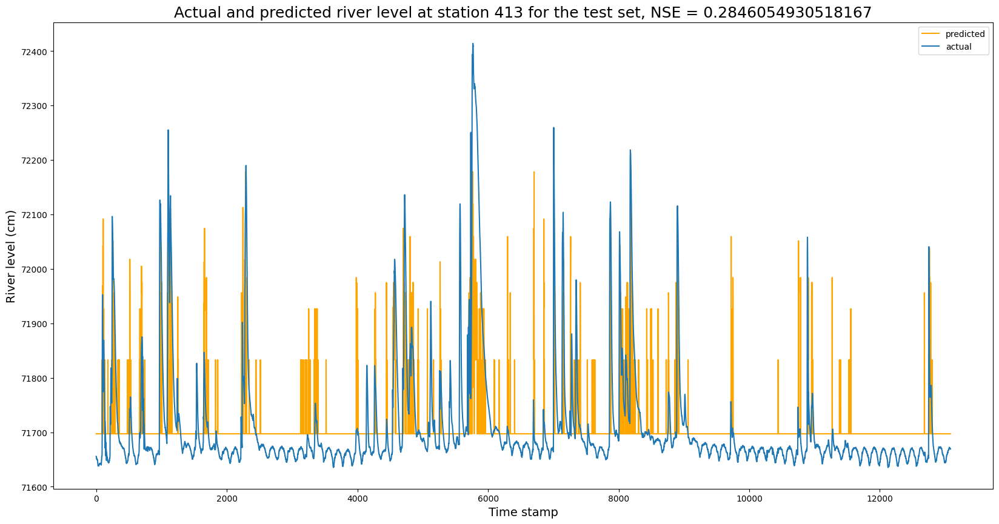

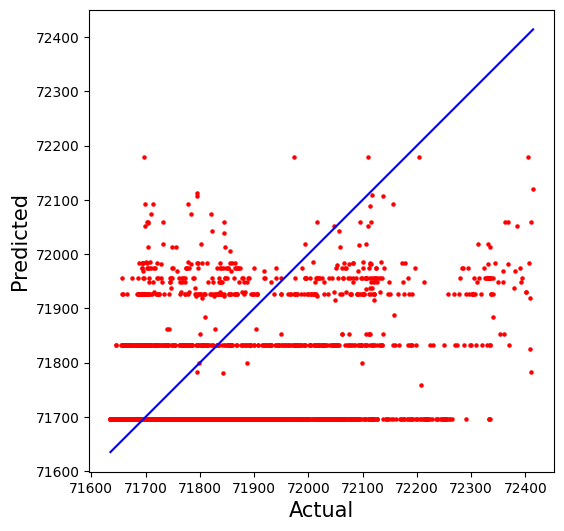

In [19]:
X_train = np.array(X_train_general['valor_leitura_plu_413(t-0)'])
X_val = np.array(X_val_general['valor_leitura_plu_413(t-0)'])
X_test = np.array(X_test_general['valor_leitura_plu_413(t-0)'])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

#Reshaping
X_train = X_train.reshape(-1,1)
X_val = X_val.reshape(-1,1)
X_test = X_test.reshape(-1,1)

rmse_train_list_1, nse_train_list_1, rmse_list_1, nse_list_1, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test)

## Exp. 2: Todos os pluviômetros da bacia

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


The average of the root mean squared error (RMSE) on train set: 61.5063
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.6045588741918468
The average of the root mean squared error (RMSE) on test set: 75.7579
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.4509636664816973


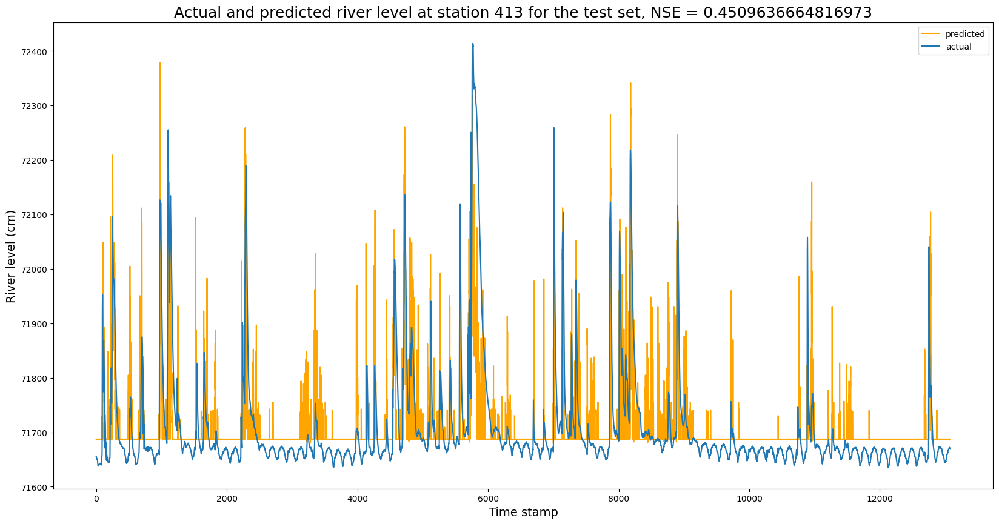

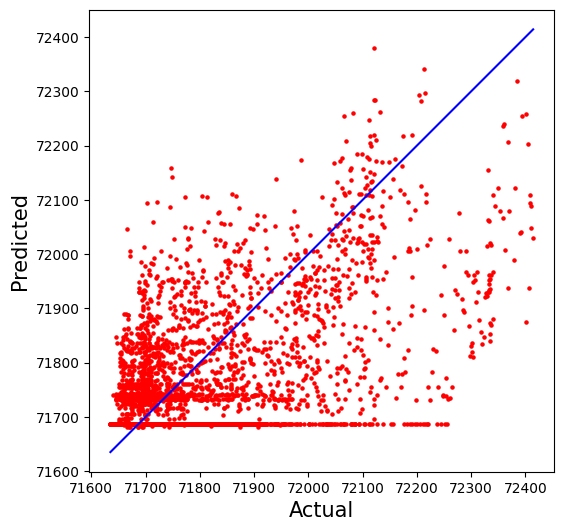

In [20]:
pluviometros = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome and '-0' in nome):
    pluviometros.append(nome)

X_train = np.array(X_train_general[pluviometros])
X_val = np.array(X_val_general[pluviometros])
X_test = np.array(X_test_general[pluviometros])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

rmse_train_list_2, nse_train_list_2, rmse_list_2, nse_list_2, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test)

## Exp. 3: Nível no exutório

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


The average of the root mean squared error (RMSE) on train set: 47.9020
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.7601444470521942
The average of the root mean squared error (RMSE) on test set: 59.1452
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.6653554828831758


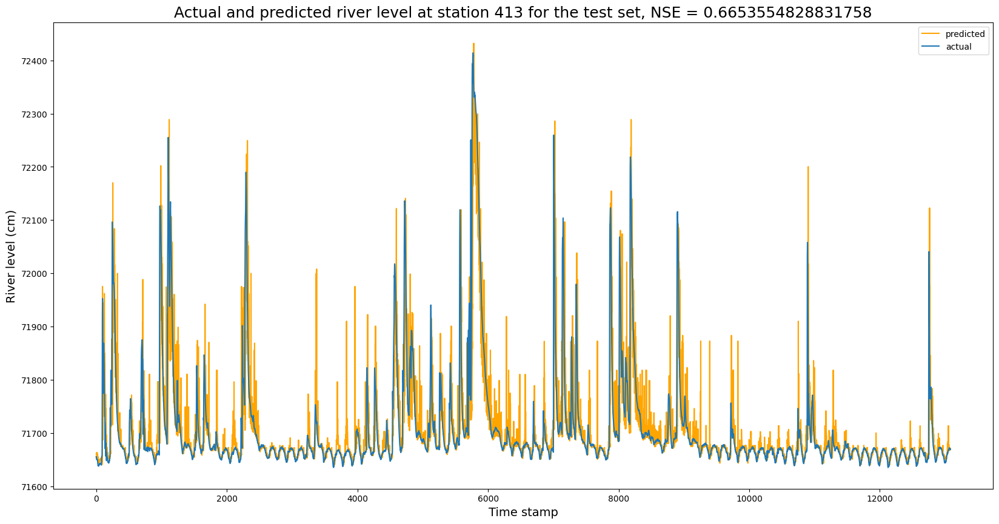

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


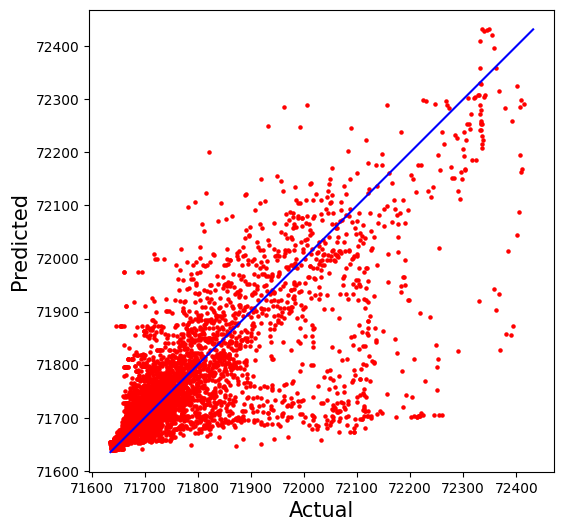

In [21]:
X_train = np.array(X_train_general['valor_leitura_flu_413(t-0)'])
X_val = np.array(X_val_general['valor_leitura_flu_413(t-0)'])
X_test = np.array(X_test_general['valor_leitura_flu_413(t-0)'])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

#Reshaping
X_train = X_train.reshape(-1,1)
X_val = X_val.reshape(-1,1)
X_test = X_test.reshape(-1,1)

rmse_train_list_3, nse_train_list_3, rmse_list_3, nse_list_3, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test)

## Exp. 4: Nível no exutório e pluviômetro no exutório

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


The average of the root mean squared error (RMSE) on train set: 40.3991
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.829397036296059
The average of the root mean squared error (RMSE) on test set: 54.7507
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.7132362644772403


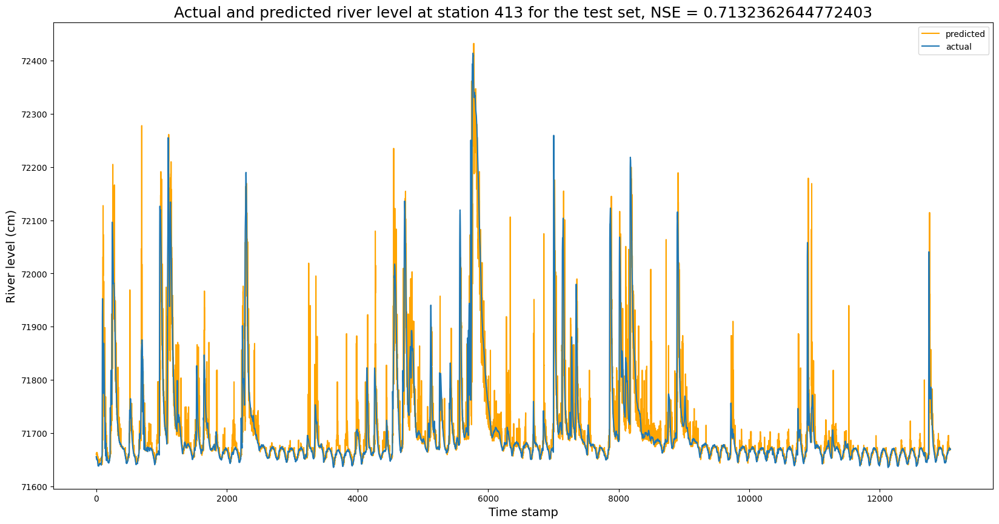

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


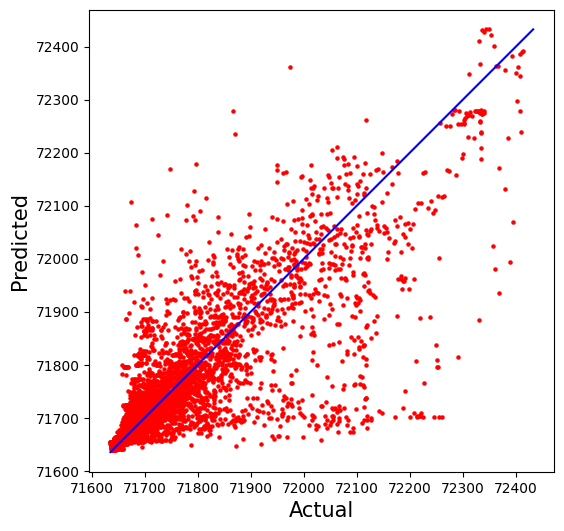

In [22]:
X_train = np.array(X_train_general[['valor_leitura_flu_413(t-0)','valor_leitura_plu_413(t-0)']])
X_val = np.array(X_val_general[['valor_leitura_flu_413(t-0)','valor_leitura_plu_413(t-0)']])
X_test = np.array(X_test_general[['valor_leitura_flu_413(t-0)','valor_leitura_plu_413(t-0)']])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

rmse_train_list_4, nse_train_list_4, rmse_list_4, nse_list_4, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test)

## Exp. 5: Nível exutório e todos os pluviômetros da bacia

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


The average of the root mean squared error (RMSE) on train set: 27.2198
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.9225513605227771
The average of the root mean squared error (RMSE) on test set: 44.5880
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.8098126842417243


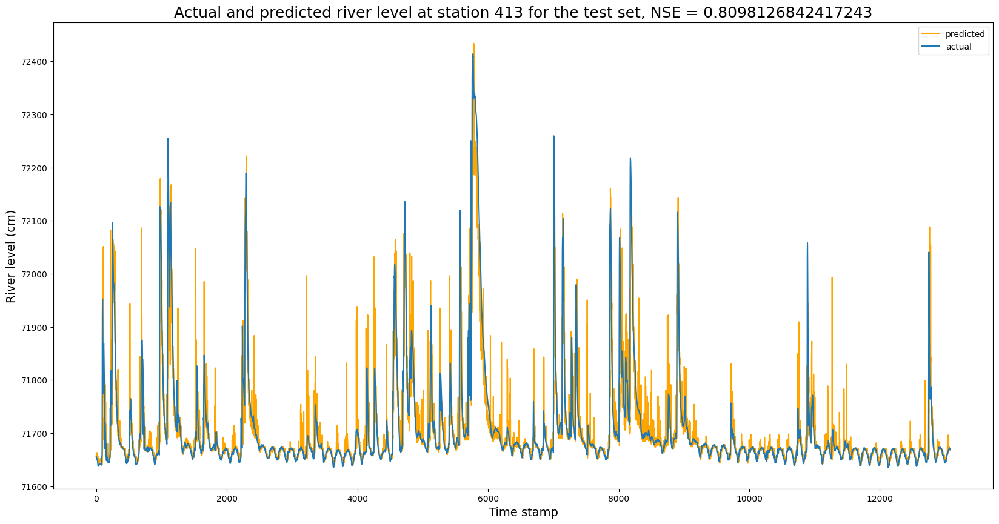

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


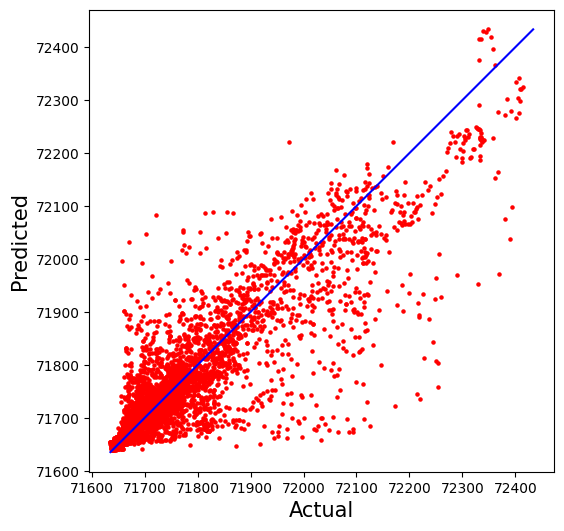

In [23]:
entradas = []
entradas.append('valor_leitura_flu_413(t-0)')
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome and '-0' in nome):
    entradas.append(nome)


X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

rmse_train_list_5, nse_train_list_5, rmse_list_5, nse_list_5, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test)

In [24]:
# Bônus
# Testando XGBoost
#rmse_train_list_5, nse_train_list_5, rmse_list_5, nse_list_5, importances = fit_and_evaluate_xgboost(X_train,y_train,X_val,y_val, X_test,y_test)

## Exp. 6: Nível exutório e níveis a montante

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


The average of the root mean squared error (RMSE) on train set: 12.0651
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.984783984080348
The average of the root mean squared error (RMSE) on test set: 51.4289
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.7469775905517415


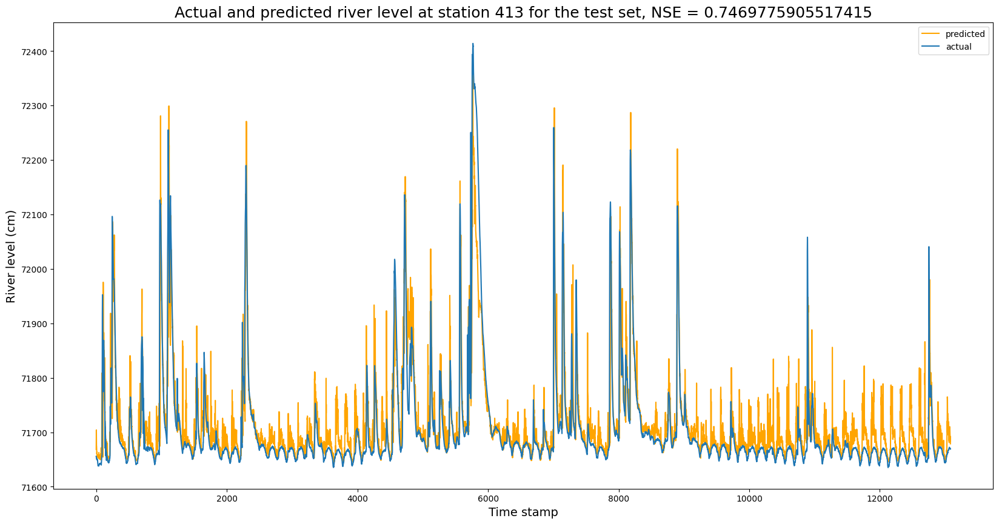

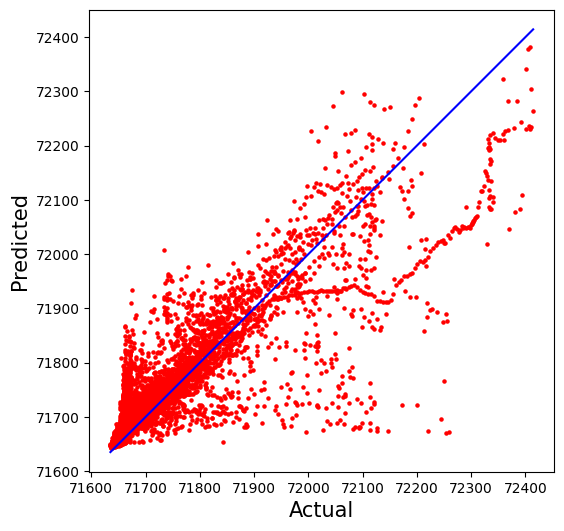

In [25]:
entradas = []
for nome in X_train_general.columns:
  if ('flu' in nome and '-0' in nome):
    entradas.append(nome)

X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

rmse_train_list_6, nse_train_list_6, rmse_list_6, nse_list_6, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test)

## Exp. 7: Nível exutório, níveis a montante e todos os pluviômetros da bacia

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


The average of the root mean squared error (RMSE) on train set: 11.0718
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.9871862244382202
The average of the root mean squared error (RMSE) on test set: 45.7429
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.7998329856037237


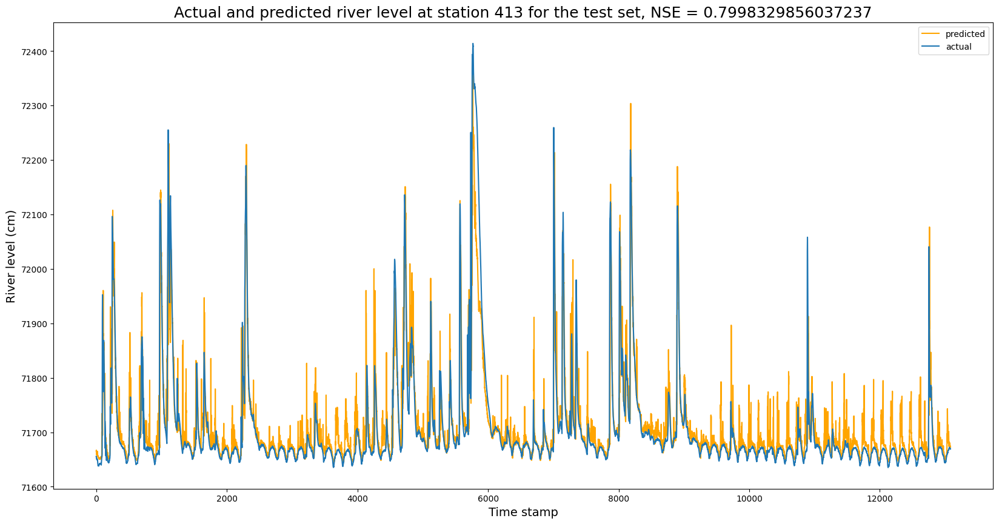

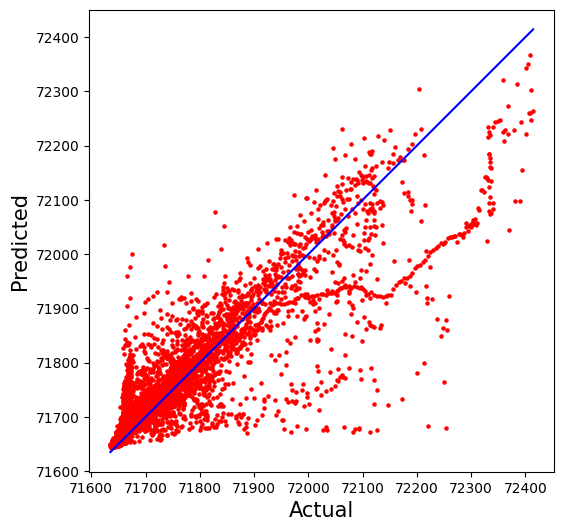

In [26]:
entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('-0' in nome):
    entradas.append(nome)

X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

rmse_train_list_7, nse_train_list_7, rmse_list_7, nse_list_7, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test)

## Comparação de Performances

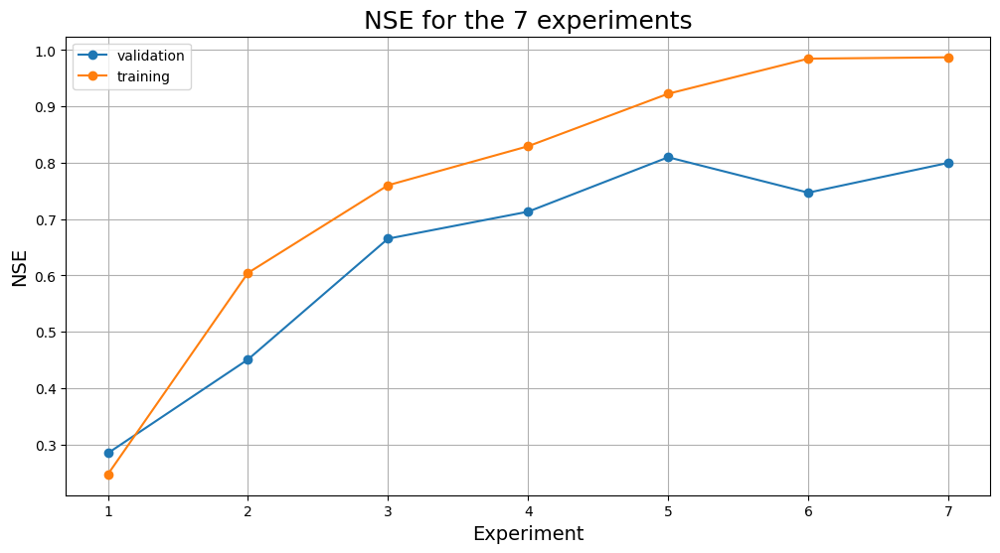

In [27]:
plt.figure(figsize=(12, 6))
plt.plot([1,2,3,4,5,6,7], [nse_list_1,nse_list_2,nse_list_3,nse_list_4,nse_list_5,nse_list_6,nse_list_7], marker = 'o', label = 'validation')
plt.plot([1,2,3,4,5,6,7], [nse_train_list_1,nse_train_list_2,nse_train_list_3,nse_train_list_4,nse_train_list_5,nse_train_list_6,nse_train_list_7], marker = 'o', label = 'training')
plt.title(f'NSE for the 7 experiments',fontsize=18)
plt.ylabel('NSE',fontsize=14)
plt.xlabel('Experiment',fontsize=14)
plt.grid(linestyle='-')
#plt.xticks([0, 1, 2, 3, 4, 5, 6, 7], ['e1', 'e2', 'e3', 'e4','e5','e6','e7'],rotation=20)  # Set text labels and properties
plt.legend()
plt.show()

## Experimentos Markovianos com Random Forest Otimizados com Optuna (Validando em 2020)

## Exp.1: Pluviômetro exutório

In [34]:
X_train = np.array(X_train_general['valor_leitura_plu_413(t-0)'])
X_val = np.array(X_val_general['valor_leitura_plu_413(t-0)'])
X_test = np.array(X_test_general['valor_leitura_plu_413(t-0)'])
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

#Reshaping
X_train = X_train.reshape(-1,1)
X_val = X_val.reshape(-1,1)
X_test = X_test.reshape(-1,1)

In [35]:
# Otimizando com Optunas
trial, n_estimators_1, max_depth_1, min_samples_split_1, min_samples_leaf_1 = run_optuna(n_trials=50)
print(f"N_estimators: {n_estimators_1}, max_depth: {max_depth_1}, min_samples_split: {min_samples_split_1}, min_samples_leaf: {min_samples_leaf_1}")

[I 2024-07-24 21:35:32,450] A new study created in memory with name: no-name-97c6996e-533a-47de-8635-b4f3fab611ef


N_estimators: 250, max_depth: 4, min_samples_split: 13, min_samples_leaf: 20


The average of the root mean squared error (RMSE) on train set: 85.2570
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.2401952678048428
The average of the root mean squared error (RMSE) on test set: 85.7912
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.29590678377877444


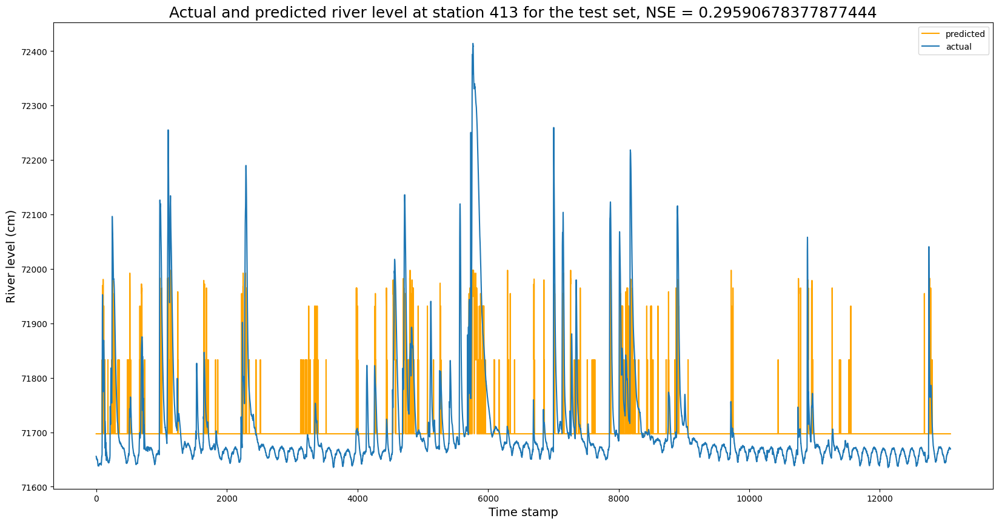

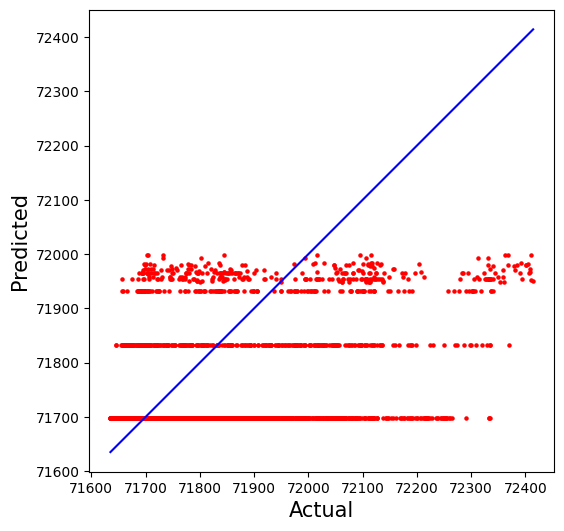

In [30]:
n_estimators_1 = 150
max_depth_1 = 4
min_samples_split_1 = 9
min_samples_leaf_1 = 14
rmse_train_list_1_optuna, nse_train_list_1_optuna, rmse_list_1_optuna, nse_list_1_optuna, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test,n_estimators = n_estimators_1, max_depth = max_depth_1, min_samples_split = min_samples_split_1, min_samples_leaf = min_samples_leaf_1)

## Exp. 2: Todos os pluviômetros da bacia

In [31]:
pluviometros = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome and '-0' in nome):
    pluviometros.append(nome)

X_train = np.array(X_train_general[pluviometros])
X_val = np.array(X_val_general[pluviometros])
X_test = np.array(X_test_general[pluviometros])
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()


In [32]:
trial, n_estimators_2, max_depth_2, min_samples_split_2, min_samples_leaf_2 = run_optuna(n_trials=50)
print(f"N_estimators: {n_estimators_2}, max_depth: {max_depth_2}, min_samples_split: {min_samples_split_2}, min_samples_leaf: {min_samples_leaf_2}")

NameError: name 'run_optuna' is not defined

The average of the root mean squared error (RMSE) on train set: 70.4970
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.4805030414173318
The average of the root mean squared error (RMSE) on test set: 74.3710
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.47088223572915466


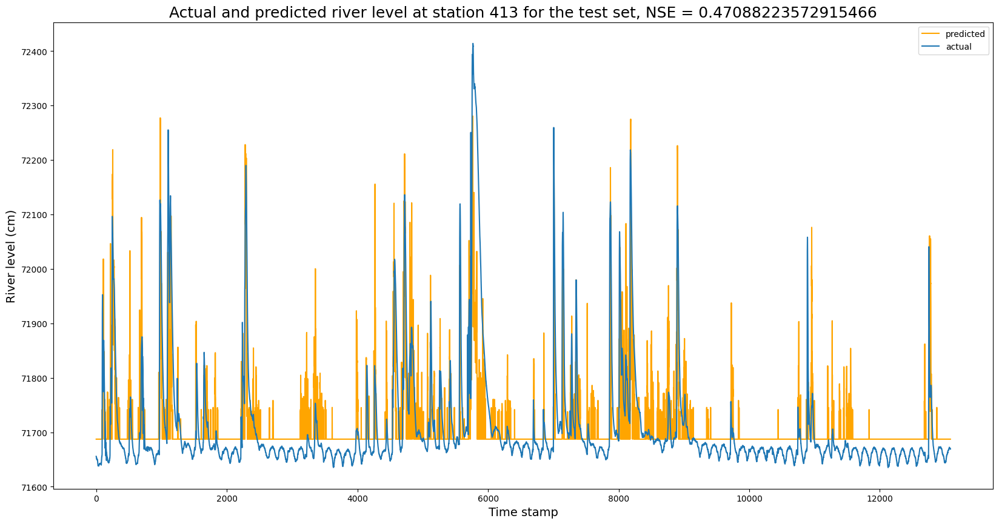

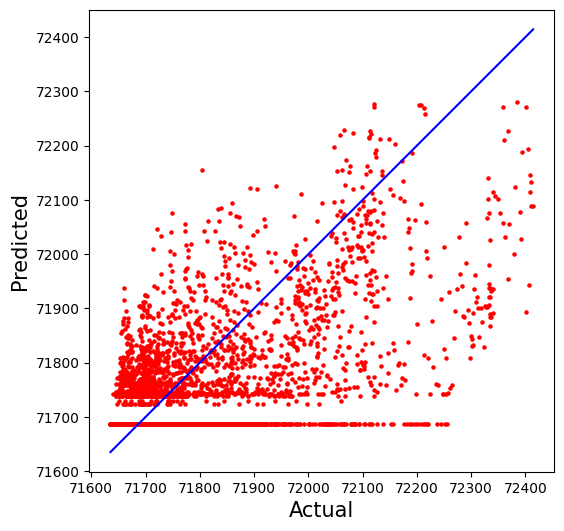

In [ ]:
n_estimators_2 = 200
max_depth_2 = 16
min_samples_split_2 = 19
min_samples_leaf_2 = 18
rmse_train_list_2_optuna, nse_train_list_2_optuna, rmse_list_2_optuna, nse_list_2_optuna, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test,n_estimators = n_estimators_2, max_depth = max_depth_2, min_samples_split = min_samples_split_2, min_samples_leaf = min_samples_leaf_2)

## Exp. 3: Nível no exutório

In [ ]:
X_train = np.array(X_train_general['valor_leitura_flu_413(t-0)'])
X_val = np.array(X_val_general['valor_leitura_flu_413(t-0)'])
X_test = np.array(X_test_general['valor_leitura_flu_413(t-0)'])
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

#Reshaping
X_train = X_train.reshape(-1,1)
X_val = X_val.reshape(-1,1)
X_test = X_test.reshape(-1,1)

N_estimators: 50, max_depth: 19, min_samples_split: 16, min_samples_leaf: 20
The average of the root mean squared error (RMSE) on train set: 54.2232
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.6926650734828472
The average of the root mean squared error (RMSE) on test set: 54.5730
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.7150942774706287


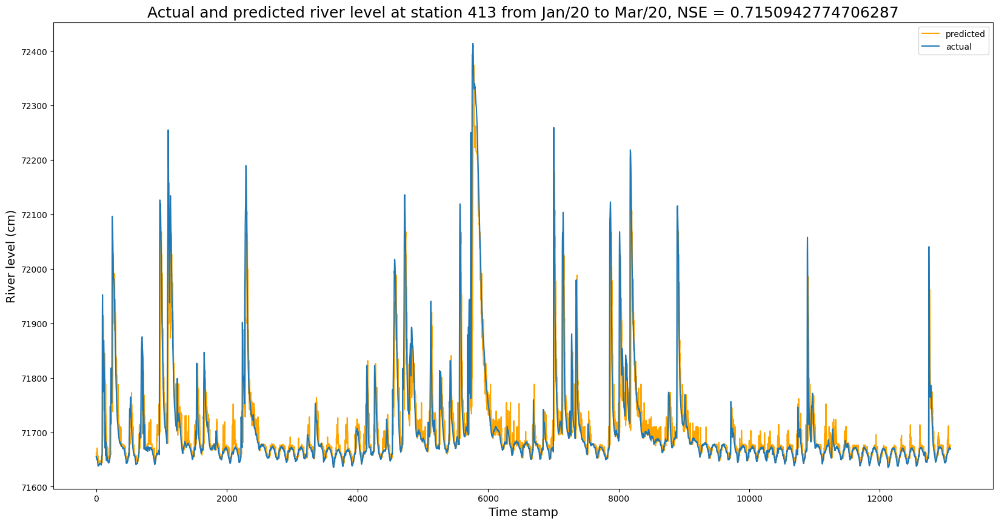

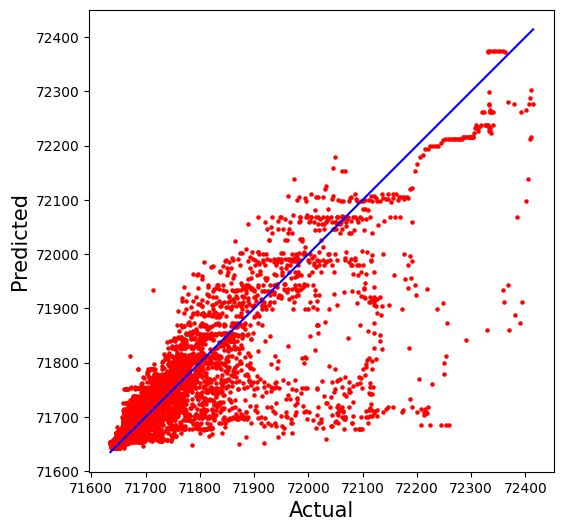

In [ ]:
trial, n_estimators_3, max_depth_3, min_samples_split_3, min_samples_leaf_3 = run_optuna(n_trials=50)
print(f"N_estimators: {n_estimators_3}, max_depth: {max_depth_3}, min_samples_split: {min_samples_split_3}, min_samples_leaf: {min_samples_leaf_3}")

The average of the root mean squared error (RMSE) on train set: 54.2232
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.6926650734828474
The average of the root mean squared error (RMSE) on test set: 54.5730
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.7150942774706279


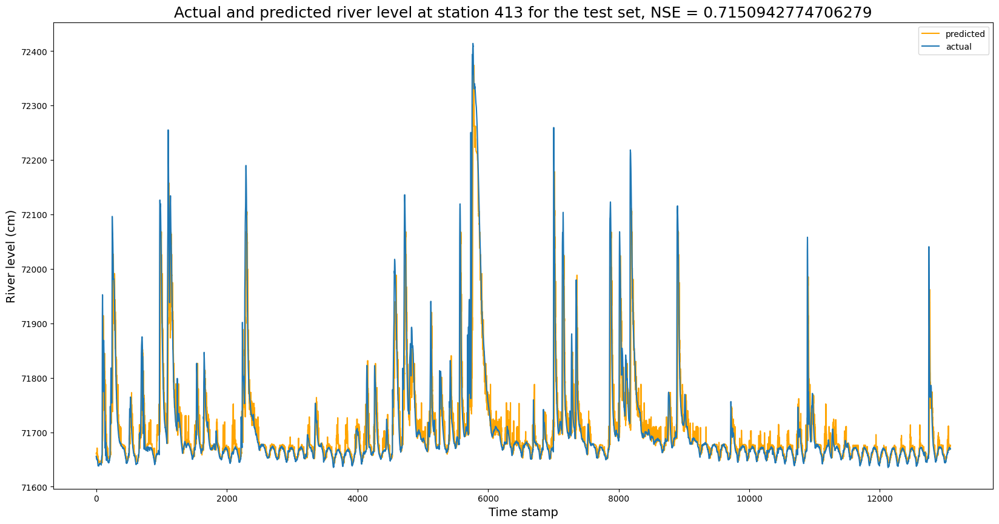

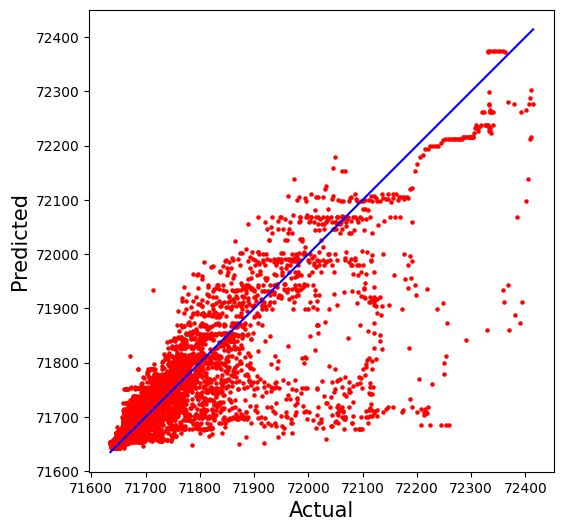

In [ ]:
n_estimators_3 = 50
max_depth_3 = 19
min_samples_split_3 = 16
min_samples_leaf_3 = 20
rmse_train_list_3_optuna, nse_train_list_3_optuna, rmse_list_3_optuna, nse_list_3_optuna, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test,n_estimators = n_estimators_3, max_depth = max_depth_3, min_samples_split = min_samples_split_3, min_samples_leaf = min_samples_leaf_3)

## Exp. 4: Nível no exutório e pluviômetro no exutório

In [ ]:
X_train = np.array(X_train_general[['valor_leitura_flu_413(t-0)','valor_leitura_plu_413(t-0)']])
X_val = np.array(X_val_general[['valor_leitura_flu_413(t-0)','valor_leitura_plu_413(t-0)']])
X_test = np.array(X_test_general[['valor_leitura_flu_413(t-0)','valor_leitura_plu_413(t-0)']])
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

N_estimators: 200, max_depth: 20, min_samples_split: 11, min_samples_leaf: 20
The average of the root mean squared error (RMSE) on train set: 49.5548
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.7433070349755235
The average of the root mean squared error (RMSE) on test set: 50.6497
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.7545858556326915


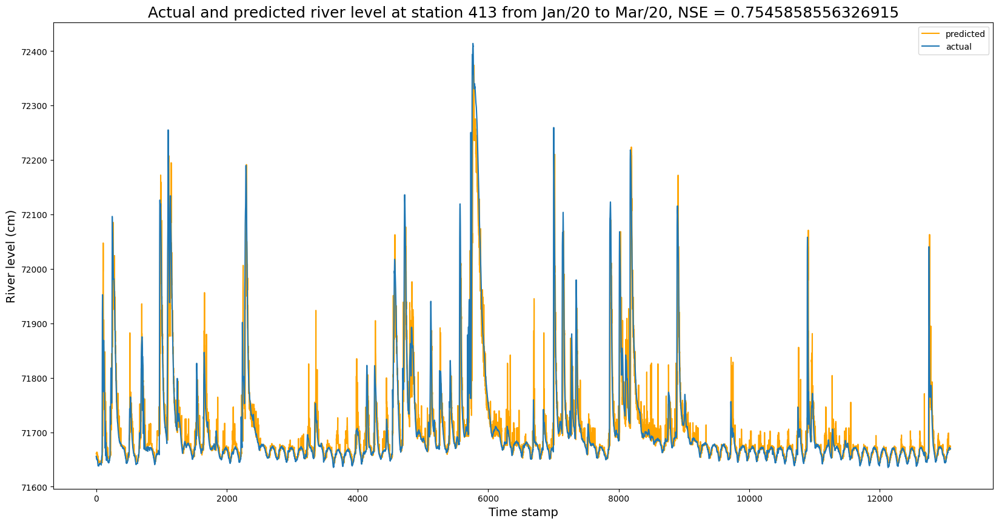

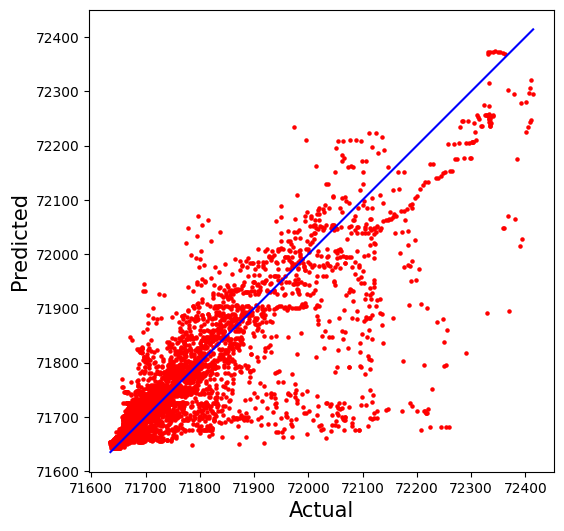

In [ ]:
trial, n_estimators_4, max_depth_4, min_samples_split_4, min_samples_leaf_4 = run_optuna(n_trials=50)
print(f"N_estimators: {n_estimators_4}, max_depth: {max_depth_4}, min_samples_split: {min_samples_split_4}, min_samples_leaf: {min_samples_leaf_4}")

The average of the root mean squared error (RMSE) on train set: 49.5548
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.7433070349755231
The average of the root mean squared error (RMSE) on test set: 50.6497
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.7545858556326914


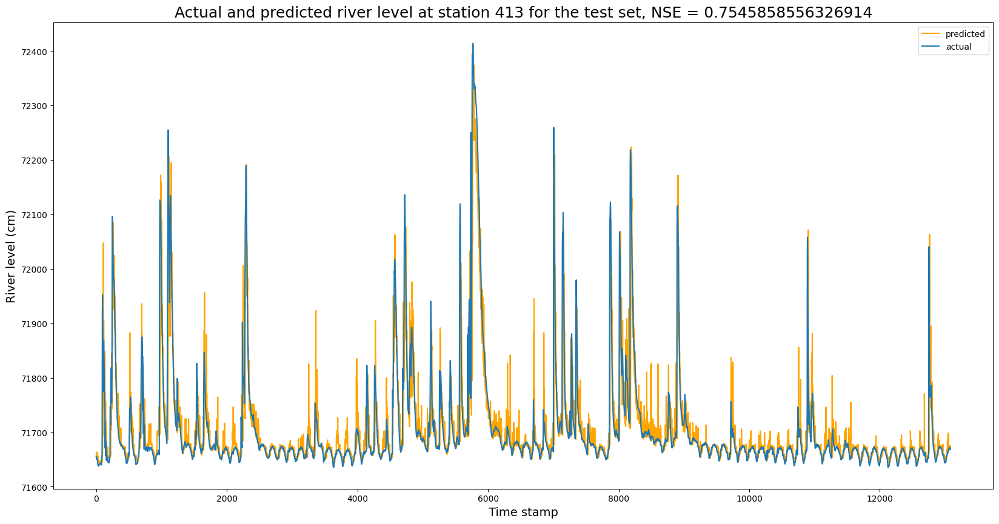

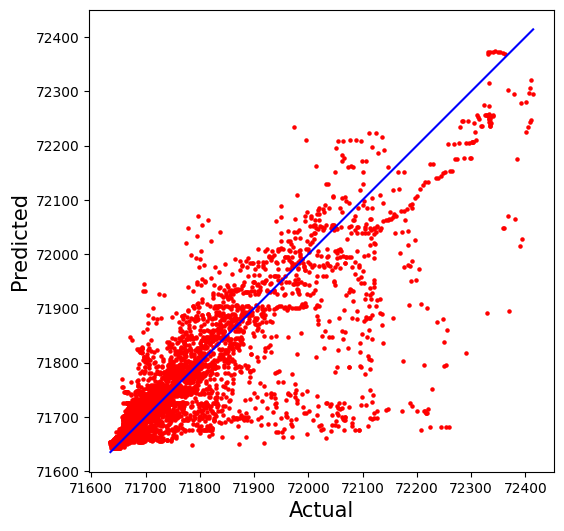

In [ ]:
n_estimators_4 = 200
max_depth_4 = 20
min_samples_split_4 = 11
min_samples_leaf_4 =  20
rmse_train_list_4_optuna, nse_train_list_4_optuna, rmse_list_4_optuna, nse_list_4_optuna, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test,n_estimators = n_estimators_4, max_depth = max_depth_4, min_samples_split = min_samples_split_4, min_samples_leaf = min_samples_leaf_4)

## Exp. 5: Nível exutório e todos os pluviômetros da bacia

In [ ]:
entradas = []
entradas.append('valor_leitura_flu_413(t-0)')
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome and '-0' in nome):
    entradas.append(nome)

X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

N_estimators: 200, max_depth: 18, min_samples_split: 20, min_samples_leaf: 4
The average of the root mean squared error (RMSE) on train set: 36.9951
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.8569355053384653
The average of the root mean squared error (RMSE) on test set: 42.6544
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.8259505231535897


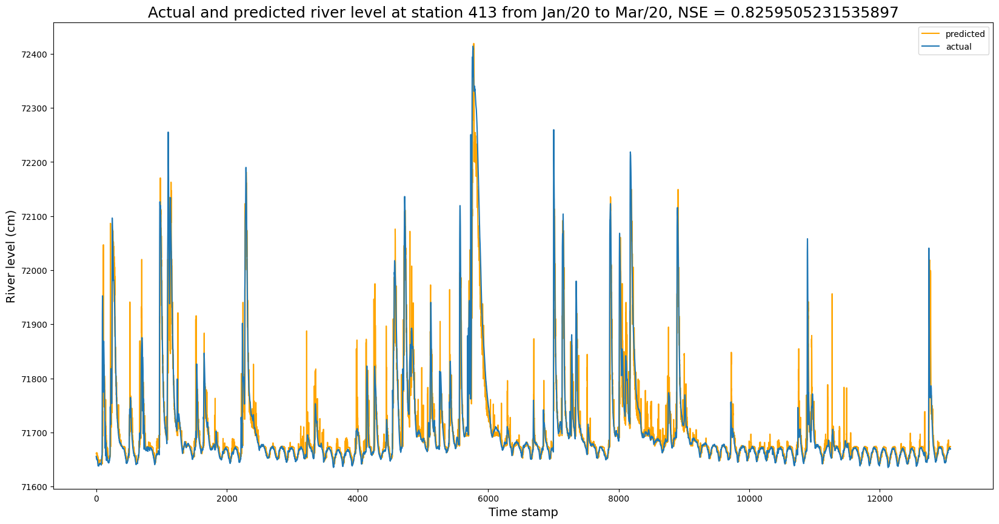

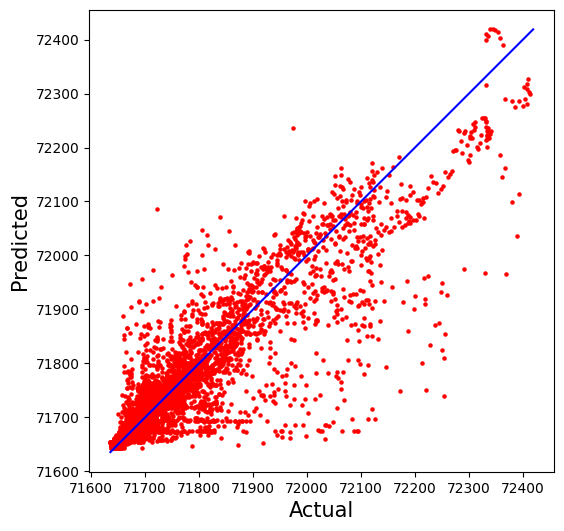

In [ ]:
trial, n_estimators_5, max_depth_5, min_samples_split_5, min_samples_leaf_5 = run_optuna(n_trials=50)
print(f"N_estimators: {n_estimators_5}, max_depth: {max_depth_5}, min_samples_split: {min_samples_split_5}, min_samples_leaf: {min_samples_leaf_5}")

The average of the root mean squared error (RMSE) on train set: 36.9951
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.8569355053384649
The average of the root mean squared error (RMSE) on test set: 42.6544
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.8259505231535903


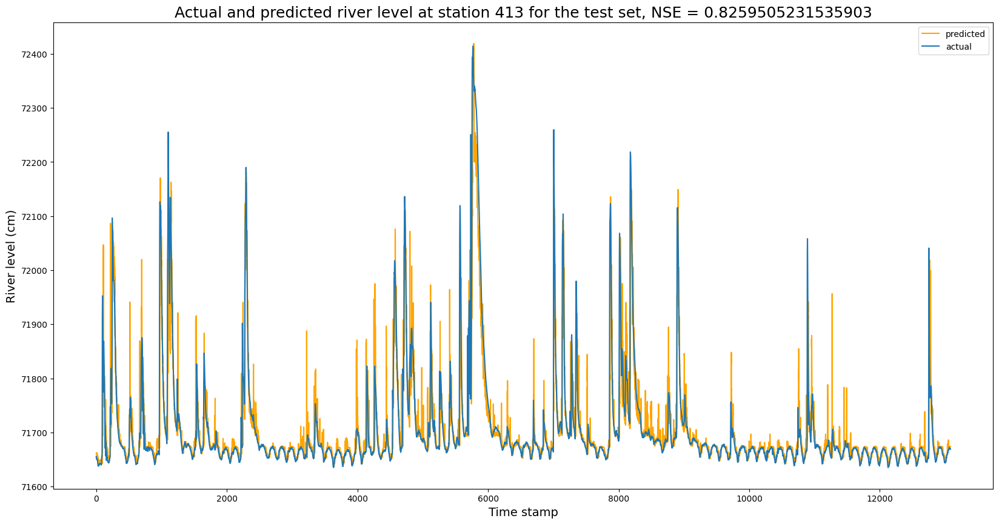

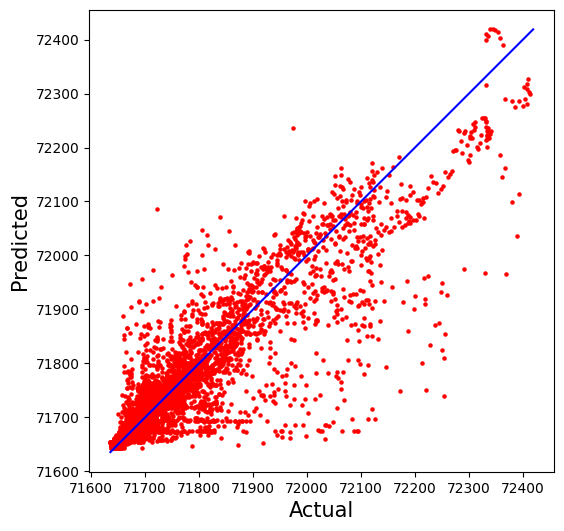

In [ ]:
n_estimators_5 =  200
max_depth_5 = 18
min_samples_split_5 =  20
min_samples_leaf_5 = 4
rmse_train_list_5_optuna, nse_train_list_5_optuna, rmse_list_5_optuna, nse_list_5_optuna, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test,n_estimators = n_estimators_5, max_depth = max_depth_5, min_samples_split = min_samples_split_5, min_samples_leaf = min_samples_leaf_5)

In [ ]:
# Bônus
# Testando XGBoost
#trial, max_depth_5, learning_rate_5 , n_estimators_5, min_child_weight_5, gamma_5, subsample_5, colsample_bytree_5, reg_alpha_5, reg_lambda_5, = run_optuna_xgb(n_trials=50)
#rmse_train_list_5, nse_train_list_5, rmse_list_5, nse_list_5, importances = fit_and_evaluate_xgboost(X_train,y_train,X_val,y_val, X_test,y_test, max_depth = max_depth_5, learning_rate = learning_rate_5, n_estimators = n_estimators_5, min_child_weight = min_child_weight_5, gamma = gamma_5,subsample = subsample_5, colsample_bytree = colsample_bytree_5, reg_alpha = reg_alpha_5, reg_lambda = reg_lambda_5)

## Exp. 6: Nível exutório e níveis a montante

In [ ]:
entradas = []
for nome in X_train_general.columns:
  if ('flu' in nome and '-0' in nome):
    entradas.append(nome)

X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

N_estimators: 150, max_depth: 15, min_samples_split: 20, min_samples_leaf: 3
The average of the root mean squared error (RMSE) on train set: 31.5369
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.8960368169053428
The average of the root mean squared error (RMSE) on test set: 47.1472
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.7873538882051954


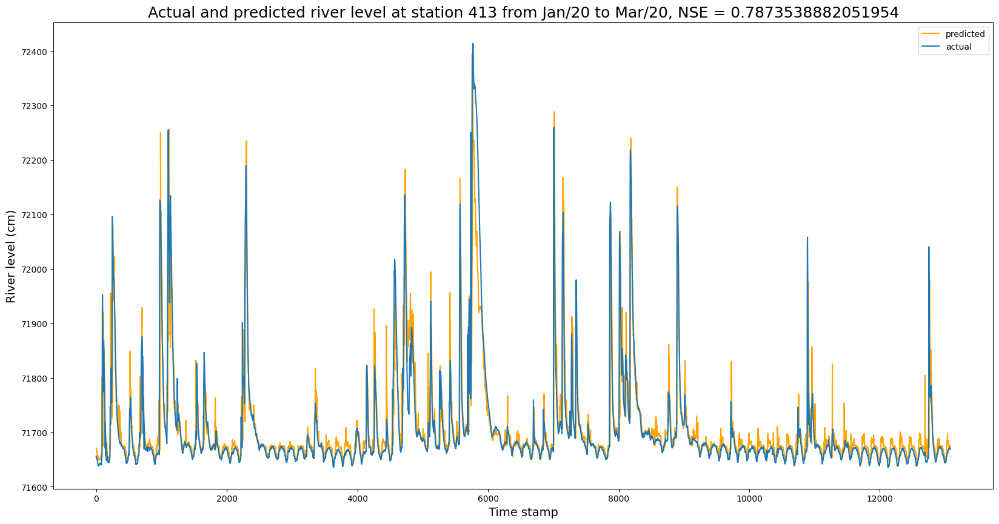

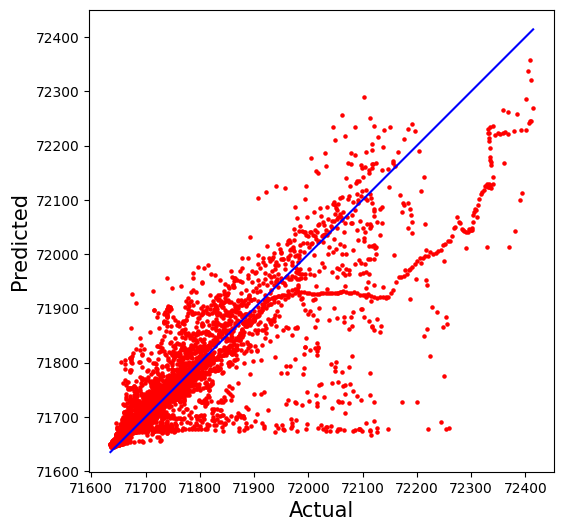

In [ ]:
trial, n_estimators_6, max_depth_6, min_samples_split_6, min_samples_leaf_6 = run_optuna(n_trials=50)
print(f"N_estimators: {n_estimators_6}, max_depth: {max_depth_6}, min_samples_split: {min_samples_split_6}, min_samples_leaf: {min_samples_leaf_6}")

The average of the root mean squared error (RMSE) on train set: 31.5369
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.8960368169053423
The average of the root mean squared error (RMSE) on test set: 47.1472
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.7873538882051958


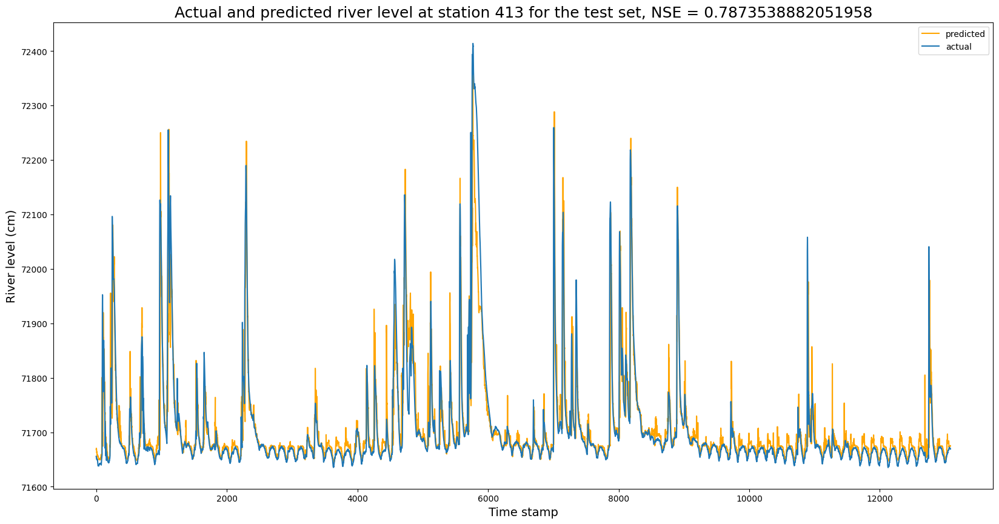

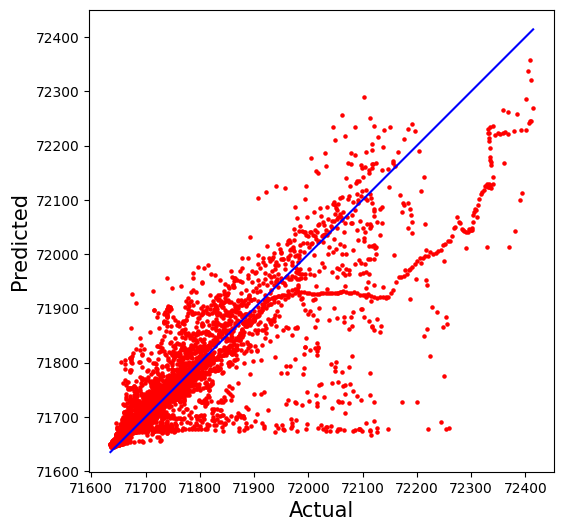

In [ ]:
n_estimators_6 = 150
max_depth_6 = 15
min_samples_split_6 = 20
min_samples_leaf_6 = 3
rmse_train_list_6_optuna, nse_train_list_6_optuna, rmse_list_6_optuna, nse_list_6_optuna, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test,n_estimators = n_estimators_6, max_depth = max_depth_6, min_samples_split = min_samples_split_6, min_samples_leaf = min_samples_leaf_6)

## Exp. 7: Nível exutório, níveis a montante e todos os pluviômetros da bacia

In [39]:
entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('-0' in nome):
    entradas.append(nome)

X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

N_estimators: 200, max_depth: 15, min_samples_split: 16, min_samples_leaf: 2
The average of the root mean squared error (RMSE) on train set: 27.1971
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.9226806617301786
The average of the root mean squared error (RMSE) on test set: 43.3222
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.8204582823160043


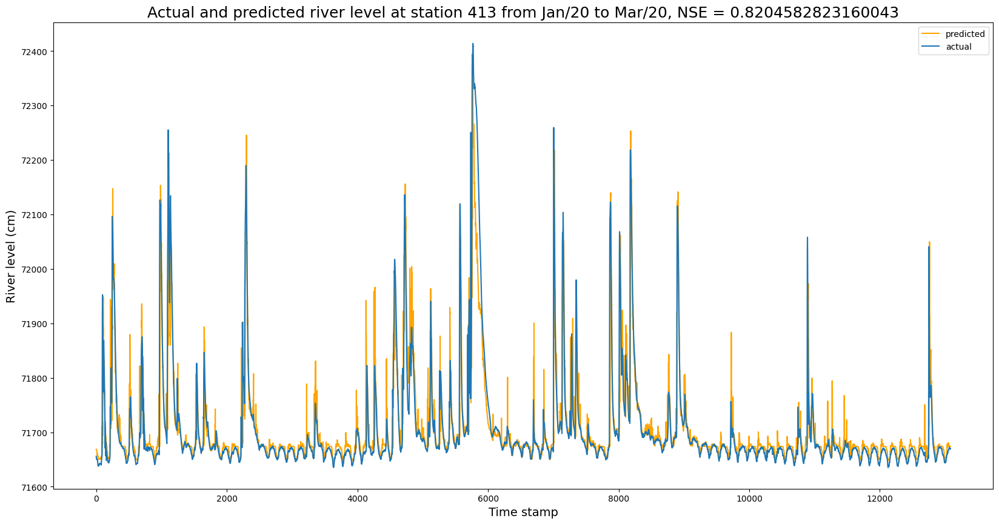

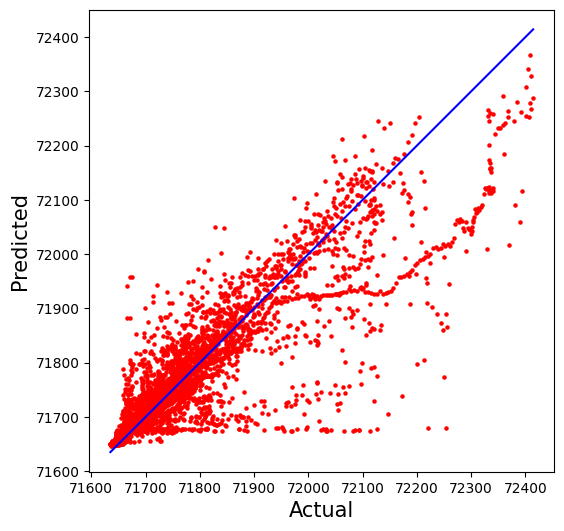

In [ ]:
trial, n_estimators_7, max_depth_7, min_samples_split_7, min_samples_leaf_7 = run_optuna(n_trials=50)
print(f"N_estimators: {n_estimators_7}, max_depth: {max_depth_7}, min_samples_split: {min_samples_split_7}, min_samples_leaf: {min_samples_leaf_7}")

The average of the root mean squared error (RMSE) on train set: 26.2845
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.9277823693011417
The average of the root mean squared error (RMSE) on test set: 43.3557
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.8201797787492217


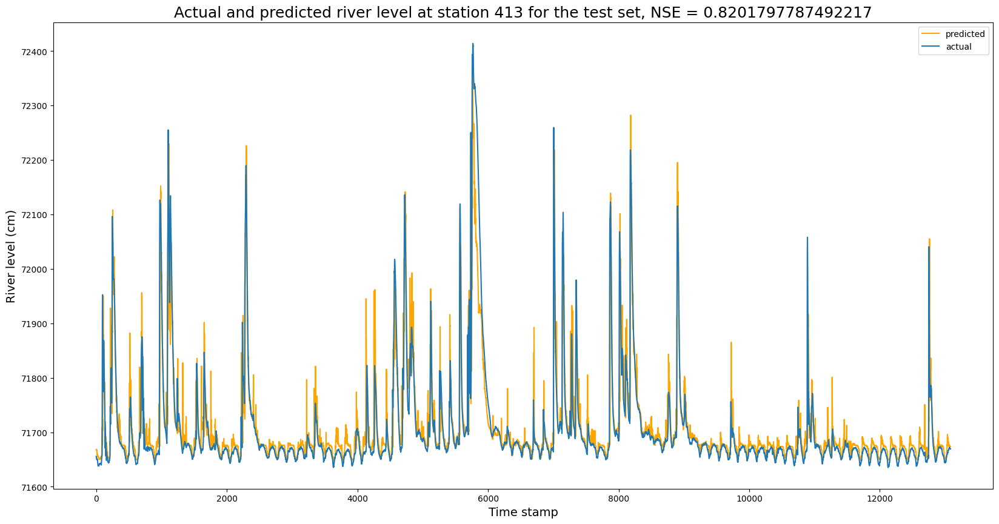

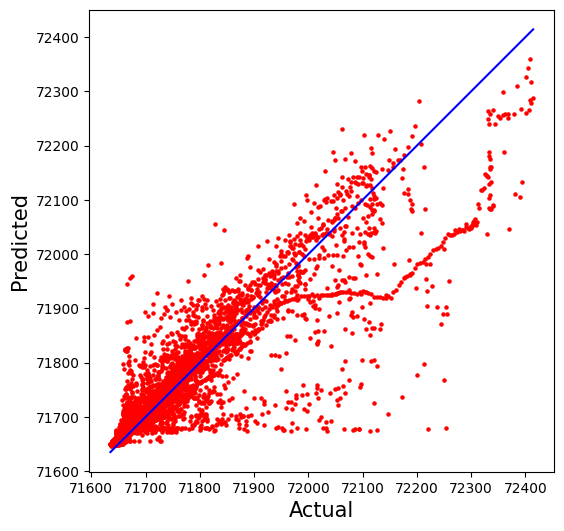

In [40]:
n_estimators_7 = 200
max_depth_7 = 15
min_samples_split_7 = 16
min_samples_leaf_7 = 2
rmse_train_list_7_optuna, nse_train_list_7_optuna, rmse_list_7_optuna, nse_list_7_optuna, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test,n_estimators = n_estimators_7, max_depth = max_depth_7, min_samples_split = min_samples_split_7, min_samples_leaf = min_samples_leaf_7)

## Comparação de Performances

In [46]:
# Valores obtidos do notebook da qualificação
nse_list_1_optuna = 0.296
nse_list_2_optuna = 0.471
nse_list_3_optuna = 0.715
nse_list_4_optuna = 0.755
nse_list_5_optuna = 0.826
nse_list_6_optuna = 0.787
nse_list_7_optuna = 0.820
nse_train_list_1_optuna = 0.240
nse_train_list_2_optuna = 0.481
nse_train_list_3_optuna = 0.693
nse_train_list_4_optuna = 0.743
nse_train_list_5_optuna = 0.857
nse_train_list_6_optuna = 0.896
nse_train_list_7_optuna = 0.923

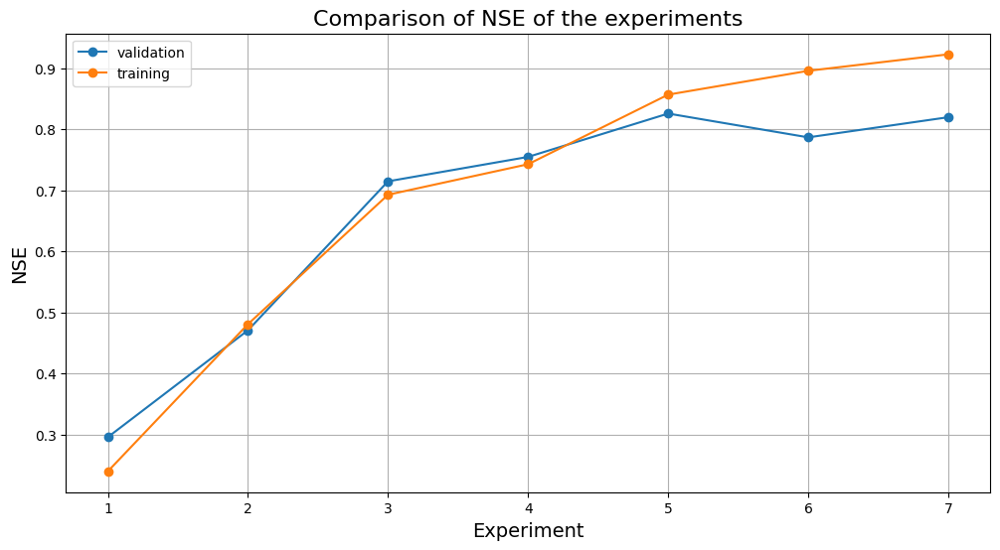

In [49]:
plt.figure(figsize=(12, 6))
plt.plot([1,2,3,4,5,6,7], [nse_list_1_optuna,nse_list_2_optuna,nse_list_3_optuna,nse_list_4_optuna,nse_list_5_optuna,nse_list_6_optuna,nse_list_7_optuna], marker = 'o', label = 'validation')
plt.plot([1,2,3,4,5,6,7], [nse_train_list_1_optuna,nse_train_list_2_optuna,nse_train_list_3_optuna,nse_train_list_4_optuna,nse_train_list_5_optuna,nse_train_list_6_optuna,nse_train_list_7_optuna], marker = 'o', label = 'training')
#plt.title(f'NSE for the 7 experiments (training with 18/19 and validating with 20)',fontsize=16)
plt.title('Comparison of NSE of the experiments',fontsize=16)
plt.ylabel('NSE',fontsize=14)
plt.xlabel('Experiment',fontsize=14)
plt.grid(linestyle='-')
plt.legend()
plt.show()

In [44]:
import plotly.graph_objects as px
plot = px.Figure(data=[px.Bar(
    name = 'Validation',
    x = [1,2,3,4,5,6,7],
    y = [nse_list_1_optuna,nse_list_2_optuna,nse_list_3_optuna,nse_list_4_optuna,nse_list_5_optuna,nse_list_6_optuna,nse_list_7_optuna]
   ),
    px.Bar(
    name = 'Training',
    x = [1,2,3,4,5,6,7],
    y = [nse_train_list_1_optuna,nse_train_list_2_optuna,nse_train_list_3_optuna,nse_train_list_4_optuna,nse_train_list_5_optuna,nse_train_list_6_optuna,nse_train_list_7_optuna]
   )
])
                  
plot.show()

## Experimentos Markovianos com Random Forest (Treinando com 2018+2019+2020 e Testando em 2021+2022)

In [ ]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019,df_2020], dataframes_validacao = [df_2021.drop(df_2021.index[3000:4000]), df_2022], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

## Exp. 1: Só Pluviômetro Exutório

<ipython-input-9-73a65f936368>:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


The average of the root mean squared error (RMSE) on train set: 85.3163
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.26211044030726494
The average of the root mean squared error (RMSE) on test set: 77.3801
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.16311691303673326


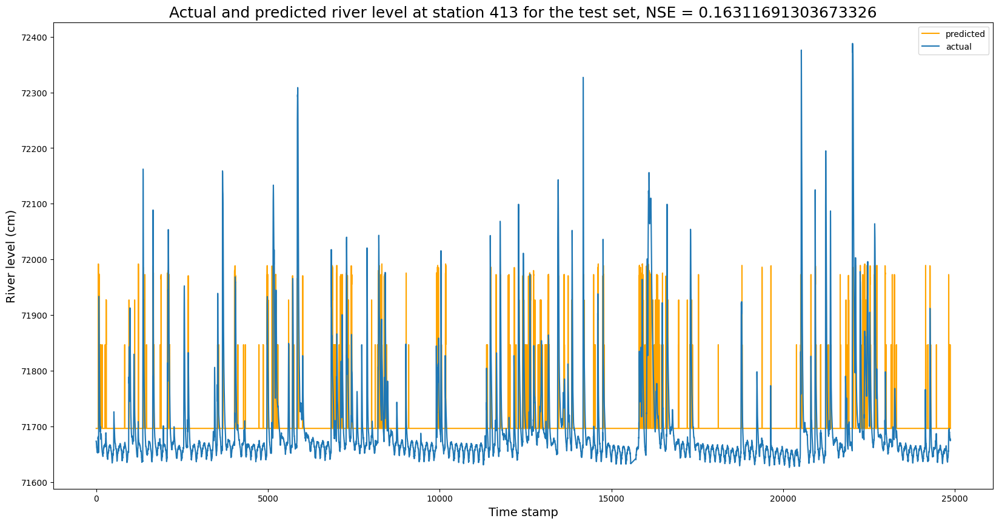

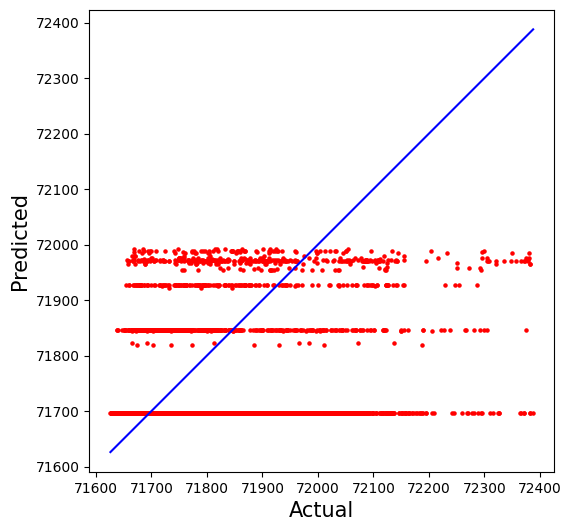

In [ ]:
X_train = np.array(X_train_general['valor_leitura_plu_413(t-0)'])
X_val = np.array(X_val_general['valor_leitura_plu_413(t-0)'])
X_test = np.array(X_test_general['valor_leitura_plu_413(t-0)'])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

#Reshaping
X_train = X_train.reshape(-1,1)
X_val = X_val.reshape(-1,1)
X_test = X_test.reshape(-1,1)

n_estimators_1 = 150
max_depth_1 = 4
min_samples_split_1 = 9
min_samples_leaf_1 = 14

rmse_train_list_1_2122, nse_train_list_1_2122, rmse_list_1_2122, nse_list_1_2122, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test,n_estimators = n_estimators_1, max_depth = max_depth_1, min_samples_split = min_samples_split_1, min_samples_leaf = min_samples_leaf_1)

## Exp. 2: Todos os pluviômetros da bacia

<ipython-input-9-73a65f936368>:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


The average of the root mean squared error (RMSE) on train set: 70.5879
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.4948881772290218
The average of the root mean squared error (RMSE) on test set: 65.6310
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.397962016799038


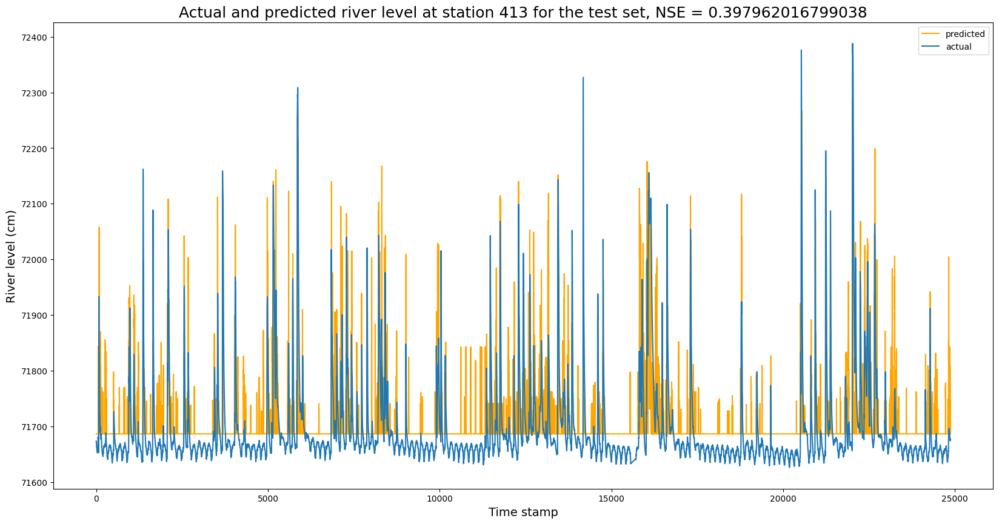

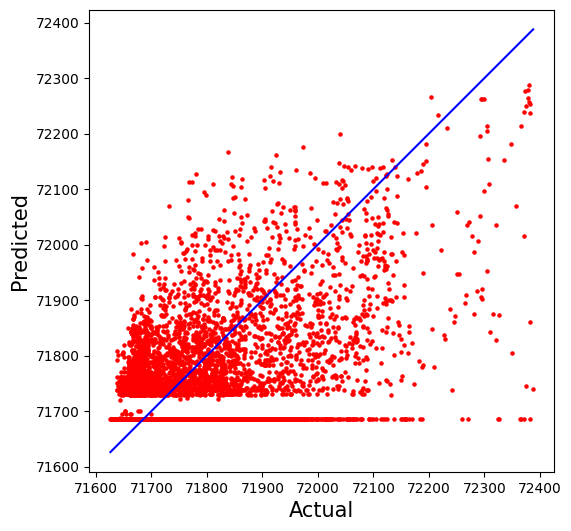

In [ ]:
pluviometros = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome and '-0' in nome):
    pluviometros.append(nome)

X_train = np.array(X_train_general[pluviometros])
X_val = np.array(X_val_general[pluviometros])
X_test = np.array(X_test_general[pluviometros])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

n_estimators_2 = 200
max_depth_2 = 16
min_samples_split_2 = 19
min_samples_leaf_2 = 18

rmse_train_list_2_2122, nse_train_list_2_2122, rmse_list_2_2122, nse_list_2_2122, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test,n_estimators = n_estimators_2, max_depth = max_depth_2, min_samples_split = min_samples_split_2, min_samples_leaf = min_samples_leaf_2)

Análise da importância das features

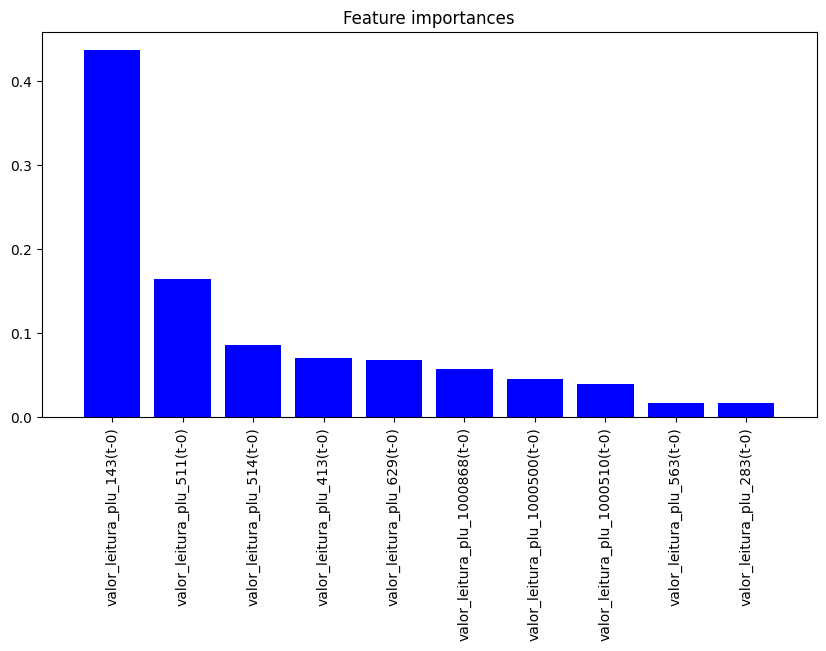

In [ ]:
feature_names = X_train_general[pluviometros].columns

# Based on: https://towardsdatascience.com/machine-learning-for-forecasting-supervised-learning-with-multivariate-time-series-b5b5044fe068
# Ordena as features pelo valor de importância
indices = np.argsort(importances)[::-1]

# Plota o gráfico de barras com os nomes das features
plt.figure(figsize=(10, 5))
plt.title("Feature importances")
plt.bar(range(10), importances[indices[0:10]],
        color="b", align="center")
plt.xticks(range(10), feature_names[indices[0:10]], rotation='vertical')
plt.xlim([-1, 10])

#plt.bar(range(X_train.shape[1]), importances[indices],
#        color="b", align="center")
#plt.xticks(range(X_train.shape[1]), feature_names[indices], rotation='vertical')
#plt.xlim([-1, X_train.shape[1]])
plt.show()

## Exp. 3: Nível no exutório

<ipython-input-9-73a65f936368>:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


The average of the root mean squared error (RMSE) on train set: 53.5256
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.7095638220411156
The average of the root mean squared error (RMSE) on test set: 56.7823
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.549357580263658


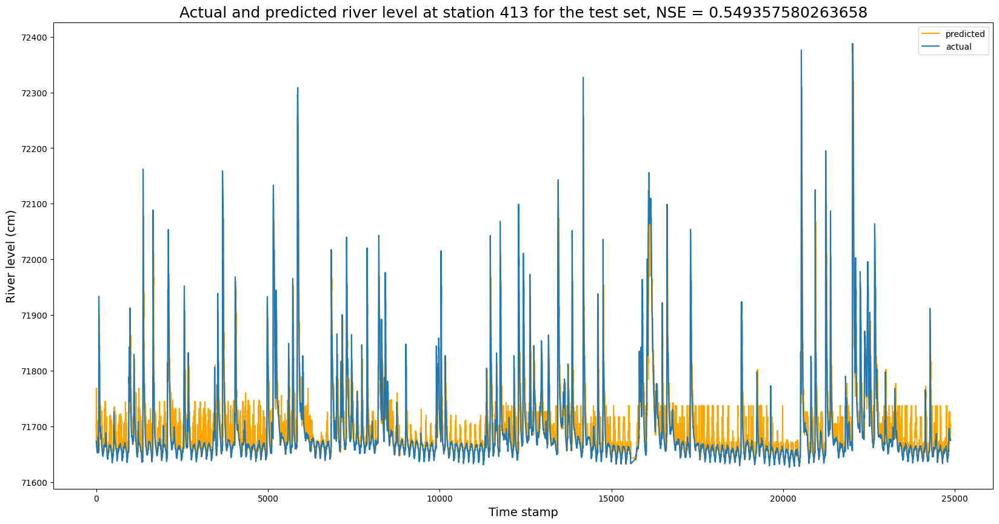

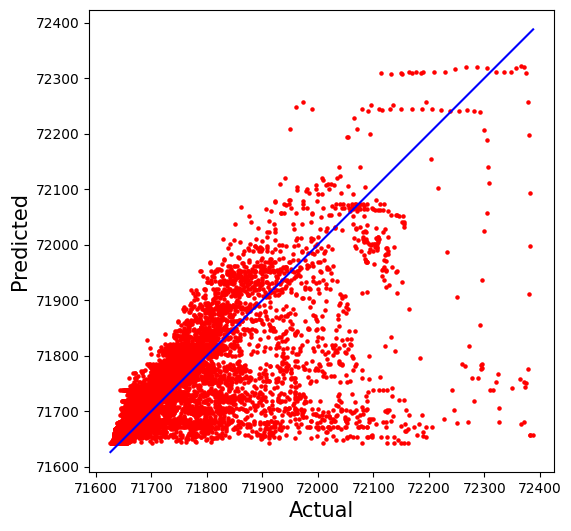

In [ ]:
X_train = np.array(X_train_general['valor_leitura_flu_413(t-0)'])
X_val = np.array(X_val_general['valor_leitura_flu_413(t-0)'])
X_test = np.array(X_test_general['valor_leitura_flu_413(t-0)'])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

#Reshaping
X_train = X_train.reshape(-1,1)
X_val = X_val.reshape(-1,1)
X_test = X_test.reshape(-1,1)

n_estimators_3 = 50
max_depth_3 = 19
min_samples_split_3 = 16
min_samples_leaf_3 = 20

rmse_train_list_3_2122, nse_train_list_3_2122, rmse_list_3_2122, nse_list_3_2122, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test,n_estimators = n_estimators_3, max_depth = max_depth_3, min_samples_split = min_samples_split_3, min_samples_leaf = min_samples_leaf_3)

## Exp. 4: Nível no exutório e pluviômetro no exutório

<ipython-input-9-73a65f936368>:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


The average of the root mean squared error (RMSE) on train set: 48.9855
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.7567446346761899
The average of the root mean squared error (RMSE) on test set: 53.7277
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.5965384724539385


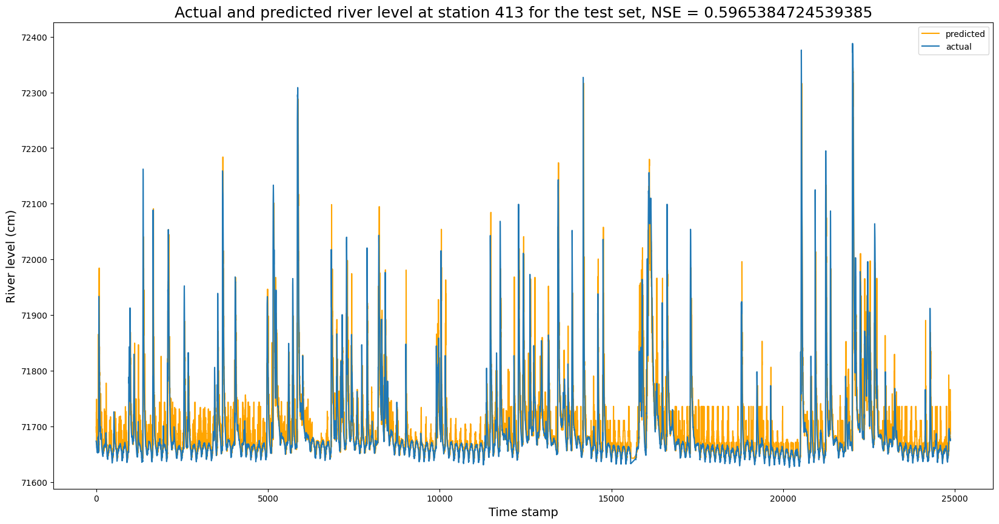

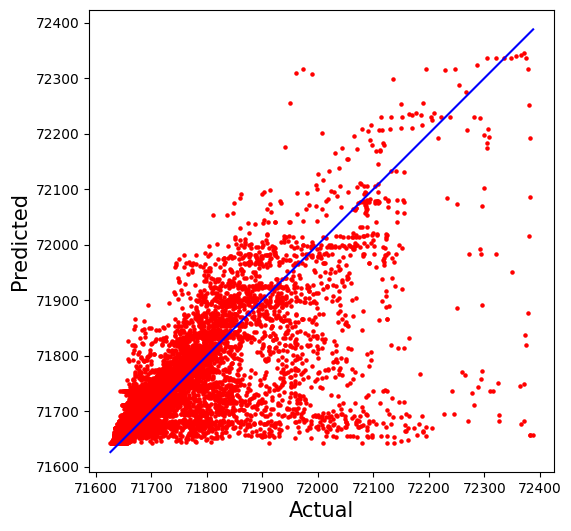

In [ ]:
X_train = np.array(X_train_general[['valor_leitura_flu_413(t-0)','valor_leitura_plu_413(t-0)']])
X_val = np.array(X_val_general[['valor_leitura_flu_413(t-0)','valor_leitura_plu_413(t-0)']])
X_test = np.array(X_test_general[['valor_leitura_flu_413(t-0)','valor_leitura_plu_413(t-0)']])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

n_estimators_4 = 200
max_depth_4 = 20
min_samples_split_4 = 11
min_samples_leaf_4 = 20

rmse_train_list_4_2122, nse_train_list_4_2122, rmse_list_4_2122, nse_list_4_2122, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test,n_estimators = n_estimators_4, max_depth = max_depth_4, min_samples_split = min_samples_split_4, min_samples_leaf = min_samples_leaf_4)

## Exp. 5: Nível exutório e todos os pluviômetros da bacia

<ipython-input-9-73a65f936368>:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


The average of the root mean squared error (RMSE) on train set: 36.4091
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.8656160997487783
The average of the root mean squared error (RMSE) on test set: 45.3054
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.7131161583732513


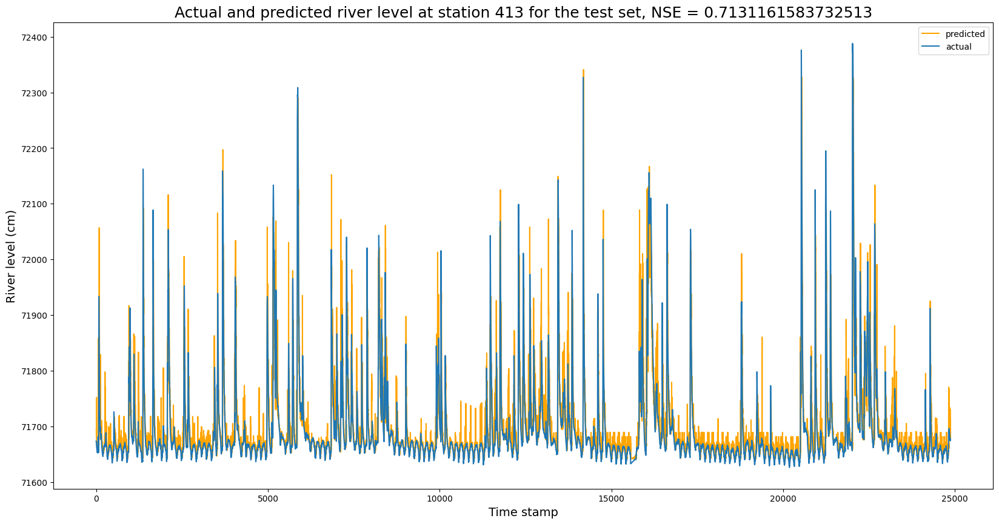

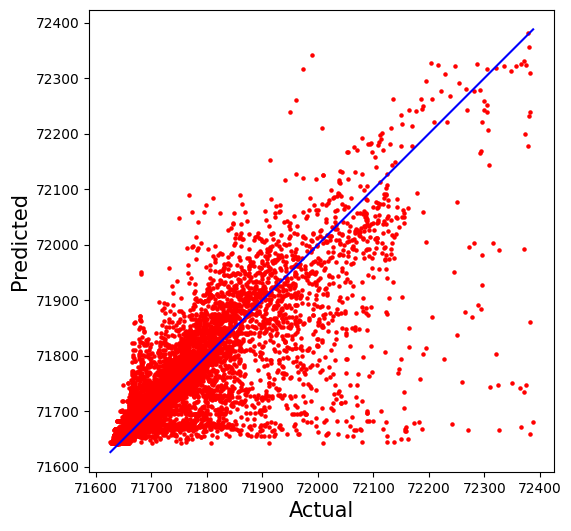

In [ ]:
entradas = []
entradas.append('valor_leitura_flu_413(t-0)')
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome and '-0' in nome):
    entradas.append(nome)


X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

n_estimators_5 = 200
max_depth_5 = 18
min_samples_split_5 = 20
min_samples_leaf_5 = 4

rmse_train_list_5_2122, nse_train_list_5_2122, rmse_list_5_2122, nse_list_5_2122, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test,n_estimators = n_estimators_5, max_depth = max_depth_5, min_samples_split = min_samples_split_5, min_samples_leaf = min_samples_leaf_5)

Análise da importância das features

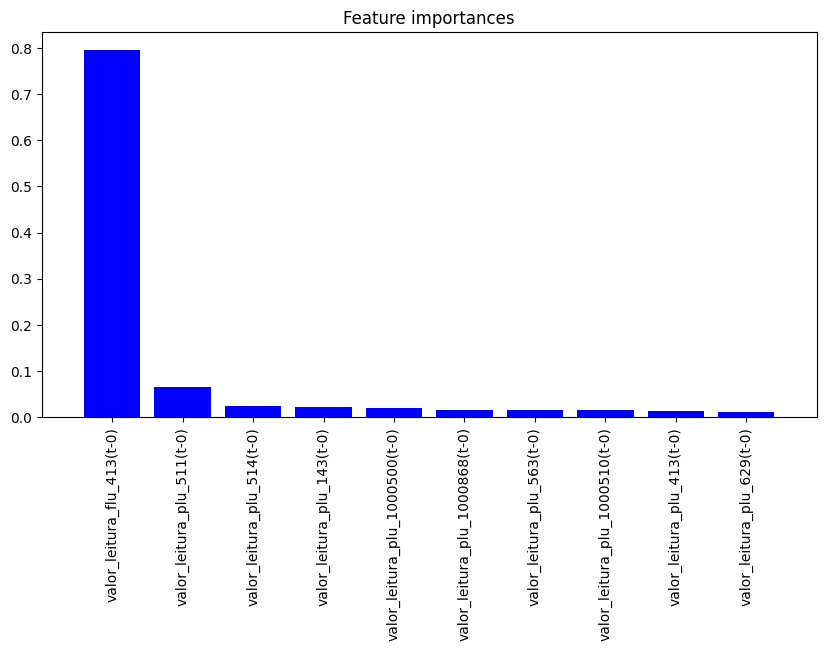

In [ ]:
feature_names = X_train_general[entradas].columns

# Based on: https://towardsdatascience.com/machine-learning-for-forecasting-supervised-learning-with-multivariate-time-series-b5b5044fe068
# Ordena as features pelo valor de importância
indices = np.argsort(importances)[::-1]

# Plota o gráfico de barras com os nomes das features
plt.figure(figsize=(10, 5))
plt.title("Feature importances")
plt.bar(range(10), importances[indices[0:10]],
        color="b", align="center")
plt.xticks(range(10), feature_names[indices[0:10]], rotation='vertical')
plt.xlim([-1, 10])

#plt.bar(range(X_train.shape[1]), importances[indices],
#        color="b", align="center")
#plt.xticks(range(X_train.shape[1]), feature_names[indices], rotation='vertical')
#plt.xlim([-1, X_train.shape[1]])
plt.show()

## Exp. 6: Nível exutório e níveis a montante

<ipython-input-9-73a65f936368>:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


The average of the root mean squared error (RMSE) on train set: 30.9885
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.9026516634335937
The average of the root mean squared error (RMSE) on test set: 84.1525
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.01021668214627991


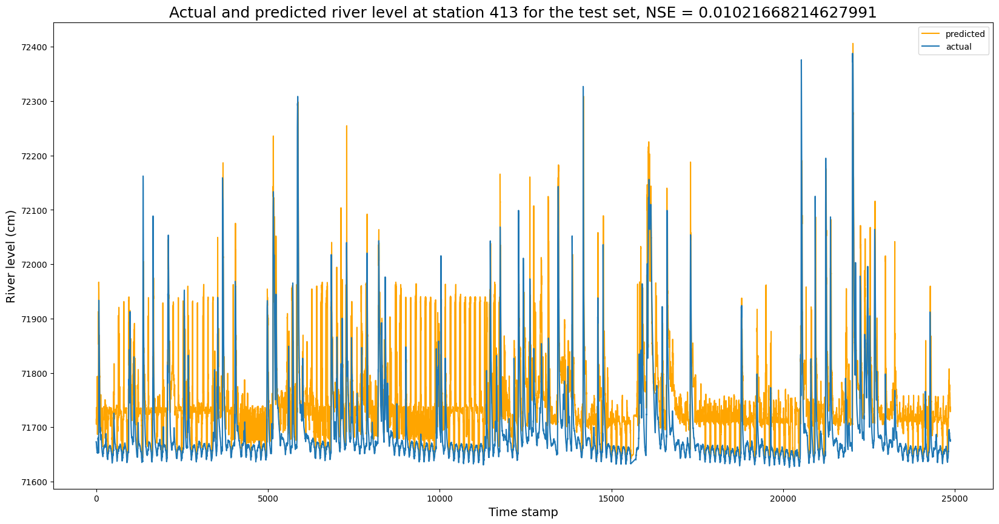

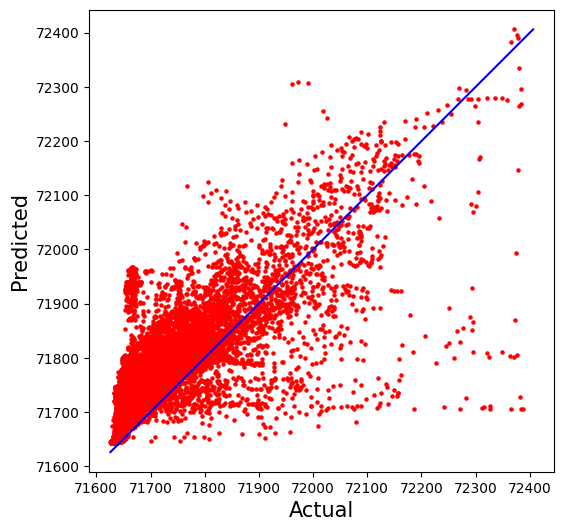

In [ ]:
entradas = []
for nome in X_train_general.columns:
  if ('flu' in nome and '-0' in nome):
    entradas.append(nome)

X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

n_estimators_6 = 150
max_depth_6 = 15
min_samples_split_6 = 20
min_samples_leaf_6 = 3

rmse_train_list_6_2122, nse_train_list_6_2122, rmse_list_6_2122, nse_list_6_2122, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test,n_estimators = n_estimators_6, max_depth = max_depth_6, min_samples_split = min_samples_split_6, min_samples_leaf = min_samples_leaf_6)

## Exp. 7: Nível exutório, níveis a montante e todos os pluviômetros da bacia

<ipython-input-9-73a65f936368>:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


The average of the root mean squared error (RMSE) on train set: 27.1182
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.9254497807638653
The average of the root mean squared error (RMSE) on test set: 53.4401
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.6008462496644158


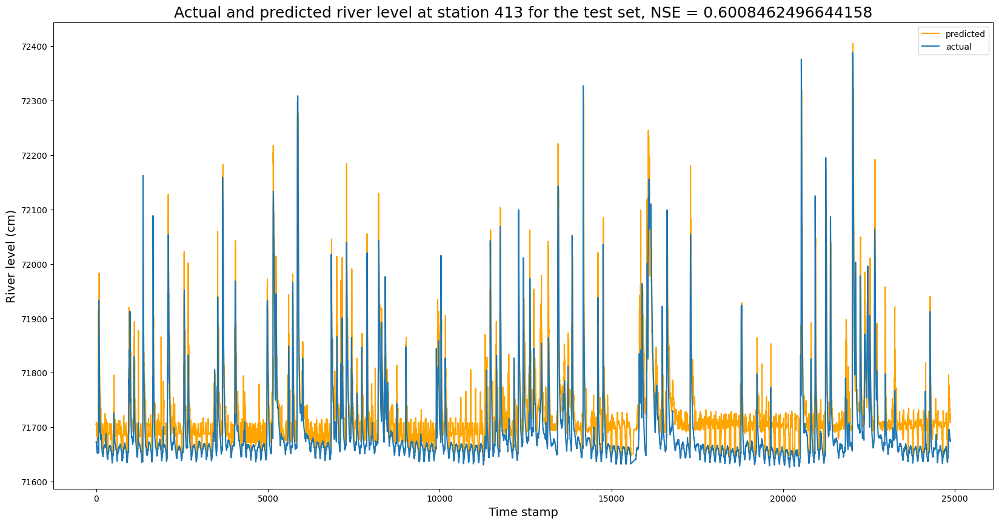

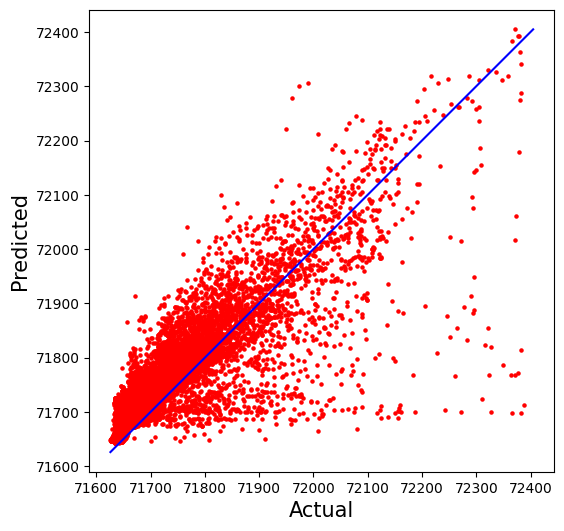

In [ ]:
entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('-0' in nome):
    entradas.append(nome)

X_train = np.array(X_train_general[entradas])
X_val = np.array(X_val_general[entradas])
X_test = np.array(X_test_general[entradas])
y_train = np.array(y_train_general.values)
y_val = np.array(y_val_general.values)
y_test = np.array(y_test_general.values)

n_estimators_7 = 200
max_depth_7 = 15
min_samples_split_7 = 16
min_samples_leaf_7 = 2

rmse_train_list_7_2122, nse_train_list_7_2122, rmse_list_7_2122, nse_list_7_2122, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test,n_estimators = n_estimators_7, max_depth = max_depth_7, min_samples_split = min_samples_split_7, min_samples_leaf = min_samples_leaf_7)

Análise da importância das features

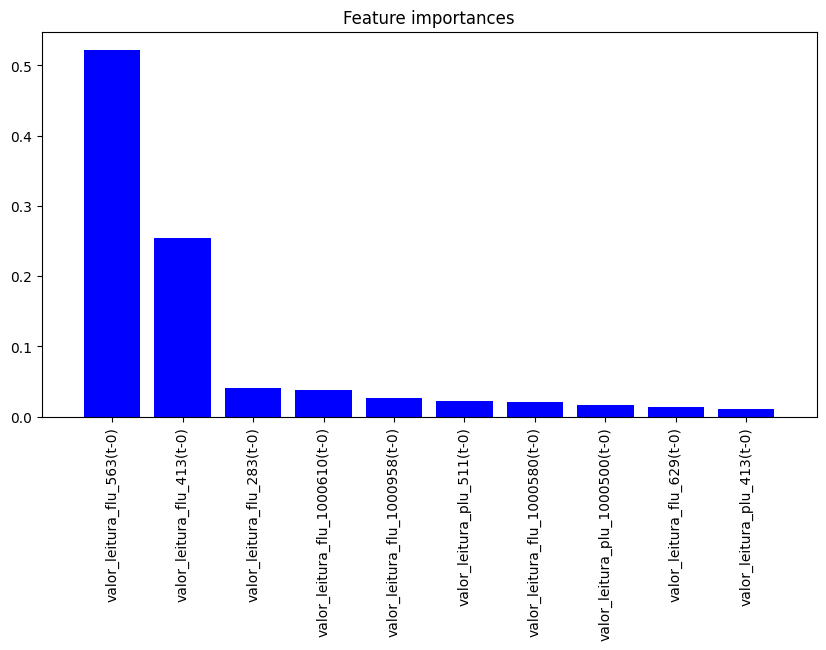

In [ ]:
feature_names = X_train_general[entradas].columns

# Based on: https://towardsdatascience.com/machine-learning-for-forecasting-supervised-learning-with-multivariate-time-series-b5b5044fe068
# Ordena as features pelo valor de importância
indices = np.argsort(importances)[::-1]

# Plota o gráfico de barras com os nomes das features
plt.figure(figsize=(10, 5))
plt.title("Feature importances")
plt.bar(range(10), importances[indices[0:10]],
        color="b", align="center")
plt.xticks(range(10), feature_names[indices[0:10]], rotation='vertical')
plt.xlim([-1, 10])

#plt.bar(range(X_train.shape[1]), importances[indices],
#        color="b", align="center")
#plt.xticks(range(X_train.shape[1]), feature_names[indices], rotation='vertical')
#plt.xlim([-1, X_train.shape[1]])
plt.show()

## Comparação de Performances

In [52]:
nse_list_1_2122 = 0.163
nse_list_2_2122 = 0.398
nse_list_3_2122 = 0.549
nse_list_4_2122 = 0.597
nse_list_5_2122 = 0.713
nse_list_6_2122 = 0.010
nse_list_7_2122 = 0.601
nse_train_list_1_2122 = 0.262
nse_train_list_2_2122 = 0.495
nse_train_list_3_2122 = 0.710
nse_train_list_4_2122 = 0.757
nse_train_list_5_2122 = 0.866
nse_train_list_6_2122 = 0.903
nse_train_list_7_2122 = 0.925

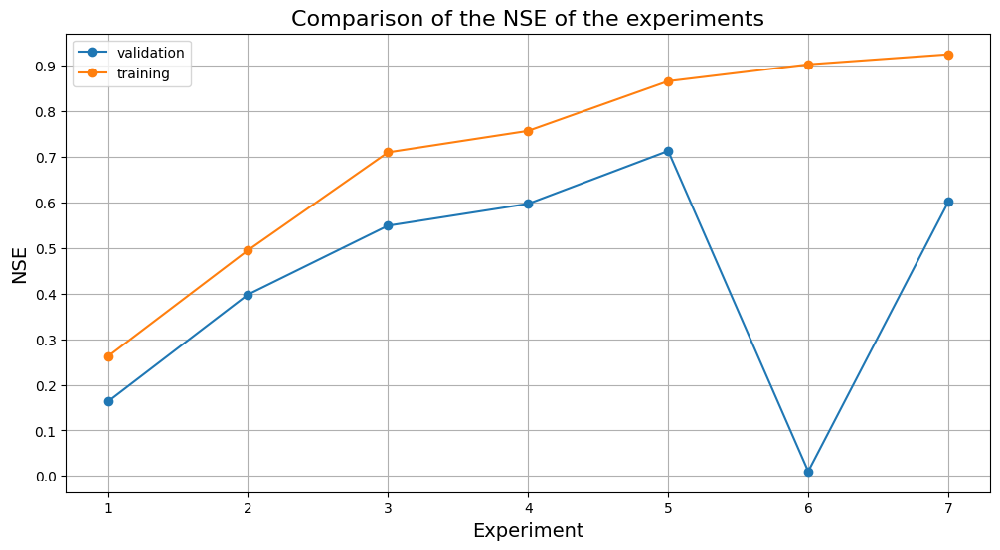

In [54]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
plt.figure(figsize=(12, 6))
plt.plot([1,2,3,4,5,6,7], [nse_list_1_2122,nse_list_2_2122,nse_list_3_2122,nse_list_4_2122,nse_list_5_2122,nse_list_6_2122,nse_list_7_2122], marker = 'o', label = 'validation')
plt.plot([1,2,3,4,5,6,7], [nse_train_list_1_2122,nse_train_list_2_2122,nse_train_list_3_2122,nse_train_list_4_2122,nse_train_list_5_2122,nse_train_list_6_2122,nse_train_list_7_2122], marker = 'o', label = 'training')
plt.title('Comparison of the NSE of the experiments',fontsize=16)
plt.ylabel('NSE',fontsize=14)
plt.xlabel('Experiment',fontsize=14)
plt.yticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9])
plt.grid(linestyle='-')
plt.legend()
plt.show()

# Parte 2: Analysis of Influence of Feature Engineering

## 2.1: Lag Features

### Experimentos Multivariate com Random Forest (Validando em 2020)

#### Usando todas as features

The average of the root mean squared error (RMSE) on train set: 13.8850
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.9798473508528112
The average of the root mean squared error (RMSE) on test set: 41.8623
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.8323543575265766


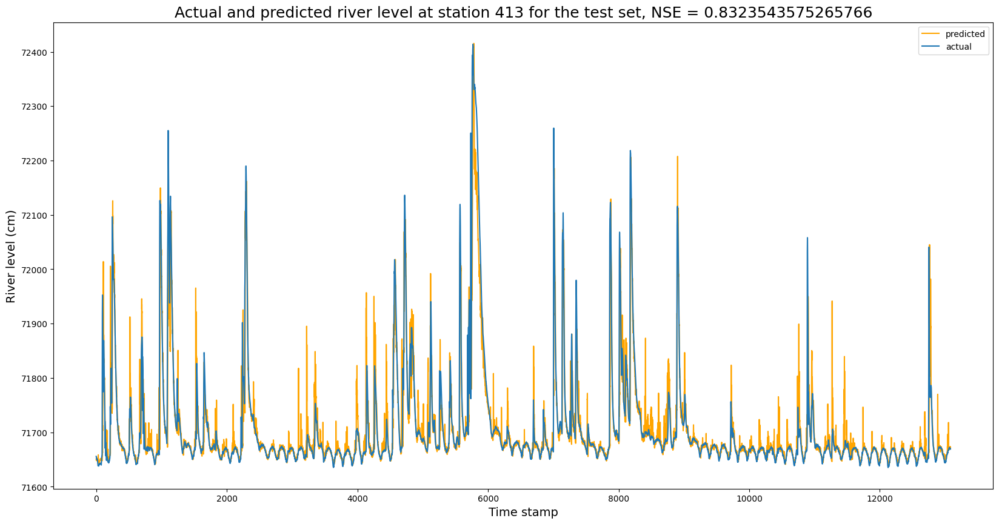

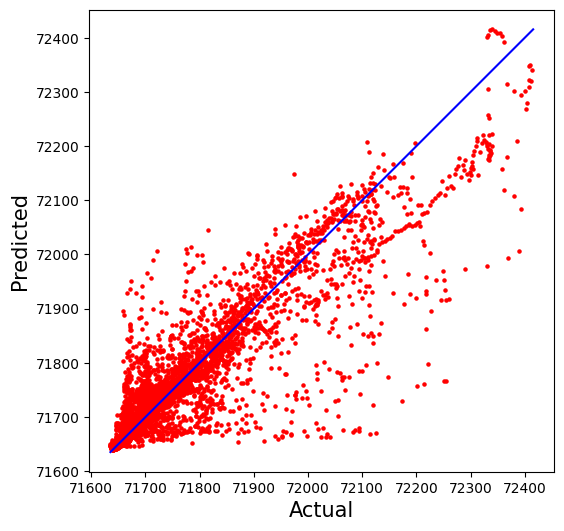

In [57]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

rmse_list_all_train, nse_list_all_train, rmse_list_all, nse_list_all, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test)

N_estimators: 150, max_depth: 20, min_samples_split: 19, min_samples_leaf: 3
building tree 1 of 150
building tree 2 of 150


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.


building tree 3 of 150
building tree 4 of 150
building tree 5 of 150
building tree 6 of 150
building tree 7 of 150
building tree 8 of 150
building tree 9 of 150
building tree 10 of 150
building tree 11 of 150
building tree 12 of 150
building tree 13 of 150
building tree 14 of 150
building tree 15 of 150
building tree 16 of 150
building tree 17 of 150
building tree 18 of 150
building tree 19 of 150
building tree 20 of 150
building tree 21 of 150
building tree 22 of 150
building tree 23 of 150
building tree 24 of 150
building tree 25 of 150
building tree 26 of 150
building tree 27 of 150
building tree 28 of 150
building tree 29 of 150
building tree 30 of 150
building tree 31 of 150
building tree 32 of 150
building tree 33 of 150
building tree 34 of 150
building tree 35 of 150
building tree 36 of 150
building tree 37 of 150building tree 38 of 150



[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.3s


building tree 39 of 150
building tree 40 of 150
building tree 41 of 150
building tree 42 of 150
building tree 43 of 150
building tree 44 of 150
building tree 45 of 150
building tree 46 of 150
building tree 47 of 150
building tree 48 of 150
building tree 49 of 150
building tree 50 of 150
building tree 51 of 150
building tree 52 of 150
building tree 53 of 150
building tree 54 of 150
building tree 55 of 150
building tree 56 of 150
building tree 57 of 150
building tree 58 of 150
building tree 59 of 150
building tree 60 of 150
building tree 61 of 150
building tree 62 of 150
building tree 63 of 150
building tree 64 of 150
building tree 65 of 150
building tree 66 of 150
building tree 67 of 150
building tree 68 of 150
building tree 69 of 150
building tree 70 of 150
building tree 71 of 150
building tree 72 of 150
building tree 73 of 150
building tree 74 of 150
building tree 75 of 150
building tree 76 of 150
building tree 77 of 150
building tree 78 of 150
building tree 79 of 150
building tree 80

[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:  1.1min finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 150 out of 150 | elapsed:    0.2s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 150 out of 150 | elapsed:    0.4s finished


The average of the root mean squared error (RMSE) on train set: 29.6851
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.907887099692369
The average of the root mean squared error (RMSE) on test set: 41.2232
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.837434208773472


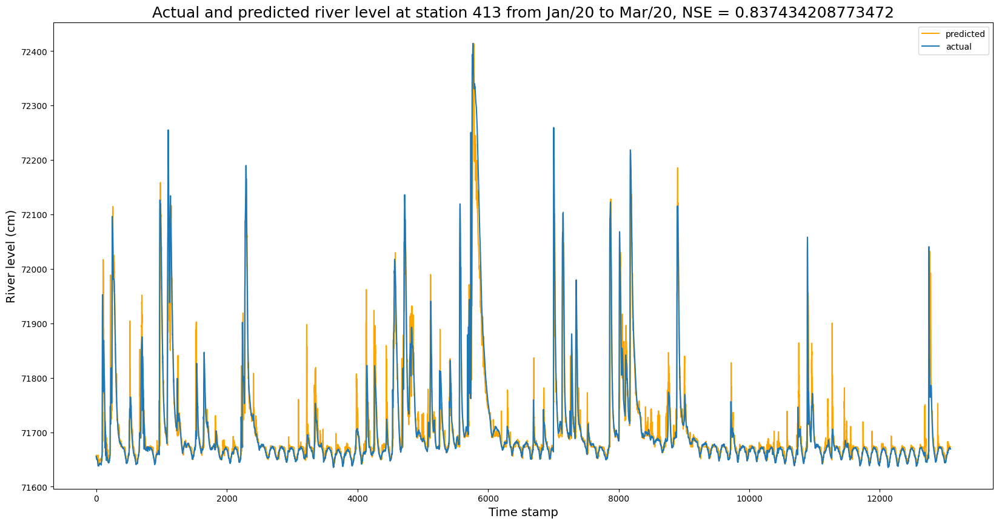

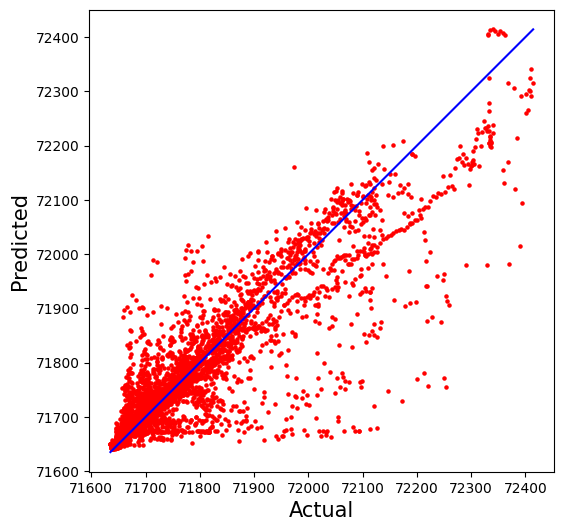

In [ ]:
# Otimizando com Optuna
trial, n_estimators, max_depth, min_samples_split, min_samples_leaf = run_optuna(n_trials=50)
print(f"N_estimators: {n_estimators}, max_depth: {max_depth}, min_samples_split: {min_samples_split}, min_samples_leaf: {min_samples_leaf}")

In [ ]:
n_estimators = 150
max_depth = 20
min_samples_split = 19
min_samples_leaf = 3
rmse_list_all_train, nse_list_all_train, rmse_list_all, nse_list_all, importances = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test,n_estimators = n_estimators, max_depth = max_depth, min_samples_split = min_samples_split, min_samples_leaf = min_samples_leaf)

### Experimentos Multivariate com Random Forest (Testando em 2021+2022)

#### Usando todas as features

The average of the root mean squared error (RMSE) on train set: 13.4838
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.9815688825749878
The average of the root mean squared error (RMSE) on test set: 42.1845
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.7512799705781177


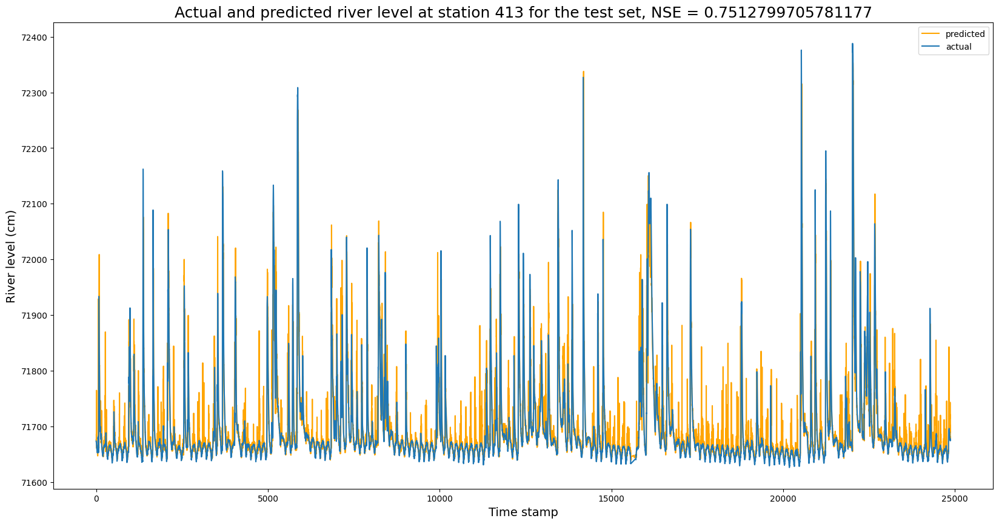

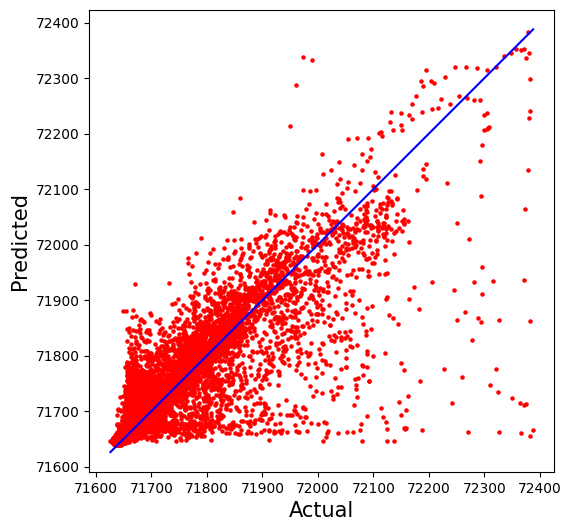

In [58]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019,df_2020], dataframes_validacao = [df_2021.drop(df_2021.index[3000:4000]), df_2022], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

rmse_list_all_train, nse_list_all_train, rmse_list_all, nse_list_all, importances, y_test, predictions = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test, return_plot=1)

The average of the root mean squared error (RMSE) on train set: 29.1401
The average of the Nash-Sutcliffe-Efficience (NSE) on train set in 30 repetitions is: 0.913918353031868
The average of the root mean squared error (RMSE) on test set: 41.6791
The average of the Nash-Sutcliffe-Efficience (NSE) on test set in 30 repetitions is: 0.75720356213076


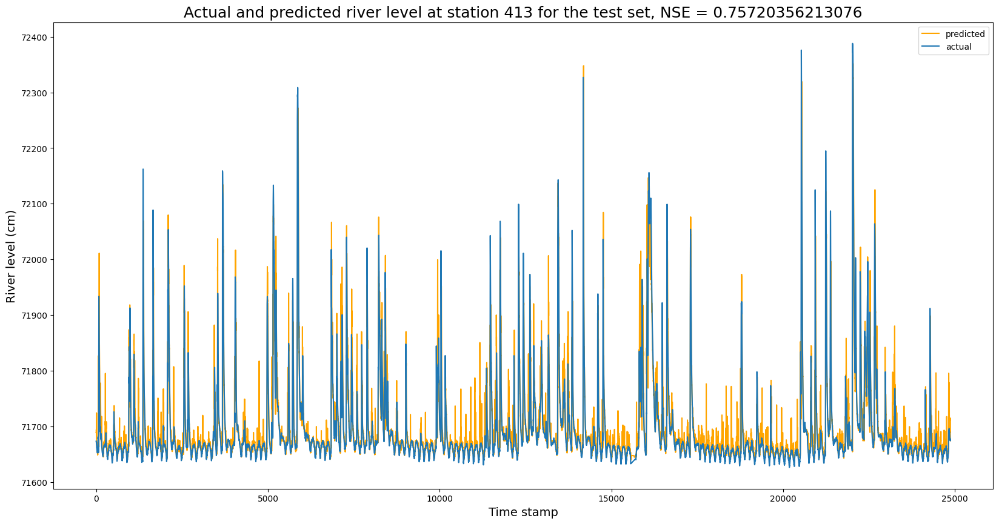

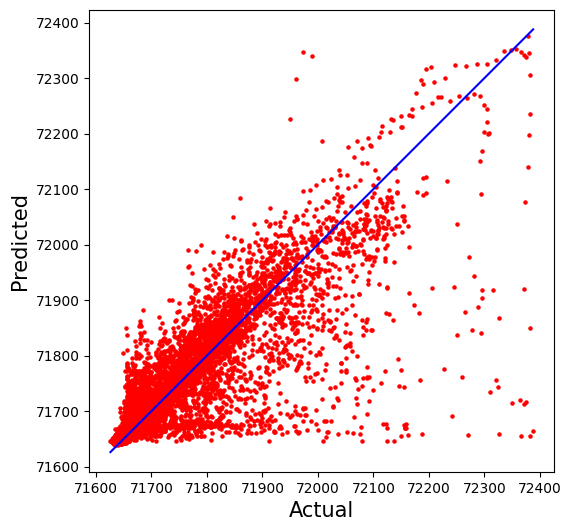

In [59]:
# Usando hiperparâmetros do Optuna
# Hyperparametres from optuna
n_estimators, max_depth, min_samples_split, min_samples_leaf = 150, 20, 19, 3
rmse_list_all_train, nse_list_all_train, rmse_list_all, nse_list_all, importances, y_test, predictions = fit_and_evaluate_random_forest(X_train,y_train,X_val,y_val, X_test,y_test,n_estimators = n_estimators, max_depth = max_depth, min_samples_split = min_samples_split, min_samples_leaf = min_samples_leaf, return_plot=1)

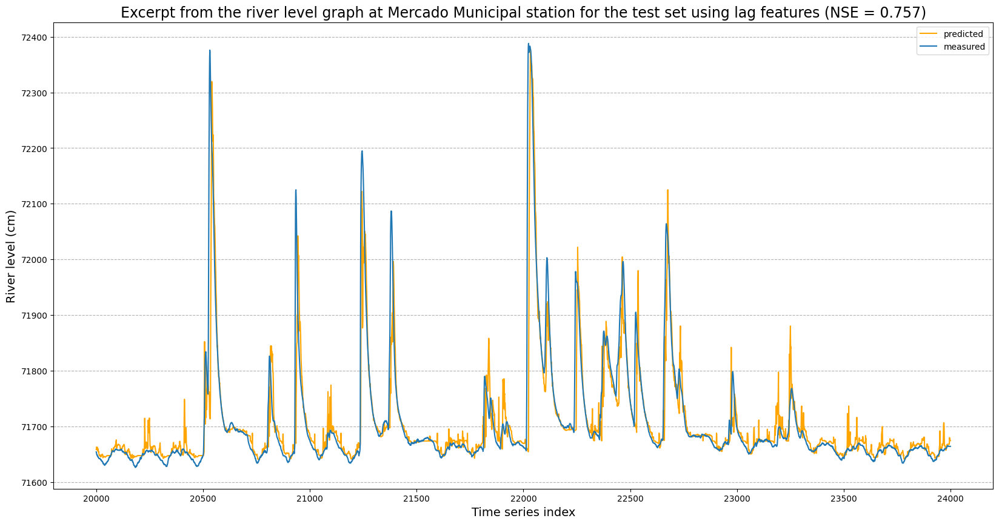

In [60]:
plt.figure(figsize=(20, 10))
plt.plot(np.arange(20000, 24000, step=1),predictions[20000:24000],color='orange',label='predicted')
plt.plot(np.arange(20000, 24000, step=1),y_test[20000:24000],label='measured')
plt.title(f'Trecho do gráfico do nível do rio na estação do Mercado Municipal para o conjunto de teste usando lag features (NSE = 0.757)',fontsize=17)
plt.title(f'Excerpt from the river level graph at Mercado Municipal station for the test set using lag features (NSE = 0.757)',fontsize=17)
plt.ylabel('River level (cm)',fontsize=14)
plt.xlabel('Time series index',fontsize=14)
plt.grid(axis = 'y', linestyle = '--')
plt.legend()
plt.show()

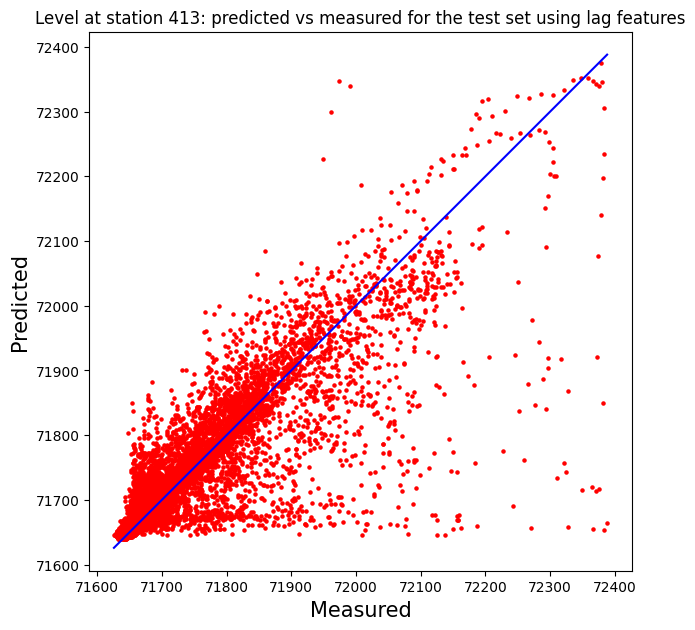

In [61]:
plt.figure(figsize=(7,7))
plt.scatter(y_val, predictions, c='r',s=5)
p1 = max(max(predictions), max(y_val))
p2 = min(min(predictions), min(y_val))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('Measured', fontsize=15)
plt.ylabel('Predicted', fontsize=15)
plt.axis('equal')
#plt.title('Nível na estação 413: predito vs real para o conjunto de teste usando lag features')
plt.title('Level at station 413: predicted vs measured for the test set using lag features')
plt.show()

## 2.2 Accumulated rain --> fazer se sobrar tempo

# Parte 3: Comparison of different machine learning models

## Exp. 5 - Com lag features (com treino em 2018/2019 e validação em 2020)

### Usando todas as features

In [89]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

In [90]:
feature_names = X_train_general.columns

In [97]:
# Persistence
from sklearn.metrics import mean_squared_error as mse
predictions = X_val[:,0].reshape(-1,1)
mse = mse(predictions, y_val)
rmse_mean = np.sqrt(mse)
nse_mean = he.evaluator(he.nse, predictions, y_val)
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean[0])
nse_mean[0]

Average of RMSE: 81.2267308030667
Average of NSE: 0.3688347532121995


0.3688347532121995

In [109]:
# Linear Regression
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_lr(X_train,y_train)
    prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
#plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 41.797268310226734
Average of NSE: 0.832875189617076


Average of RMSE: 41.86234669179653
Average of NSE: 0.8323543575265766


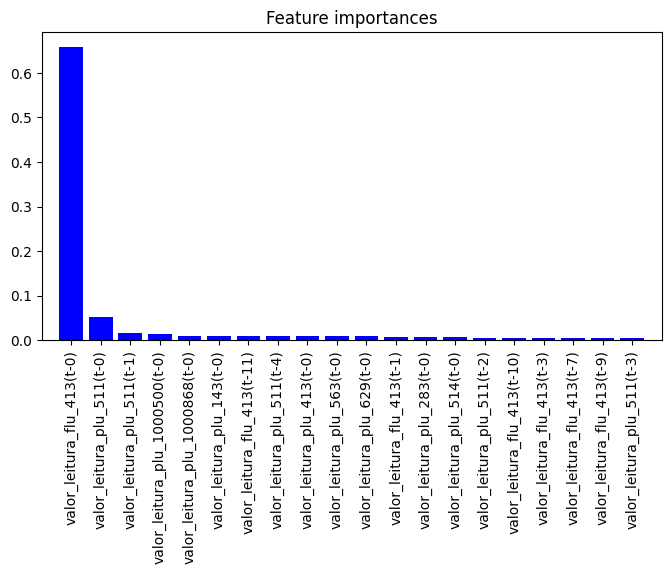

In [ ]:
# Random Forest
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_rf(X_train,y_train)
    prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [ ]:
# Otimizando com Optuna
trial, n_estimators, max_depth, min_samples_split, min_samples_leaf = run_optuna_rf(n_trials=50)
parameters = {'trial': trial, 'n_estimators': n_estimators, 'max_depth': max_depth, 'min_samples_split': min_samples_split, 'min_samples_leaf': min_samples_leaf}
pickle.dump(parameters, open("parameters/random_forest.pkl", "wb")) 
parameters = pickle.load(open("parameters/random_forest.pkl", "rb"))

[I 2024-03-13 02:32:51,306] A new study created in memory with name: no-name-c2b409f7-1dc9-49ec-bb38-7a0bc8188b95


Average of RMSE: 41.22105318691265
Average of NSE: 0.8374513762720858


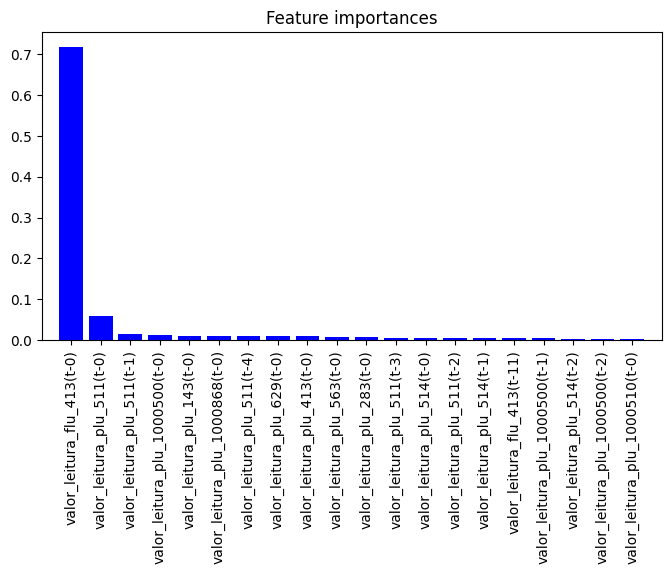

In [19]:
# Random Forest Otimizado com Optuna
parameters = pickle.load(open("parameters/random_forest.pkl", "rb"))
del parameters['trial']

rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = RandomForestRegressor(n_jobs=-1, verbose=0,random_state=42, **parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 41.49677372371826
Average of NSE: 0.8352695841905309


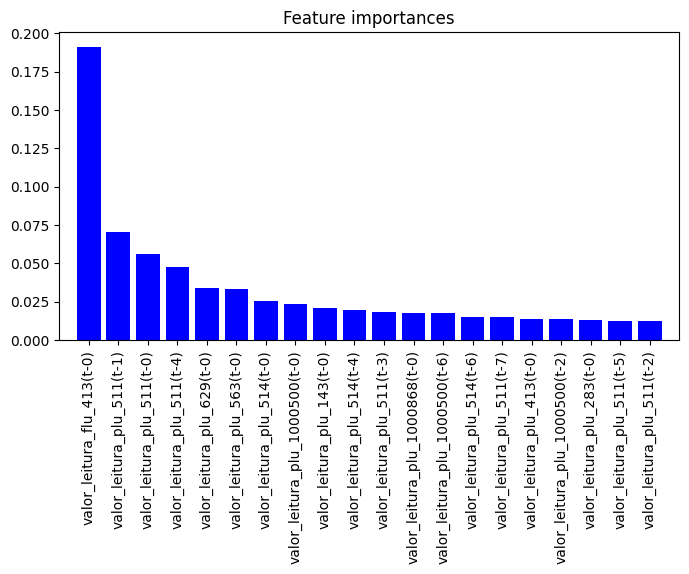

In [ ]:
# XGBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_xgb(X_train,y_train)
    prediction, rmse, nse = predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [ ]:
# Otimizando com Optuna
trial, max_depth, learning_rate , n_estimators, min_child_weight, gamma, subsample, colsample_bytree, reg_alpha, reg_lambda, = run_optuna_xgb(n_trials=50)
parameters = {'trial': trial, 'max_depth': max_depth, 'learning_rate': learning_rate, 'n_estimators': n_estimators, 'min_child_weight': min_child_weight, 'gamma': gamma, 'subsample': subsample, 'colsample_bytree': colsample_bytree, 'reg_alpha': reg_alpha, 'reg_lambda': reg_lambda}
pickle.dump(parameters, open("parameters/xgboost.pkl", "wb")) 
parameters = pickle.load(open("parameters/xgboost.pkl", "rb"))

suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
[I 2024-03-13 02:36:59,634] Trial 0 finished with value: 46.91557384710284 and parameters: {'max_depth': 7, 'learning_rate': 0.011002817226254392, 'n_estimators': 650, 'min_child_weight': 8, 'gamma': 9.728728830009641e-05, 'subsample': 0.02815744802026465, 'colsample_bytree': 0.024895779540435023, 'reg_alpha': 0.012140755068184341, 'reg_lambda': 2.2536511574969237e-07}. Best is trial 0 with value: 46.91557384710284.
suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
[I 2024-03-13 02:37:00,811] Trial 1 finished with value: 43.83538776169429 and parameters: {'max_depth': 1, 'learning_rate': 0.23481164807395874, 'n_estimators': 1000, 'min_child_weight': 1, 'gamma': 0.00012518091079635779, 'subsample': 0.4219314744806921, 'colsample_bytree': 0.16790055575223653, 'reg_alpha': 0.005943503728075847, 'reg_lambda': 2.162761078725784

Average of RMSE: 39.22253053151705
Average of NSE: 0.8528309966290932


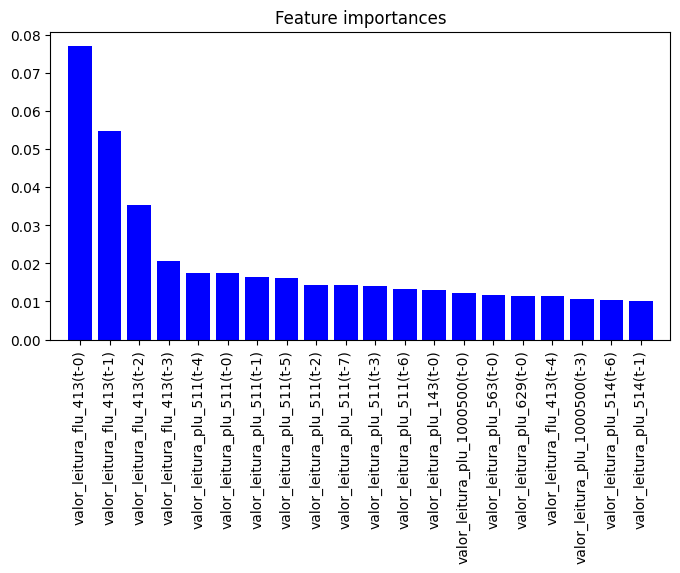

In [21]:
# XGBoost otimizado com Optuna
parameters = pickle.load(open("parameters/xgboost.pkl", "rb"))
del parameters['trial']

rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = xgb.XGBRegressor(objective="reg:squarederror",random_state=42,**parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 40.22019440446573
Average of NSE: 0.8452490013851117


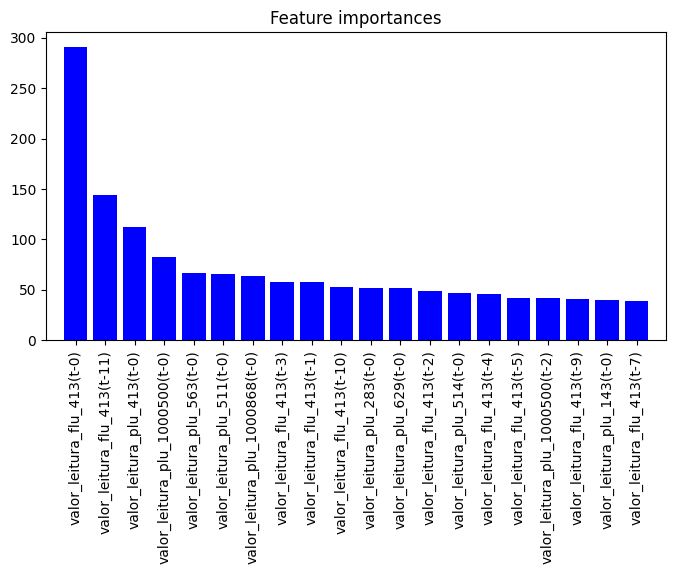

In [ ]:
# LightGBM
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_lgb(X_train,y_train, random_state = i)
    prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [ ]:
# Otimizando com Optuna
trial, n_estimators, learning_rate ,num_leaves, subsample, colsample_bytree,min_data_in_leaf = run_optuna_lgb(n_trials=50)
parameters = {'trial': trial, 'n_estimators': n_estimators, 'learning_rate': learning_rate, 'num_leaves': num_leaves, 'subsample': subsample, 'colsample_bytree': colsample_bytree, 'min_data_in_leaf': min_data_in_leaf}
pickle.dump(parameters, open("parameters/light_gbm.pkl", "wb")) 
parameters = pickle.load(open("parameters/light_gbm.pkl", "rb"))

[LightGBM] [Warning] min_data_in_leaf is set=64, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=64
[LightGBM] [Warning] min_data_in_leaf is set=64, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=64
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Light

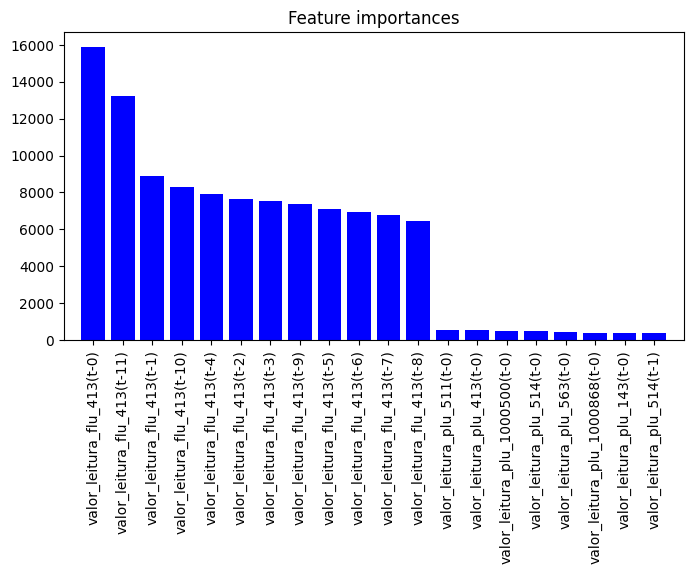

: 

In [31]:
# LightGBM Otimizado com Optuna
parameters = pickle.load(open("parameters/light_gbm.pkl", "rb"))
del parameters['trial']

# LightGBM
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = lgb.LGBMRegressor(objective = 'regression',metric='rmse',random_state=42,verbose = 0,**parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 39.40096291510712
Average of NSE: 0.8514889390681348


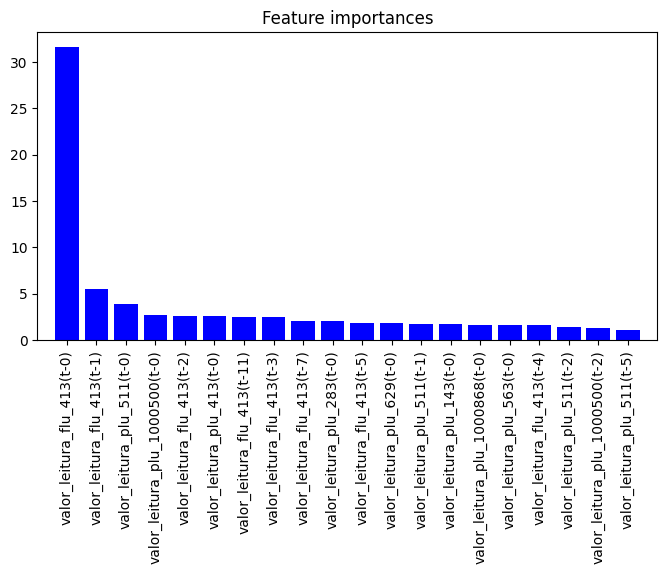

In [ ]:
# CatBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_cb(X_train,y_train)
    prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

In [ ]:
# Otimizando com Optuna
trial, iterations, learning_rate ,depth, subsample, colsample_bylevel,min_data_in_leaf = run_optuna_cb(n_trials=50)
parameters = {'trial': trial, 'iterations': iterations, 'learning_rate': learning_rate, 'depth': depth, 'subsample': subsample, 'colsample_bylevel': colsample_bylevel, 'min_data_in_leaf': min_data_in_leaf}
pickle.dump(parameters, open("parameters/cat_boost.pkl", "wb")) 
parameters = pickle.load(open("parameters/cat_boost.pkl", "rb"))

[I 2024-03-27 23:42:01,770] A new study created in memory with name: no-name-40b6024d-7331-4453-ab5e-ad9fbc331592


suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
[I 2024-03-27 23:42:08,379] Trial 0 finished with value: 64.40194299124472 and parameters: {'iterations': 800, 'learning_rate': 0.001100281722625439, 'depth': 7, 'subsample': 0.7613636884116812, 'colsample_bylevel': 0.5235816616874609, 'min_data_in_leaf': 23}. Best is trial 0 with value: 64.40194299124472.
suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
[I 2024-03-27 23:42:08,681] Trial 1 finished with value: 42.51318581009456 and parameters: {'iterations': 200, 'learning_rate': 0.033194140233275465, 'depth': 2, 'subsample': 0.13392282346530976, 'colsample_bylevel': 0.7010918274494073, 'min_data_in_leaf': 96}. Best is trial 1 with value: 42.51318581009456.
suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
[I 2024-03-27 23:42:09,667] Trial 2 finished with value: 76

Average of RMSE: 39.51228096563638
Average of NSE: 0.850648588268391


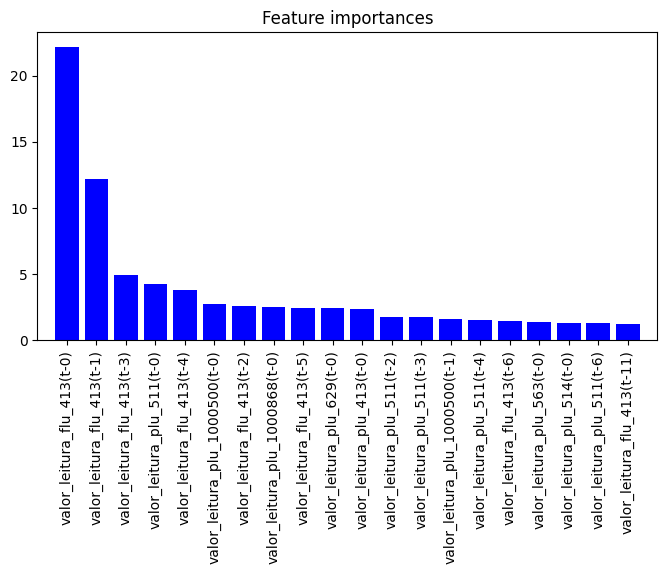

In [ ]:
# CatBoost Otimizado com Optuna
parameters = pickle.load(open("parameters/cat_boost.pkl", "rb"))
del parameters['trial']

# CatBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = cb.CatBoostRegressor(loss_function='RMSE',random_state=42,verbose = 0,**parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

## Exp. 5 - Com lag features (com treino em 2018/2019/2020 e validação em 2021/2022)

### Usando todas as features

In [41]:
train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019, df_2020], dataframes_validacao = [df_2021.drop(df_2021.index[3000:4000]),df_2022], dataframes_teste = [df_2023])
X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df)

entradas = []
X_train_general.columns
for nome in X_train_general.columns:
  if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
    entradas.append(nome)

X_train_general = X_train_general[entradas]
X_val_general = X_val_general[entradas]
X_test_general = X_test_general[entradas]

X_train = np.array(X_train_general)
X_val = np.array(X_val_general)
X_test = np.array(X_test_general)
y_train = np.array(y_train_general.values).ravel()
y_val = np.array(y_val_general.values).ravel()
y_test = np.array(y_test_general.values).ravel()

In [42]:
feature_names = X_train_general.columns

In [43]:
# Persistence
from sklearn.metrics import mean_squared_error as mse
predictions = X_val[:,0].reshape(-1,1)
mse = mse(predictions, y_val)
rmse_mean = np.sqrt(mse)
nse_mean = he.evaluator(he.nse, predictions, y_val)
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean[0])
nse_mean[0]

Average of RMSE: 82.823605189471
Average of NSE: 0.04123097635890283


0.04123097635890283

In [39]:
# Linear Regression
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model, importances = training_lr(X_train,y_train)
    prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
#plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 43.83902445517522
Average of NSE: 0.7313867105937233


Average of RMSE: 41.67909583945686
Average of NSE: 0.75720356213076


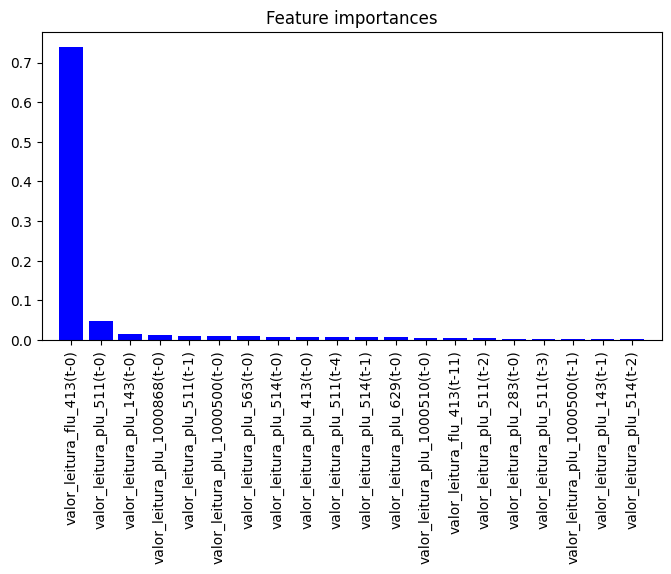

In [113]:
# Random Forest Otimizado com Optuna
parameters = pickle.load(open("parameters/random_forest.pkl", "rb"))
del parameters['trial']

rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = RandomForestRegressor(n_jobs=-1, verbose=0,random_state=42, **parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 39.919850468727944
Average of NSE: 0.7772675242991163


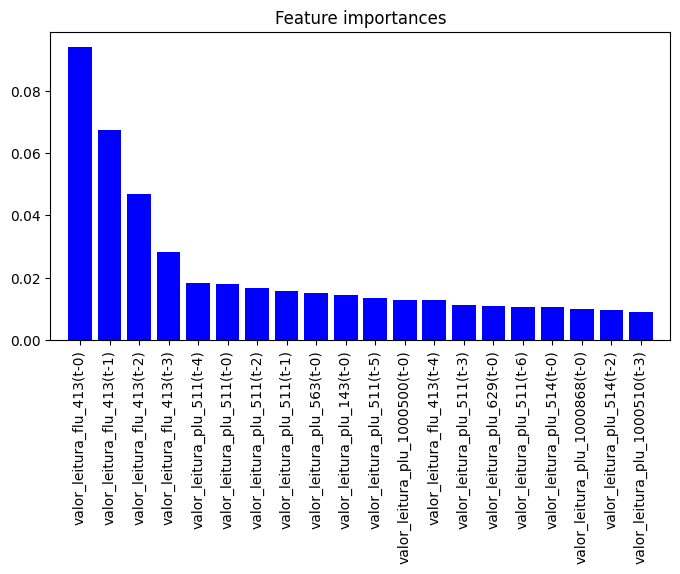

In [114]:
# XGBoost otimizado com Optuna
parameters = pickle.load(open("parameters/xgboost.pkl", "rb"))
del parameters['trial']

rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = xgb.XGBRegressor(objective="reg:squarederror",random_state=42,**parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

[LightGBM] [Warning] min_data_in_leaf is set=64, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=64
[LightGBM] [Warning] min_data_in_leaf is set=64, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=64
[LightGBM] [Warning] min_data_in_leaf is set=64, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=64
[LightGBM] [Warning] min_data_in_leaf is set=64, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=64
Average of RMSE: 40.42356408129527
Average of NSE: 0.7716111296172283


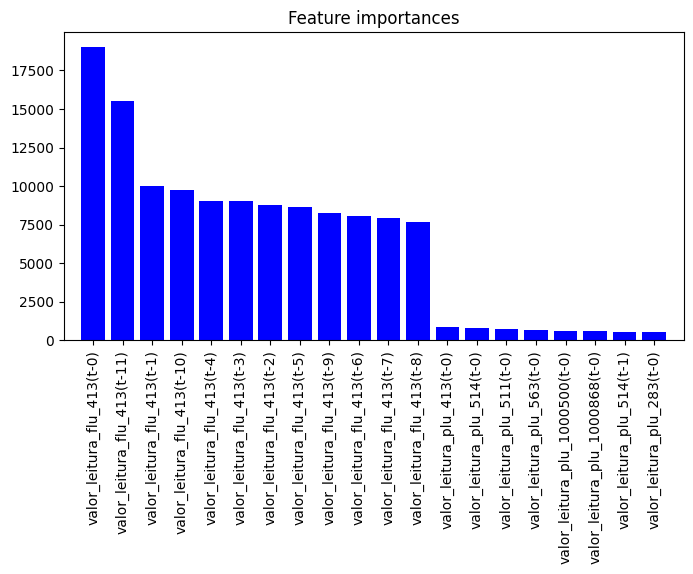

In [28]:
# LightGBM Otimizado com Optuna
parameters = pickle.load(open("parameters/light_gbm.pkl", "rb"))
del parameters['trial']

# LightGBM
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = lgb.LGBMRegressor(objective = 'regression',metric='rmse',random_state=42,verbose = 0,**parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

Average of RMSE: 39.46632098920406
Average of NSE: 0.7822997036581055


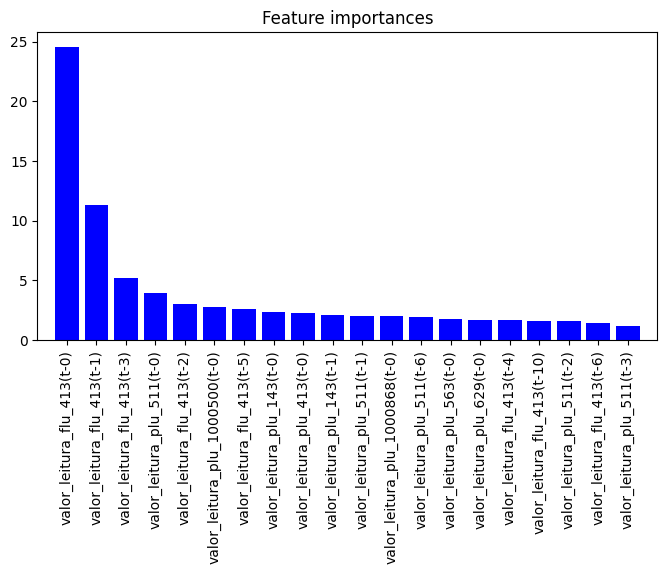

In [44]:
# CatBoost Otimizado com Optuna
parameters = pickle.load(open("parameters/cat_boost.pkl", "rb"))
del parameters['trial']

# CatBoost
rmse_mean = 0
nse_mean = 0
total_iter = 1
for i in range(total_iter):
    model = cb.CatBoostRegressor(loss_function='RMSE',random_state=42,verbose = 0,**parameters)
    model.fit(X_train, y_train.ravel())
    importances = model.feature_importances_
    prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
    #plot_results(prediction,y_val,nse)
    rmse_mean += rmse
    nse_mean += nse
rmse_mean = rmse_mean/total_iter
nse_mean = nse_mean/total_iter
print('Average of RMSE:', rmse_mean)
print('Average of NSE:',nse_mean)
plot_importances(importances,feature_names,n_features_show = 20)

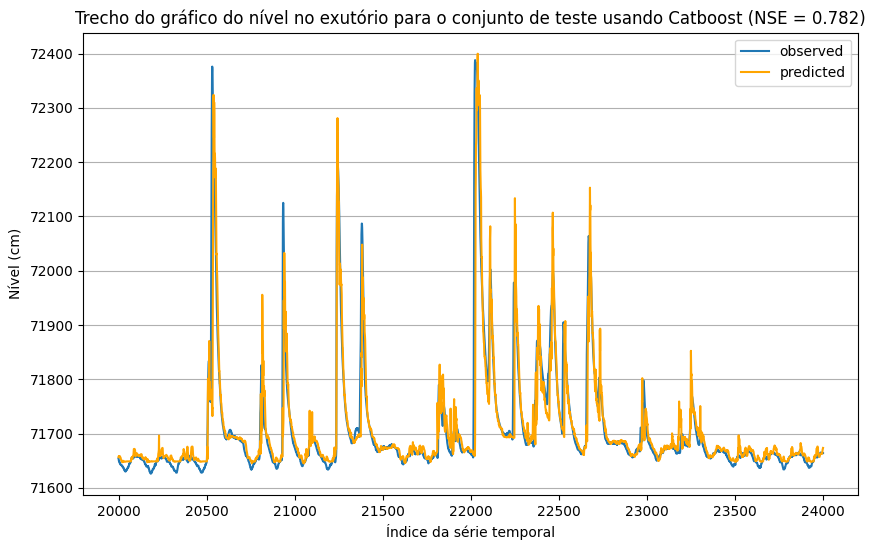

In [62]:
plt.figure(figsize=(10,6))
plt.plot(np.arange(20000, 24000, step=1),y_val[20000:24000], label = 'observed')
plt.plot(np.arange(20000, 24000, step=1),prediction[20000:24000], label = 'predicted',color='orange')
plt.legend()
plt.title('Trecho do gráfico do nível no exutório para o conjunto de teste usando Catboost (NSE = 0.782)')
plt.xlabel('Índice da série temporal')
plt.ylabel('Nível (cm)')
plt.grid(axis='y')

# Part 4: Comparison of forecasting horizonts with CatBoost

## Exp. 5 - Com lag features (com treino em 2018/2019/2020 e teste em 2021/2022) - para horizonte de 30 minutos

Horizon:  3
Average of RMSE: 12.882606372520724
Average of NSE: 0.97678756164673
Horizon:  6
Average of RMSE: 22.587280669641935
Average of NSE: 0.9286591217622432
Horizon:  9
Average of RMSE: 31.621549255457786
Average of NSE: 0.8602106805411046
Horizon:  12
Average of RMSE: 39.1997863325434
Average of NSE: 0.7852302397868104
Horizon:  15
Average of RMSE: 46.88533637285074
Average of NSE: 0.6928301241849388
Horizon:  18
Average of RMSE: 53.86574587885321
Average of NSE: 0.5946503626931015
Horizon:  21
Average of RMSE: 60.445458921287724
Average of NSE: 0.4896912833532492
Horizon:  24
Average of RMSE: 66.19662878450856
Average of NSE: 0.38810063423207675
Horizon:  27
Average of RMSE: 71.33558072916928
Average of NSE: 0.2895643963523551
Horizon:  30
Average of RMSE: 75.74956508373005
Average of NSE: 0.19910024626811795
Horizon:  33
Average of RMSE: 79.51437701607769
Average of NSE: 0.1176989853498338
Horizon:  36
Average of RMSE: 80.97436708370239
Average of NSE: 0.08519154460541956
Hor

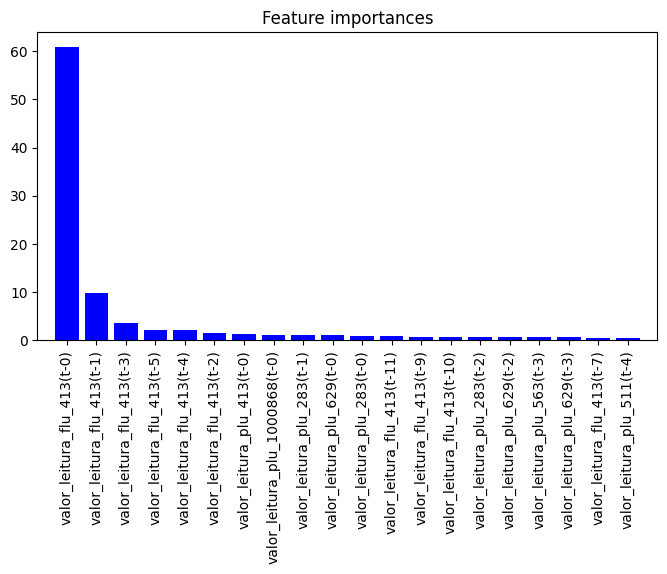

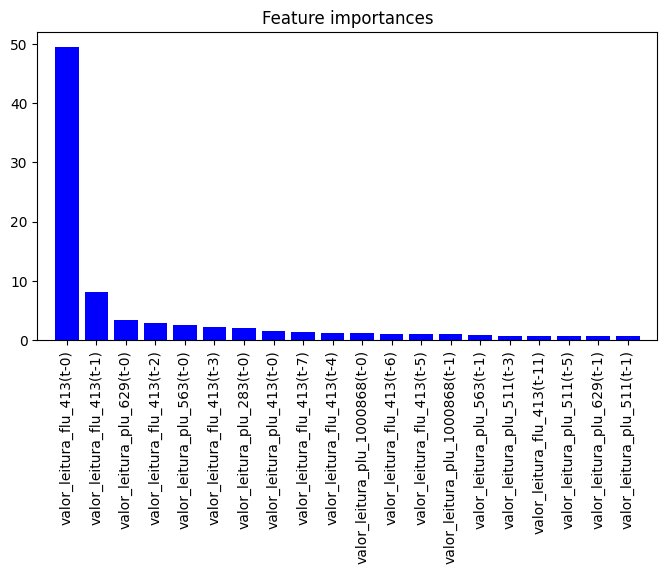

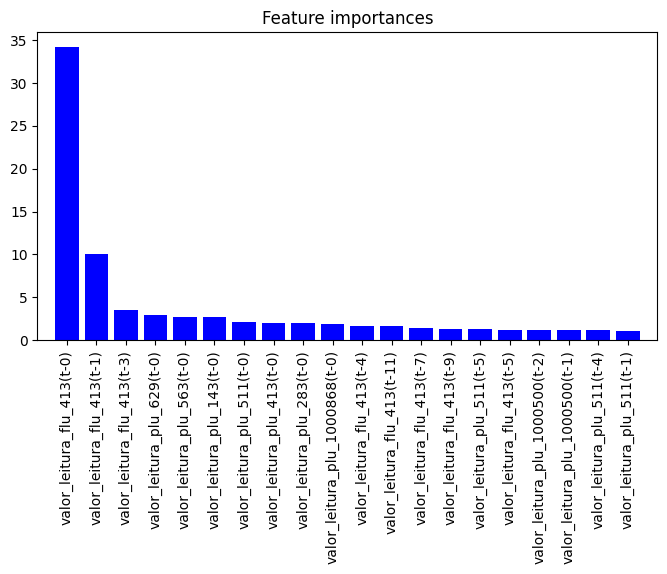

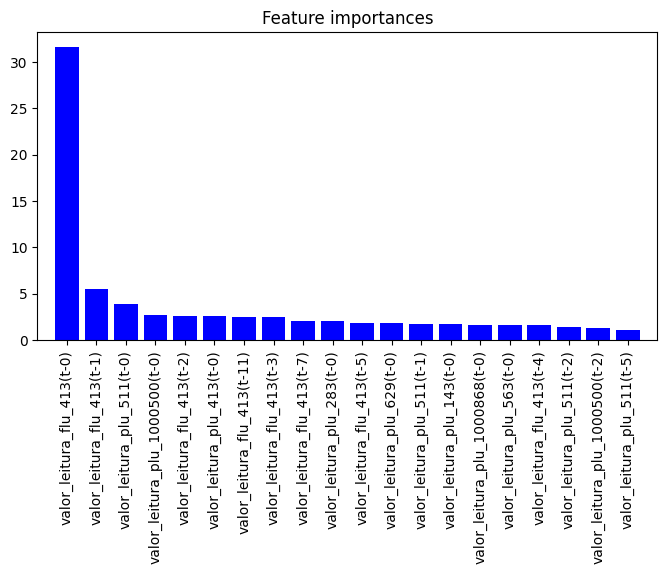

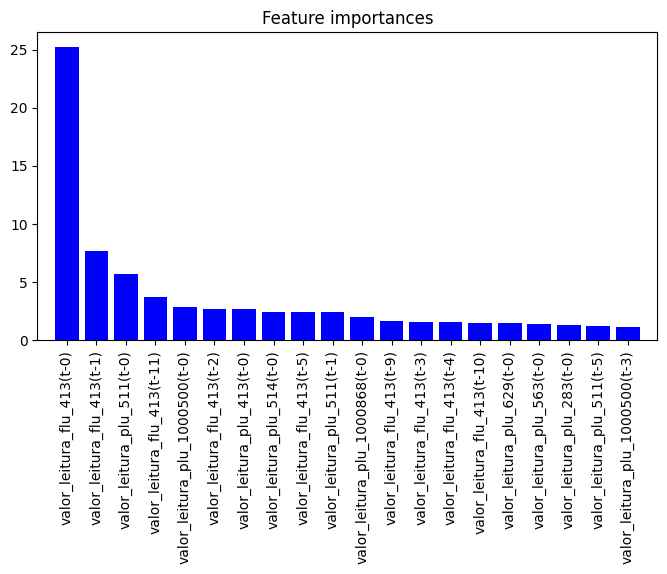

...

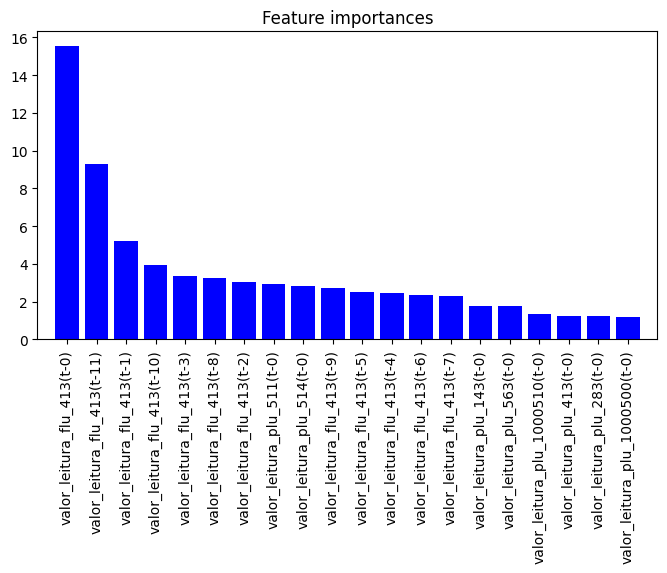

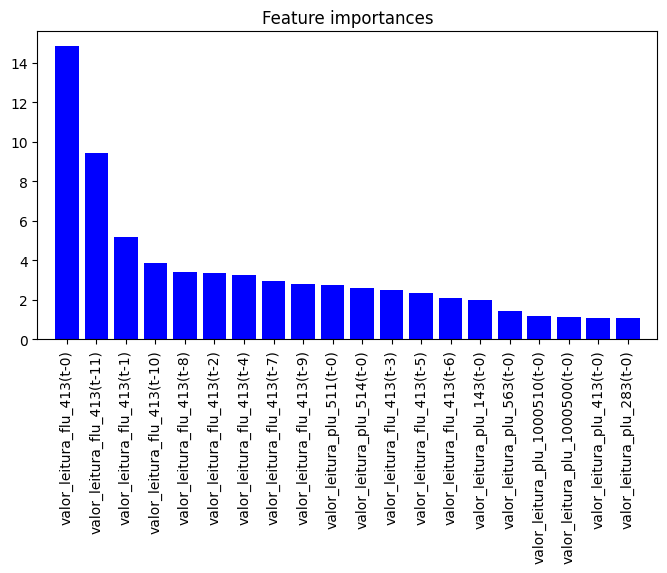

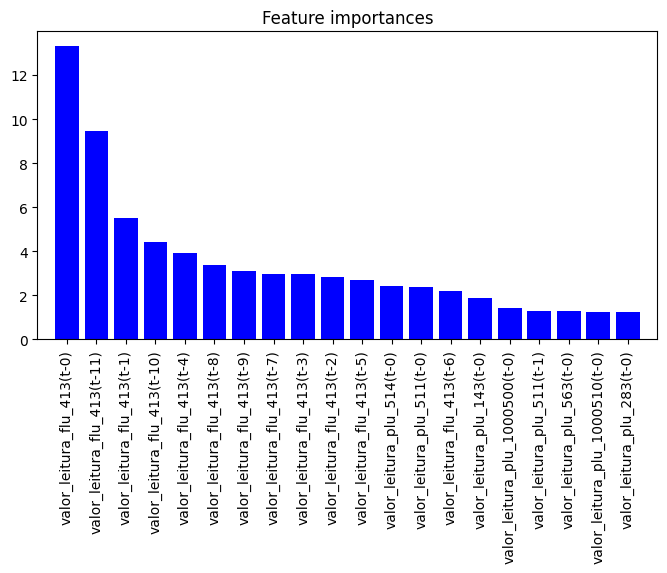

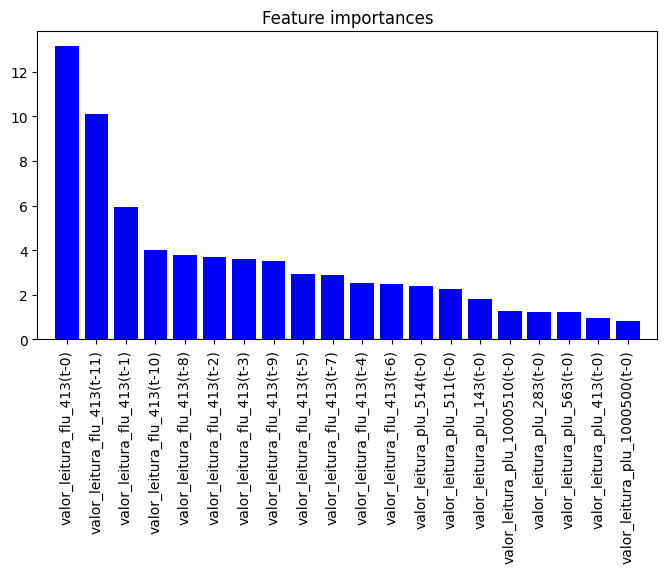

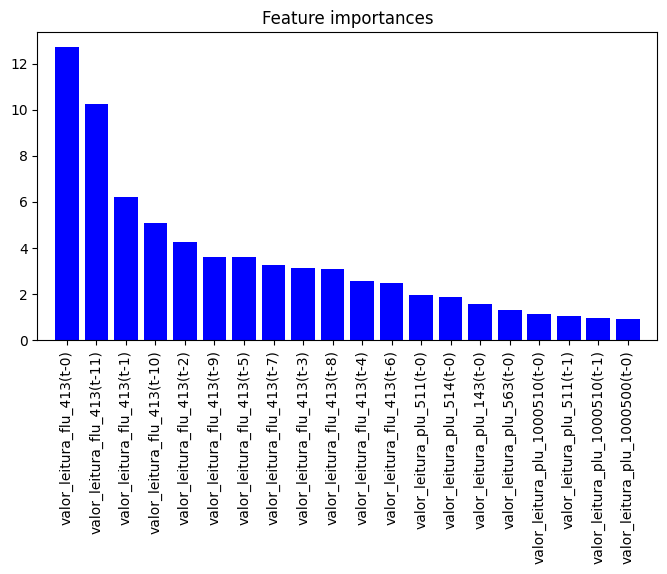

In [34]:
nse_list = []
rmse_list = []
for horizon in [3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48]:

  train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2021.drop(df_2021.index[3000:4000]),df_2022], dataframes_teste = [df_2023], horizon = horizon)
  X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = horizon)

  entradas = []
  X_train_general.columns
  for nome in X_train_general.columns:
    if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
      entradas.append(nome)

  X_train_general = X_train_general[entradas]
  X_val_general = X_val_general[entradas]
  X_test_general = X_test_general[entradas]

  X_train = np.array(X_train_general)
  X_val = np.array(X_val_general)
  X_test = np.array(X_test_general)
  y_train = np.array(y_train_general.values).ravel()
  y_val = np.array(y_val_general.values).ravel()
  y_test = np.array(y_test_general.values).ravel()

  feature_names = X_train_general.columns

  # CatBoost
  rmse_mean = 0
  nse_mean = 0
  total_iter = 1
  for i in range(total_iter):
      model, importances = training_cb(X_train,y_train)
      prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
      #plot_results(prediction,y_val,nse)
      rmse_mean += rmse
      nse_mean += nse
  rmse_mean = rmse_mean/total_iter
  nse_mean = nse_mean/total_iter
  print('Horizon: ', horizon)
  print('Average of RMSE:', rmse_mean)
  print('Average of NSE:',nse_mean)
  rmse_list.append(rmse_mean)
  nse_list.append(nse_mean)
  plot_importances(importances,feature_names,n_features_show = 20)

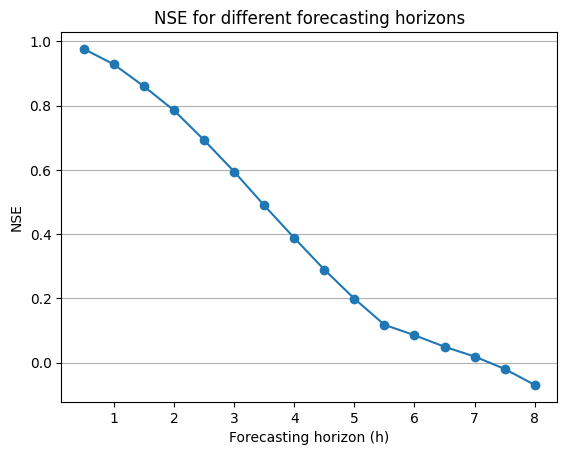

In [35]:
horizon = [0.5,1,1.5,2,2.5,3,3.5,4,4.5,5,5.5,6,6.5,7,7.5,8]
plt.grid(axis='y')
plt.plot(horizon, nse_list,marker='o',label='test')

plt.xlabel('Forecasting horizon (h)')
plt.ylabel('NSE')

plt.title('NSE for different forecasting horizons')
plt.show()

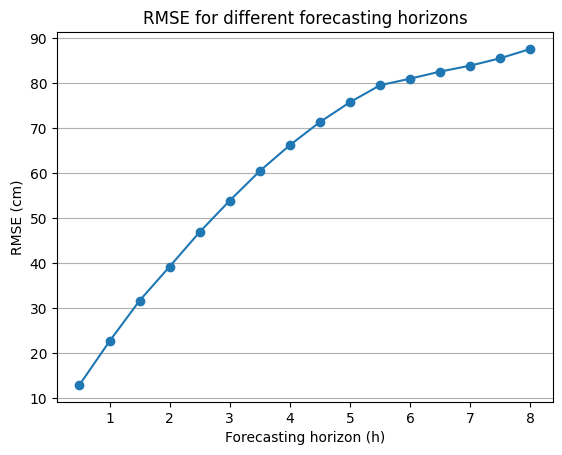

In [36]:
horizon = [0.5,1,1.5,2,2.5,3,3.5,4,4.5,5,5.5,6,6.5,7,7.5,8]
plt.grid(axis='y')
plt.plot(horizon, rmse_list,marker='o',label='test')

plt.xlabel('Forecasting horizon (h)')
plt.ylabel('RMSE (cm)')

plt.title('RMSE for different forecasting horizons')
plt.show()

# Part 5: Explainability with CatBoost and Shapley Value

<AxesSubplot:>

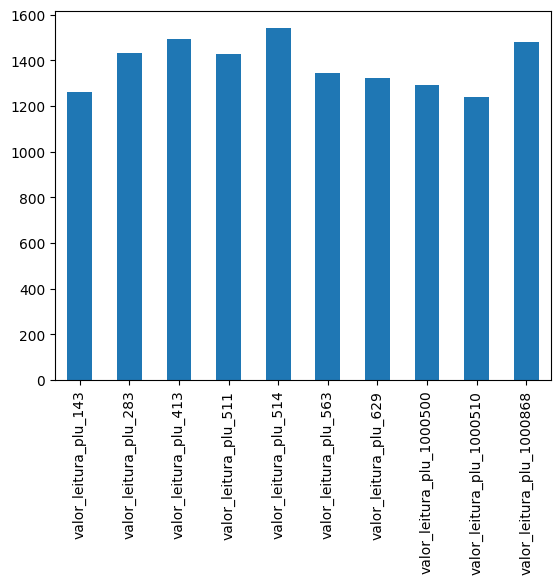

In [22]:
df_2018_2019 = pd.concat([df_2018,df_2019])
rain_gauges = []
for nome in df_2018_2019.columns:
    if 'plu' in nome:
        rain_gauges.append(nome)
df_2018_2019[rain_gauges].sum().plot.bar()

In [28]:
fluviometros = []
for nome in df_2018.columns:
    if 'flu' in nome:
        fluviometros.append(nome)
df_2018_fluviometros = df_2018[fluviometros]

<AxesSubplot:>

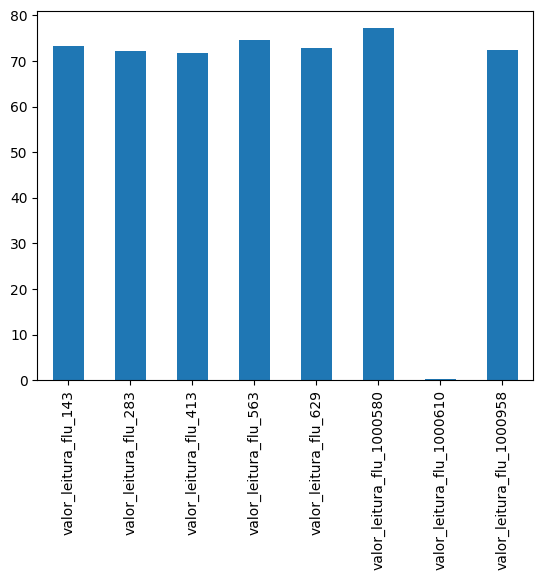

In [36]:
(df_2018_fluviometros.mean()/1000).plot.bar()

## 30 minutos

### XGBoost

Average of RMSE: 15.308655706331985
Average of NSE: 0.9775691389418533


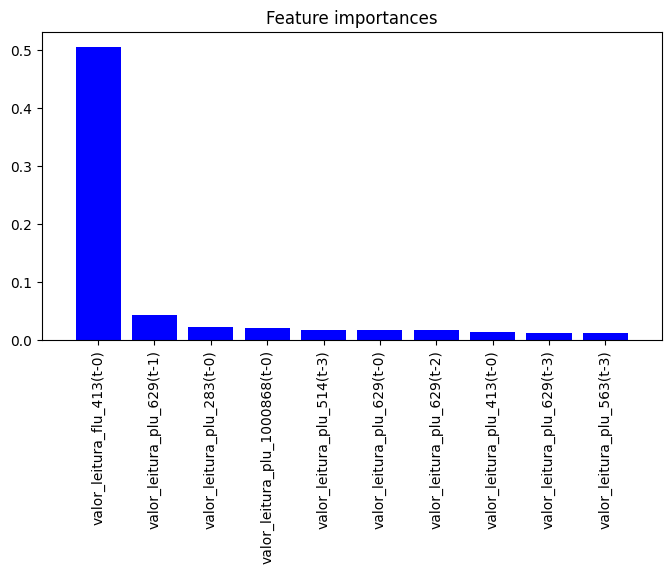

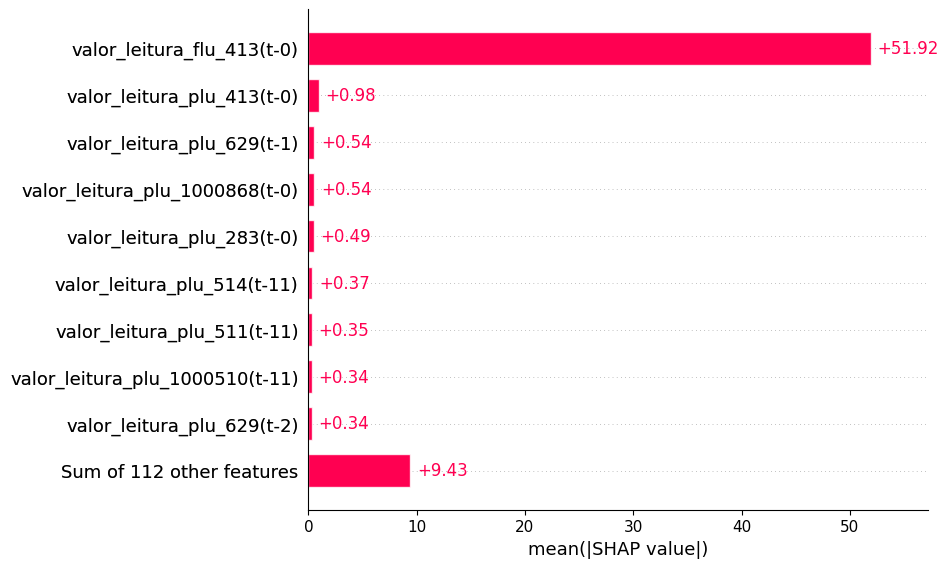

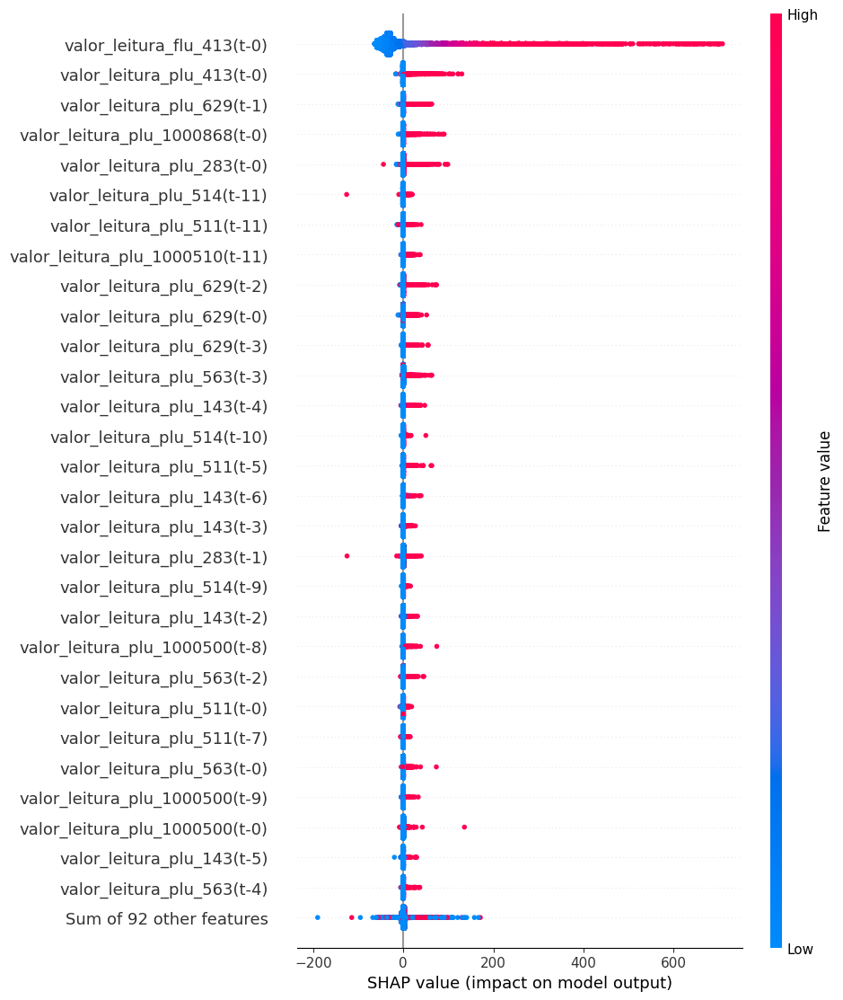

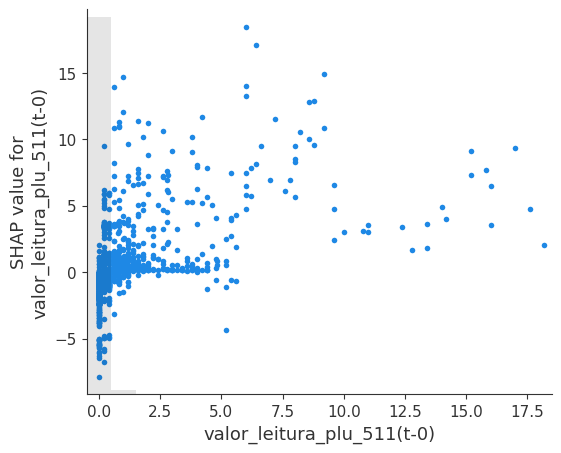

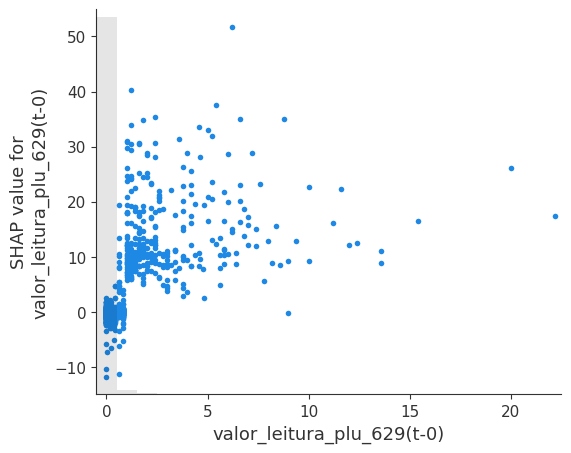

...

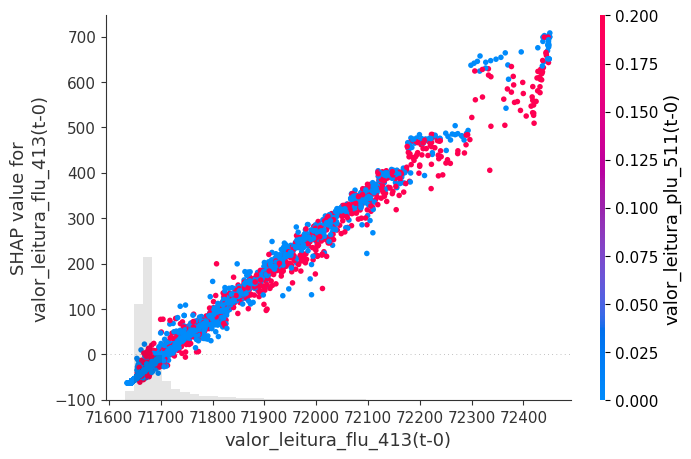

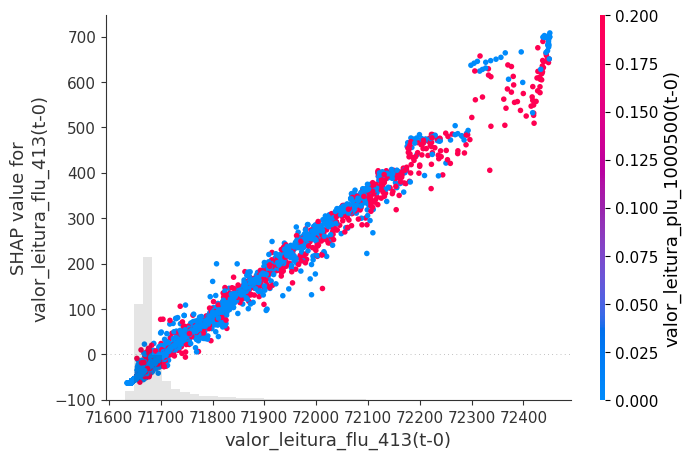

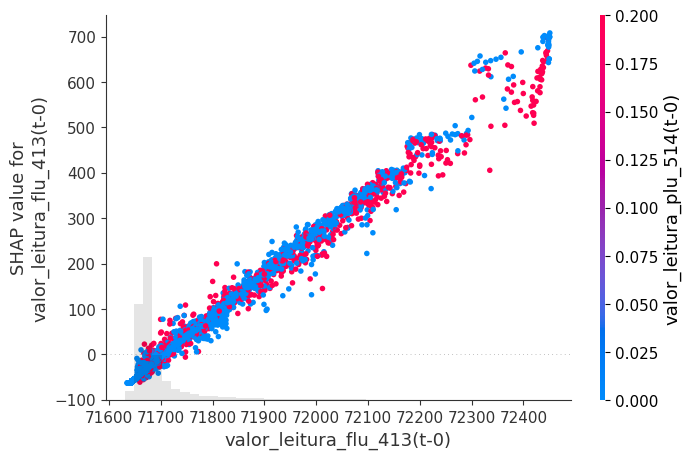

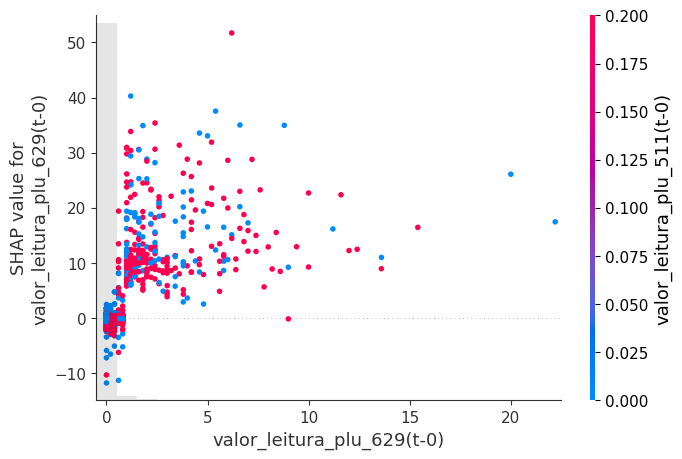

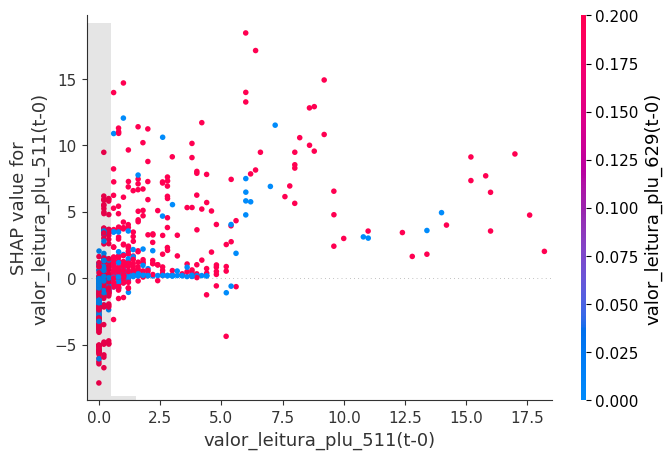

In [65]:
# 30 minutos
nse_list = []
rmse_list = []
for horizon in [3]:

  train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023], horizon = horizon)
  X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = horizon)

  entradas = []
  X_train_general.columns
  for nome in X_train_general.columns:
    if ('plu' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome and 't-0' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
      entradas.append(nome)

  X_train_general = X_train_general[entradas]
  X_val_general = X_val_general[entradas]
  X_test_general = X_test_general[entradas]

  X_train = np.array(X_train_general)
  X_val = np.array(X_val_general)
  X_test = np.array(X_test_general)
  y_train = np.array(y_train_general.values).ravel()
  y_val = np.array(y_val_general.values).ravel()
  y_test = np.array(y_test_general.values).ravel()

  feature_names = X_train_general.columns

  # XGBoost
  rmse_mean = 0
  nse_mean = 0
  total_iter = 1
  for i in range(total_iter):
      model, importances = training_xgb(X_train,y_train)
      prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
      #plot_results(prediction,y_val,nse)
      rmse_mean += rmse
      nse_mean += nse
  rmse_mean = rmse_mean/total_iter
  nse_mean = nse_mean/total_iter
  print('Average of RMSE:', rmse_mean)
  print('Average of NSE:',nse_mean)
  plot_importances(importances,feature_names,n_features_show = 10)

  explainer = shap.Explainer(model)
  shap_values = explainer(X_train_general)

  shap.plots.bar(shap_values)
  shap.plots.beeswarm(shap_values, max_display = 30)
  #shap.plots.beeswarm(shap_values, max_display = 20, order=shap_values.abs.max(0))
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_413(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_1000500(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_514(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_plu_629(t-0)"])

### Catboost

Average of RMSE: 13.702561191386103
Average of NSE: 0.9820288721455996


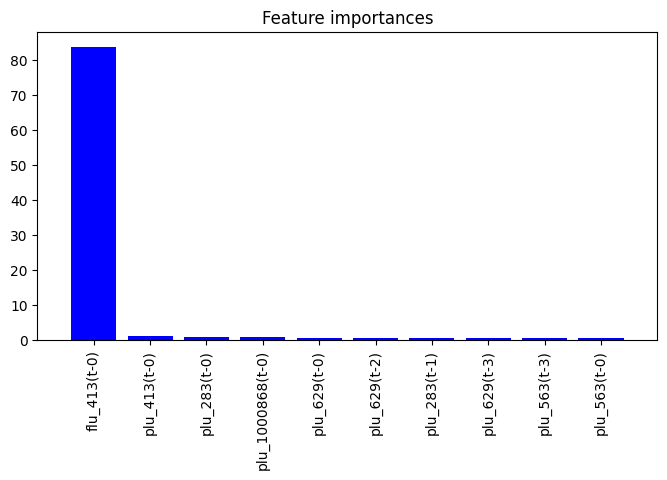

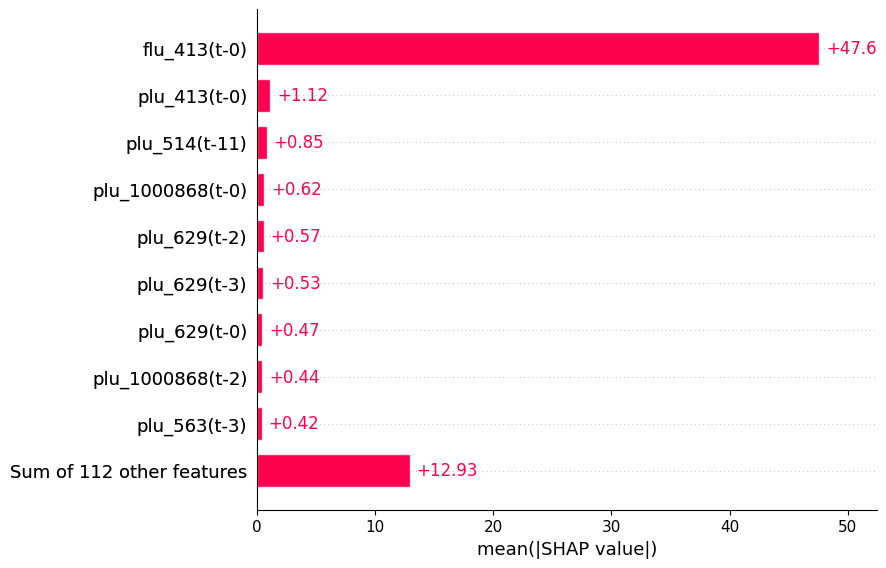

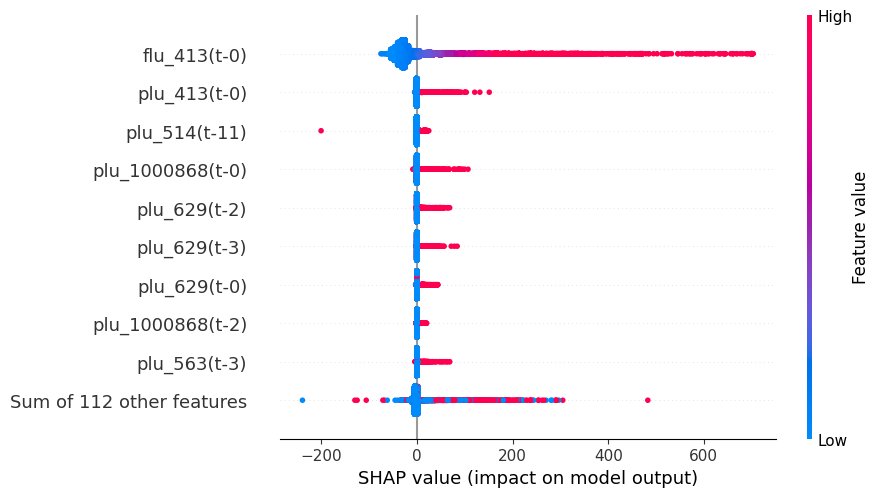

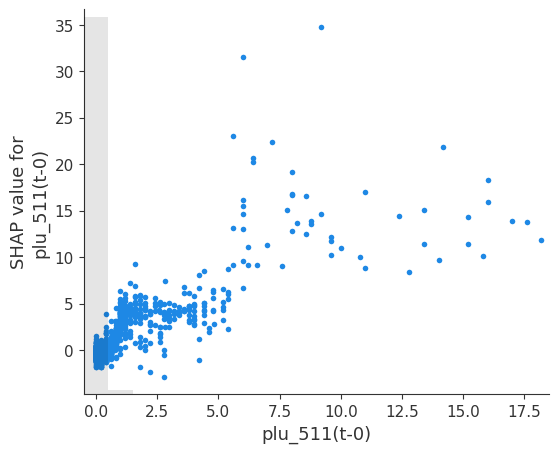

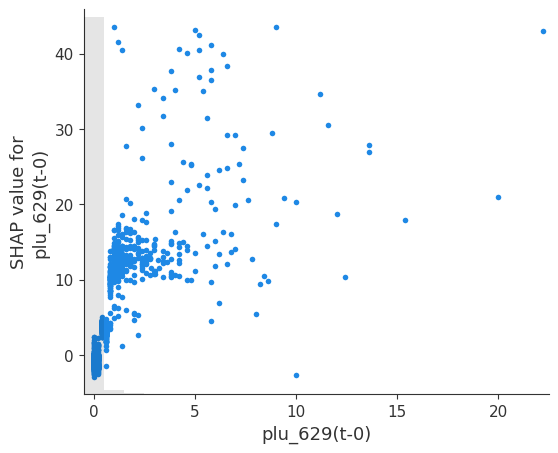

...

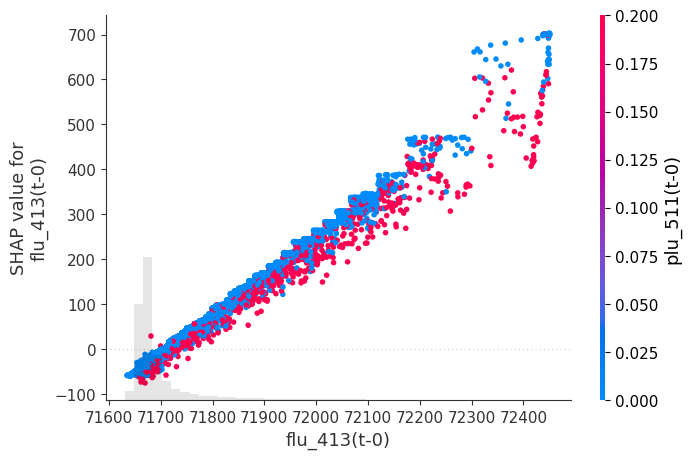

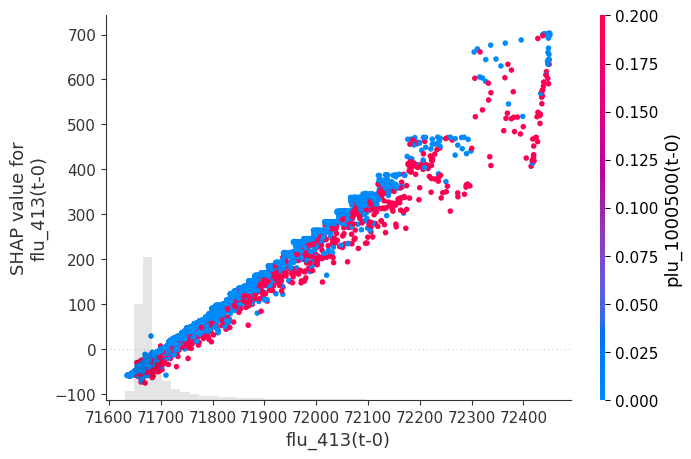

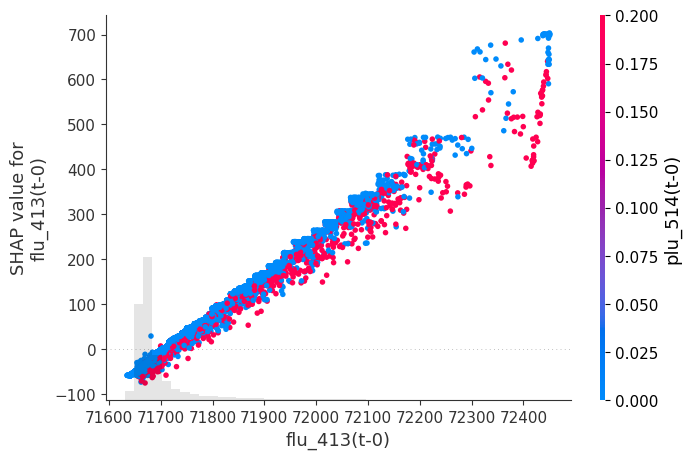

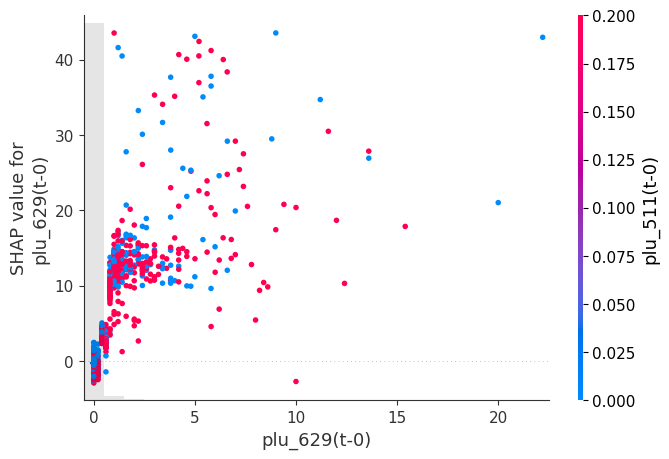

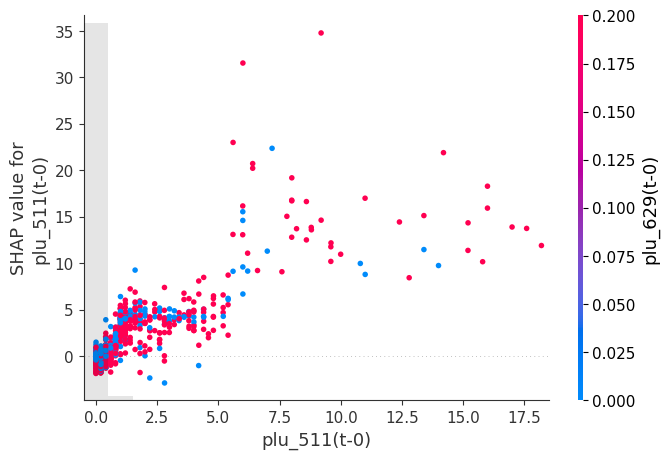

In [83]:
# 30 minutos
nse_list = []
rmse_list = []
for horizon in [3]:
  train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023], horizon = horizon)
  X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = horizon)

  entradas = []
  X_train_general.columns
  for nome in X_train_general.columns:
    if ('plu' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome and 't-0' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
      entradas.append(nome)

  X_train_general = X_train_general[entradas]
  X_val_general = X_val_general[entradas]
  X_test_general = X_test_general[entradas]

  # Renaming columns
  for X in [X_train_general,X_val_general,X_test_general]:
     for column in X.columns:
        X.rename(columns={column: column.replace('valor_leitura_','')},inplace=True)

  X_train = np.array(X_train_general)
  X_val = np.array(X_val_general)
  X_test = np.array(X_test_general)
  y_train = np.array(y_train_general.values).ravel()
  y_val = np.array(y_val_general.values).ravel()
  y_test = np.array(y_test_general.values).ravel()

  feature_names = X_train_general.columns

  # CatBoost
  rmse_mean = 0
  nse_mean = 0
  total_iter = 1
  for i in range(total_iter):
      model, importances = training_cb(X_train,y_train)
      prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
      #plot_results(prediction,y_val,nse)
      rmse_mean += rmse
      nse_mean += nse
  rmse_mean = rmse_mean/total_iter
  nse_mean = nse_mean/total_iter
  print('Average of RMSE:', rmse_mean)
  print('Average of NSE:',nse_mean)
  plot_importances(importances,feature_names,n_features_show = 10)

  explainer = shap.Explainer(model)
  shap_values = explainer(X_train_general)

  shap.plots.bar(shap_values)
  shap.plots.beeswarm(shap_values, max_display = 10)
  #shap.plots.beeswarm(shap_values, max_display = 20, order=shap_values.abs.max(0))
  shap.plots.scatter(shap_values[:,"plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"plu_629(t-0)"])
  shap.plots.scatter(shap_values[:,"flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"plu_511(t-0)"],color=shap_values[:,"flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"plu_629(t-0)"],color=shap_values[:,"flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"flu_413(t-0)"],color=shap_values[:,"plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"flu_413(t-0)"],color=shap_values[:,"plu_1000500(t-0)"])
  shap.plots.scatter(shap_values[:,"flu_413(t-0)"],color=shap_values[:,"plu_514(t-0)"])
  shap.plots.scatter(shap_values[:,"plu_629(t-0)"],color=shap_values[:,"plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"plu_511(t-0)"],color=shap_values[:,"plu_629(t-0)"])

## 1 hora

### XGBoost

Average of RMSE: 23.92107801227016
Average of NSE: 0.9452408195451709


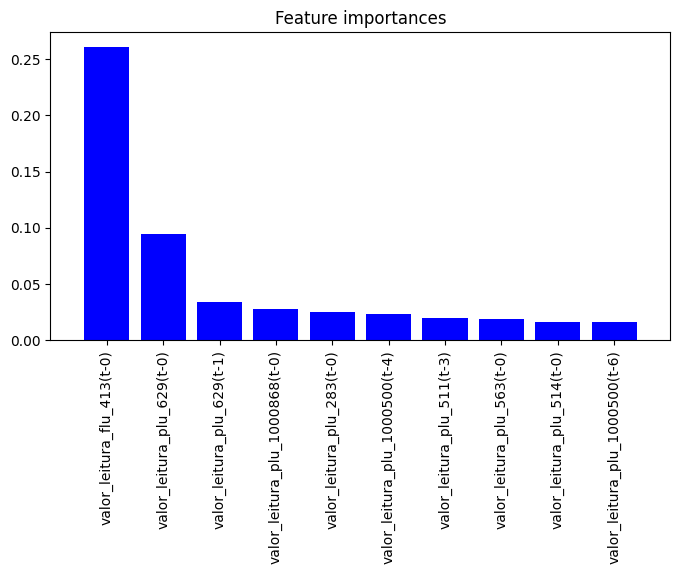

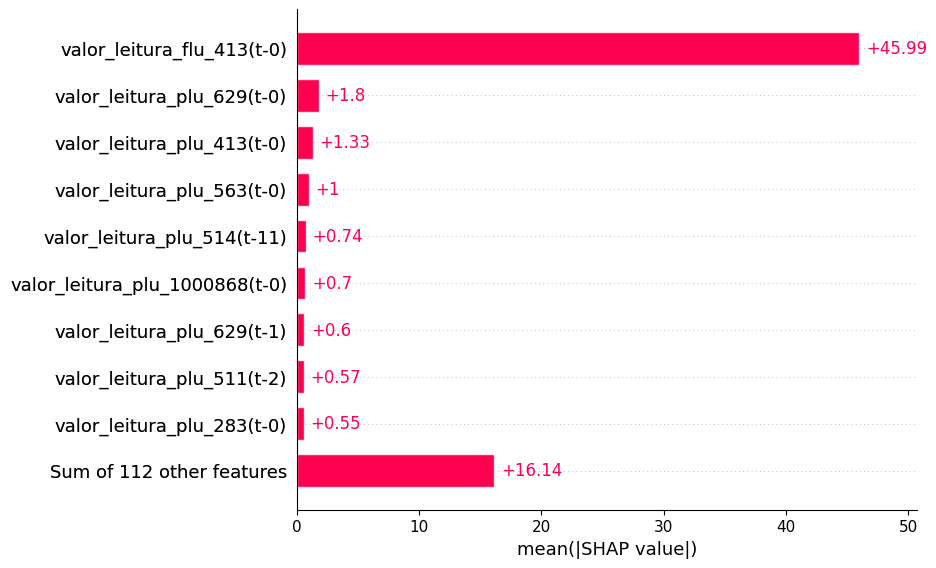

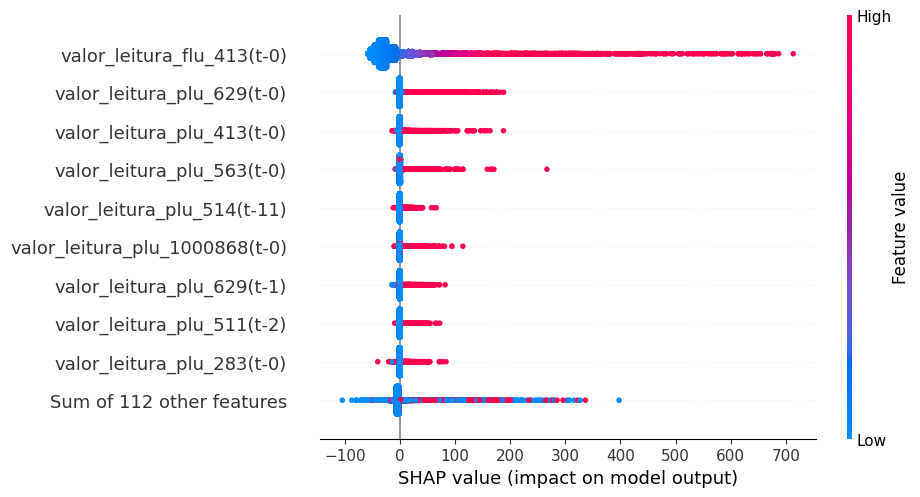

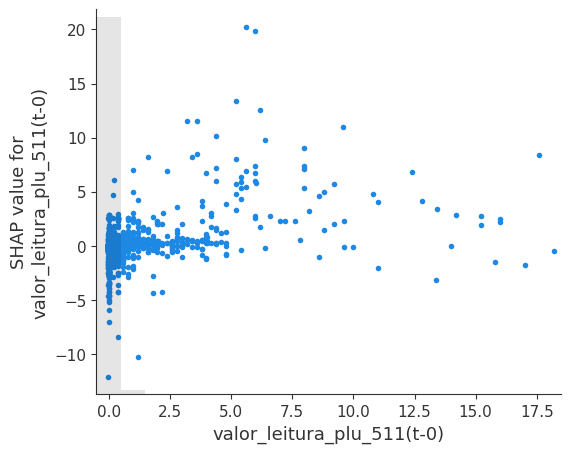

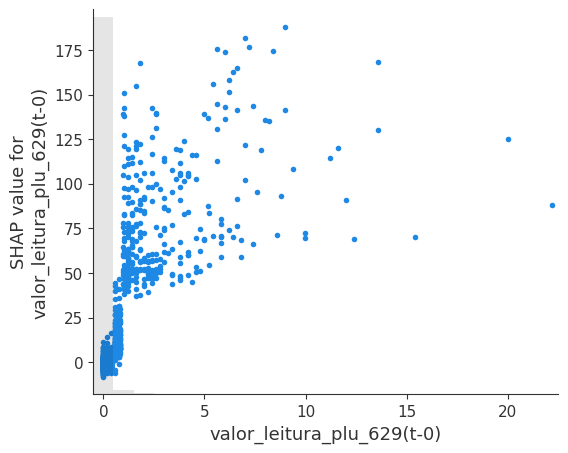

...

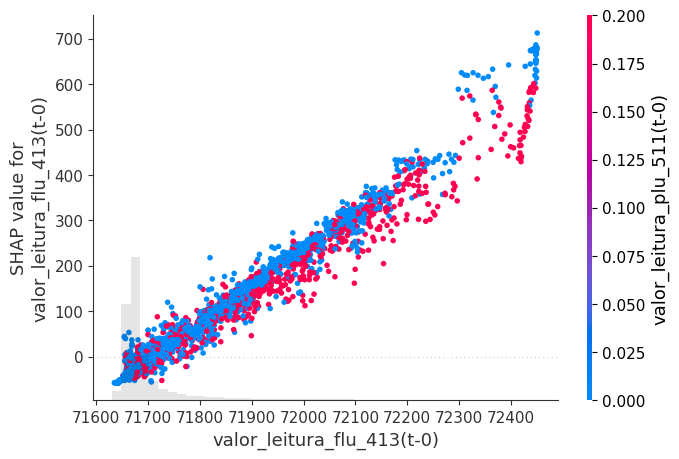

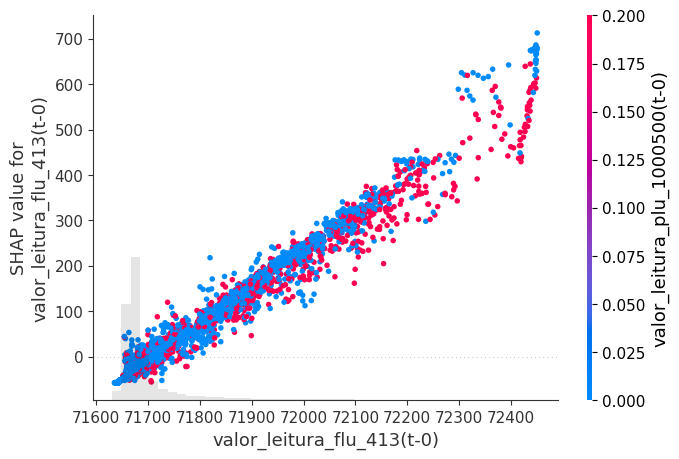

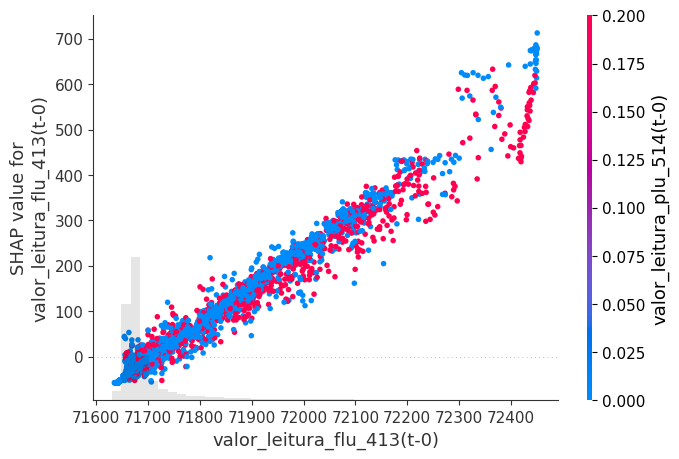

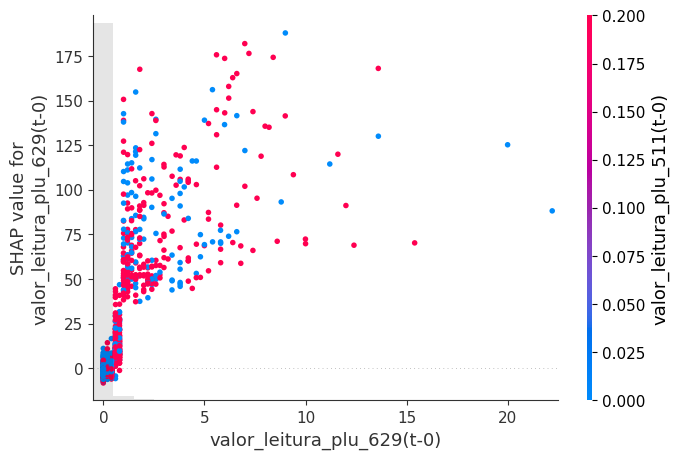

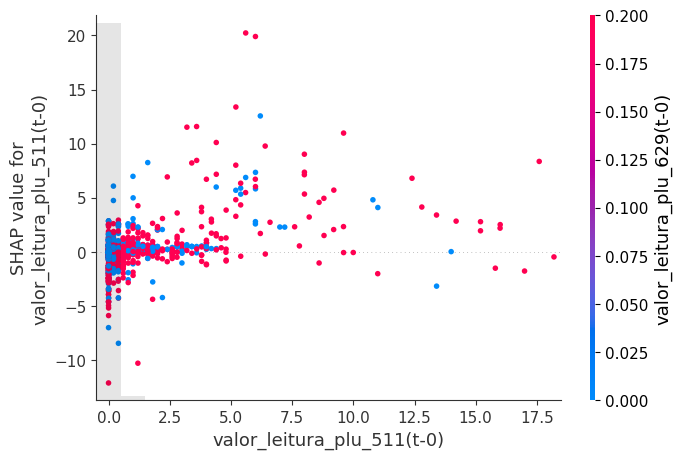

In [66]:
# 1 horas
nse_list = []
rmse_list = []
for horizon in [6]:

  train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023], horizon = horizon)
  X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = horizon)

  entradas = []
  X_train_general.columns
  for nome in X_train_general.columns:
    if ('plu' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome and 't-0' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
      entradas.append(nome)

  X_train_general = X_train_general[entradas]
  X_val_general = X_val_general[entradas]
  X_test_general = X_test_general[entradas]

  X_train = np.array(X_train_general)
  X_val = np.array(X_val_general)
  X_test = np.array(X_test_general)
  y_train = np.array(y_train_general.values).ravel()
  y_val = np.array(y_val_general.values).ravel()
  y_test = np.array(y_test_general.values).ravel()

  feature_names = X_train_general.columns

  # CatBoost
  rmse_mean = 0
  nse_mean = 0
  total_iter = 1
  for i in range(total_iter):
      model, importances = training_xgb(X_train,y_train)
      prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
      #plot_results(prediction,y_val,nse)
      rmse_mean += rmse
      nse_mean += nse
  rmse_mean = rmse_mean/total_iter
  nse_mean = nse_mean/total_iter
  print('Average of RMSE:', rmse_mean)
  print('Average of NSE:',nse_mean)
  plot_importances(importances,feature_names,n_features_show = 10)

  explainer = shap.Explainer(model)
  shap_values = explainer(X_train_general)

  shap.plots.bar(shap_values)
  shap.plots.beeswarm(shap_values, max_display = 10)
  #shap.plots.beeswarm(shap_values, max_display = 20, order=shap_values.abs.max(0))
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_1000500(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_514(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_plu_629(t-0)"])

### CatBoost

Average of RMSE: 22.470485487340987
Average of NSE: 0.9516807309026685


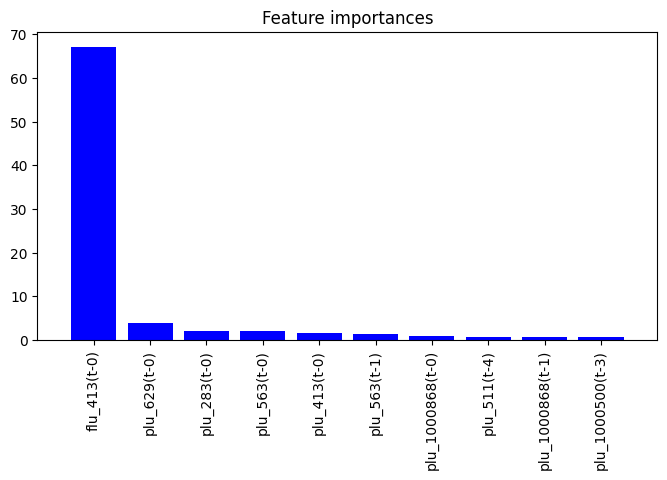

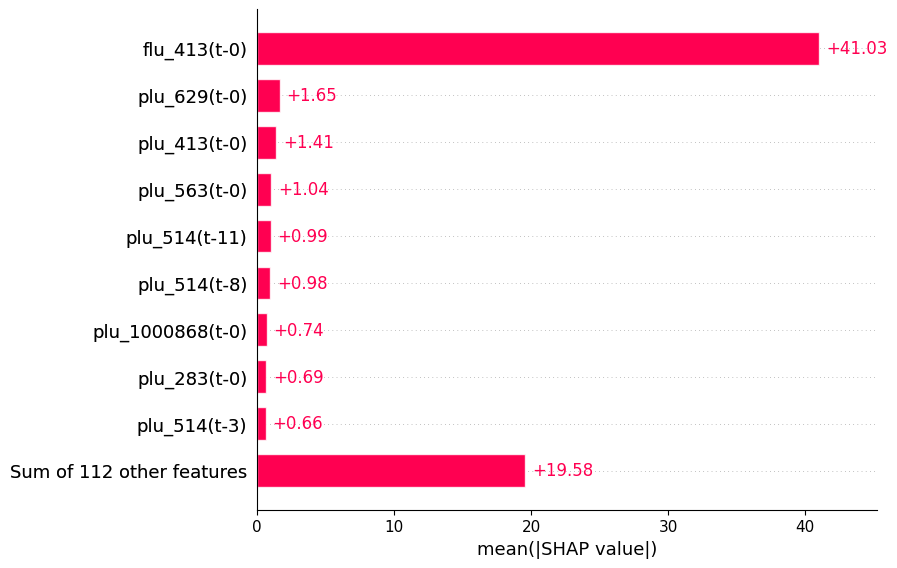

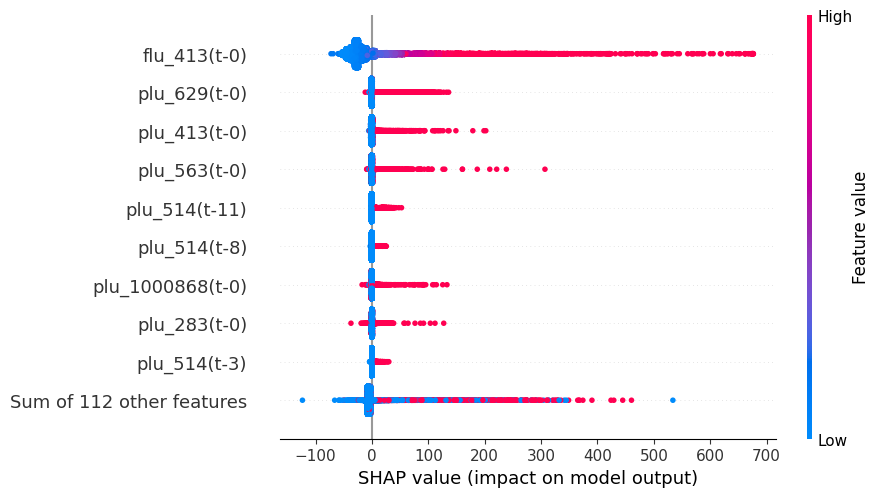

In [84]:
# 1 horas
nse_list = []
rmse_list = []
for horizon in [6]:

  train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023], horizon = horizon)
  X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = horizon)

  entradas = []
  X_train_general.columns
  for nome in X_train_general.columns:
    if ('plu' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome and 't-0' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
      entradas.append(nome)

  X_train_general = X_train_general[entradas]
  X_val_general = X_val_general[entradas]
  X_test_general = X_test_general[entradas]

  # Renaming columns
  for X in [X_train_general,X_val_general,X_test_general]:
     for column in X.columns:
        X.rename(columns={column: column.replace('valor_leitura_','')},inplace=True)

  X_train = np.array(X_train_general)
  X_val = np.array(X_val_general)
  X_test = np.array(X_test_general)
  y_train = np.array(y_train_general.values).ravel()
  y_val = np.array(y_val_general.values).ravel()
  y_test = np.array(y_test_general.values).ravel()

  feature_names = X_train_general.columns

  # CatBoost
  rmse_mean = 0
  nse_mean = 0
  total_iter = 1
  for i in range(total_iter):
      model, importances = training_cb(X_train,y_train)
      prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
      #plot_results(prediction,y_val,nse)
      rmse_mean += rmse
      nse_mean += nse
  rmse_mean = rmse_mean/total_iter
  nse_mean = nse_mean/total_iter
  print('Average of RMSE:', rmse_mean)
  print('Average of NSE:',nse_mean)
  plot_importances(importances,feature_names,n_features_show = 10)

  explainer = shap.Explainer(model)
  shap_values = explainer(X_train_general)

  shap.plots.bar(shap_values)
  shap.plots.beeswarm(shap_values, max_display = 10)
  #shap.plots.beeswarm(shap_values, max_display = 20, order=shap_values.abs.max(0))
  # shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"])
  # shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"])
  # shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"])
  # shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])
  # shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])
  # shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])
  # shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_1000500(t-0)"])
  # shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_514(t-0)"])
  # shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])
  # shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_plu_629(t-0)"])

## 2 horas

### XGBoost

Average of RMSE: 41.005402041079975
Average of NSE: 0.8391476989482345


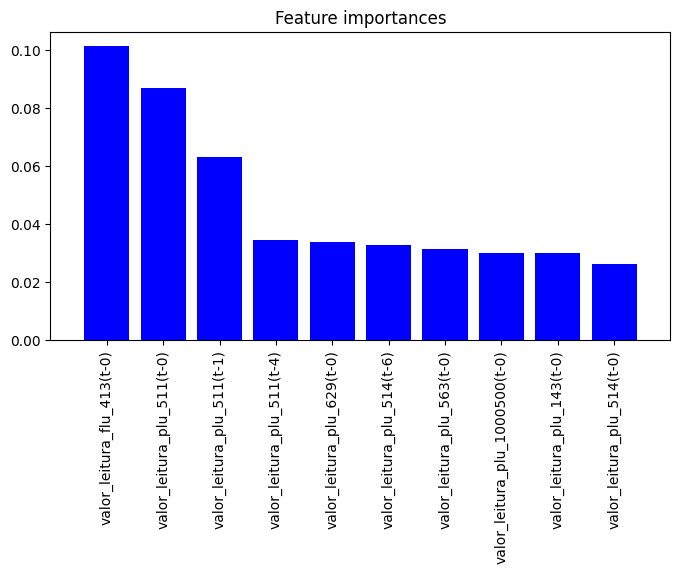

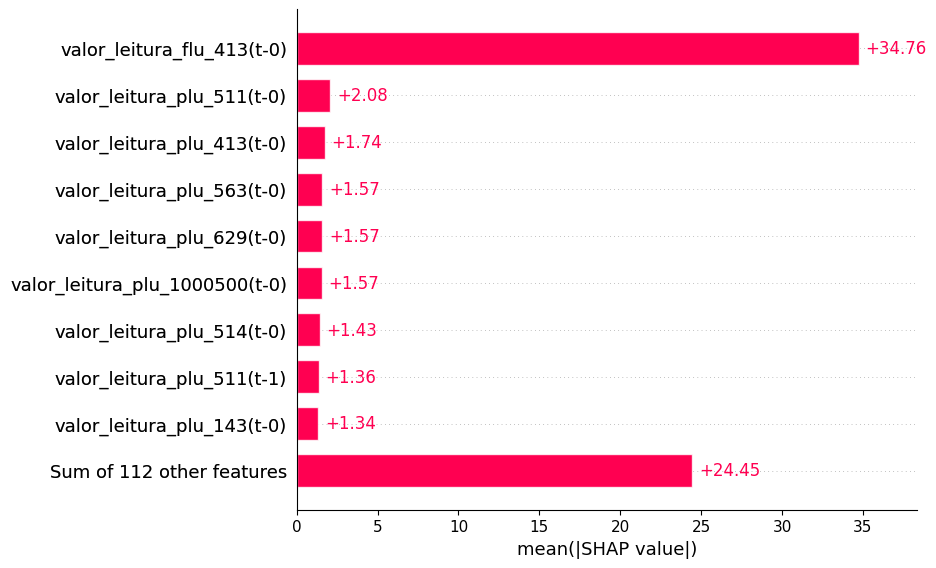

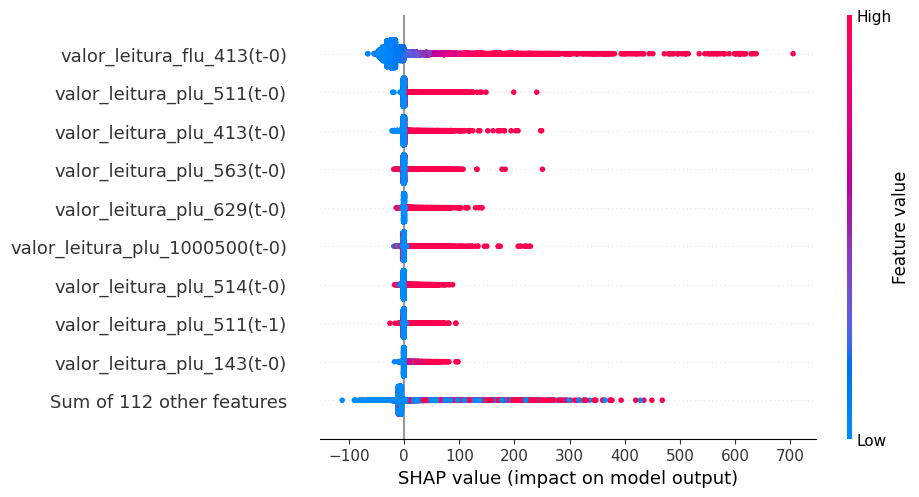

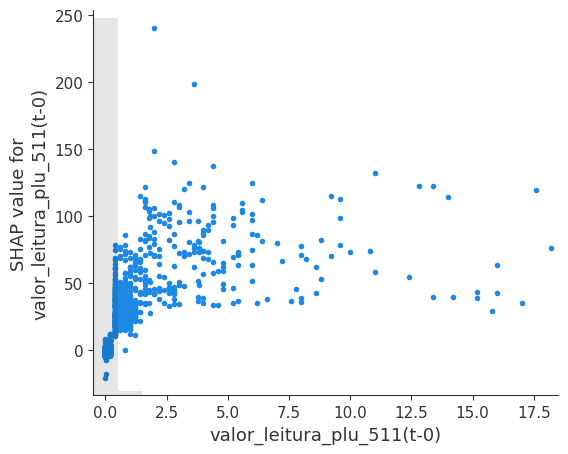

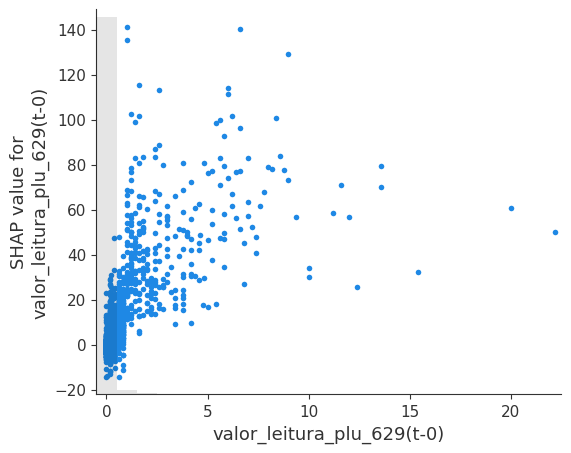

...

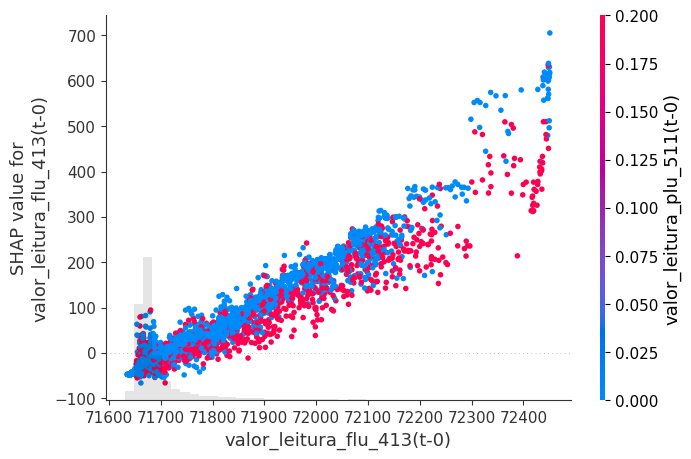

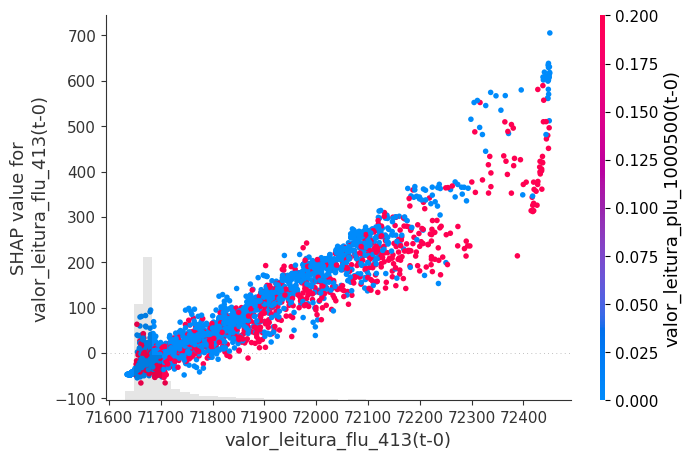

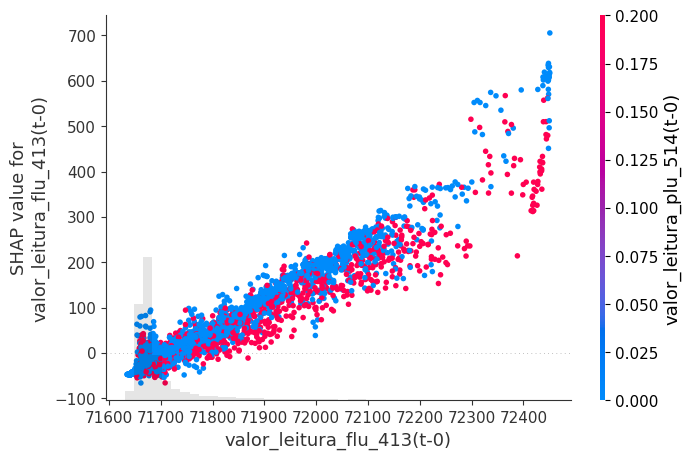

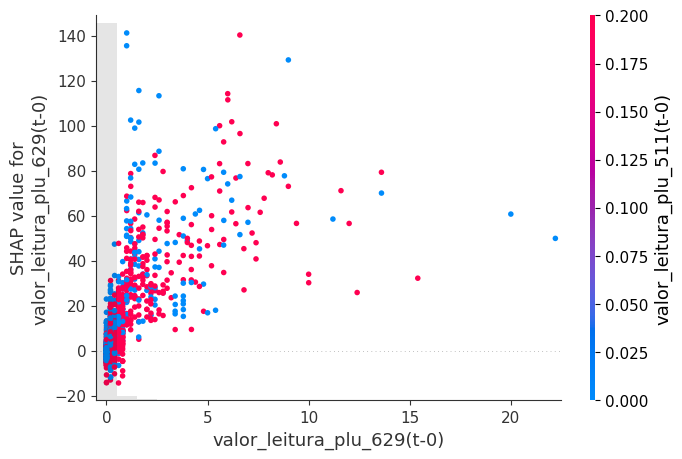

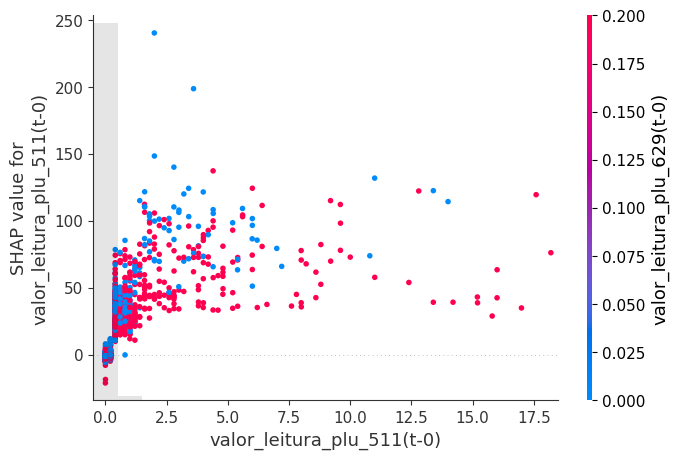

In [74]:
# 2 horas
nse_list = []
rmse_list = []
for horizon in [12]:

  train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023], horizon = horizon)
  X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = horizon)

  entradas = []
  X_train_general.columns
  for nome in X_train_general.columns:
    if ('plu' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome and 't-0' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
      entradas.append(nome)

  X_train_general = X_train_general[entradas]
  X_val_general = X_val_general[entradas]
  X_test_general = X_test_general[entradas]

  X_train = np.array(X_train_general)
  X_val = np.array(X_val_general)
  X_test = np.array(X_test_general)
  y_train = np.array(y_train_general.values).ravel()
  y_val = np.array(y_val_general.values).ravel()
  y_test = np.array(y_test_general.values).ravel()

  feature_names = X_train_general.columns

  # CatBoost
  rmse_mean = 0
  nse_mean = 0
  total_iter = 1
  for i in range(total_iter):
      model, importances = training_xgb(X_train,y_train)
      prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
      #plot_results(prediction,y_val,nse)
      rmse_mean += rmse
      nse_mean += nse
  rmse_mean = rmse_mean/total_iter
  nse_mean = nse_mean/total_iter
  print('Average of RMSE:', rmse_mean)
  print('Average of NSE:',nse_mean)
  plot_importances(importances,feature_names,n_features_show = 10)

  explainer = shap.Explainer(model)
  shap_values = explainer(X_train_general)
  #shap_values = explainer(X_train_general.sort_values(by='valor_leitura_flu_413(t-0)', ascending = False)[0:200])

  shap.plots.bar(shap_values)
  shap.plots.beeswarm(shap_values, max_display = 10)
  #shap.plots.beeswarm(shap_values, max_display = 20, order=shap_values.abs.max(0))
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_1000500(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_514(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_plu_629(t-0)"])

### CatBoost

Average of RMSE: 39.25615918145082
Average of NSE: 0.8525785286491758


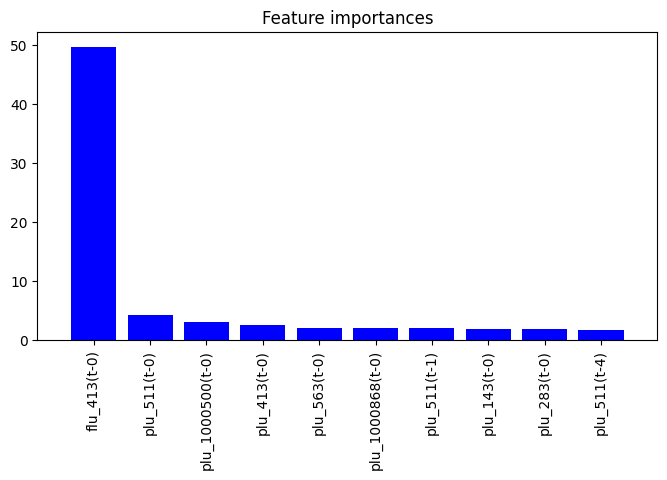

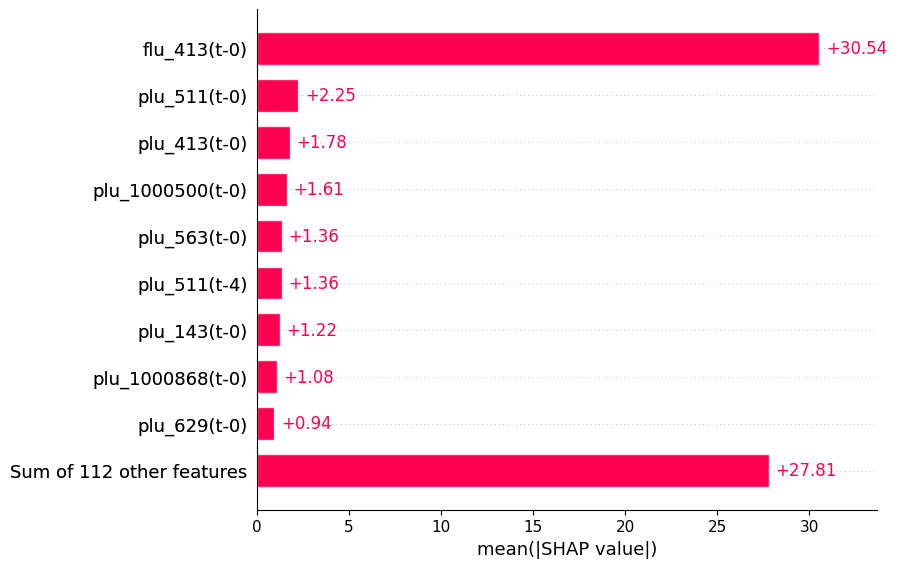

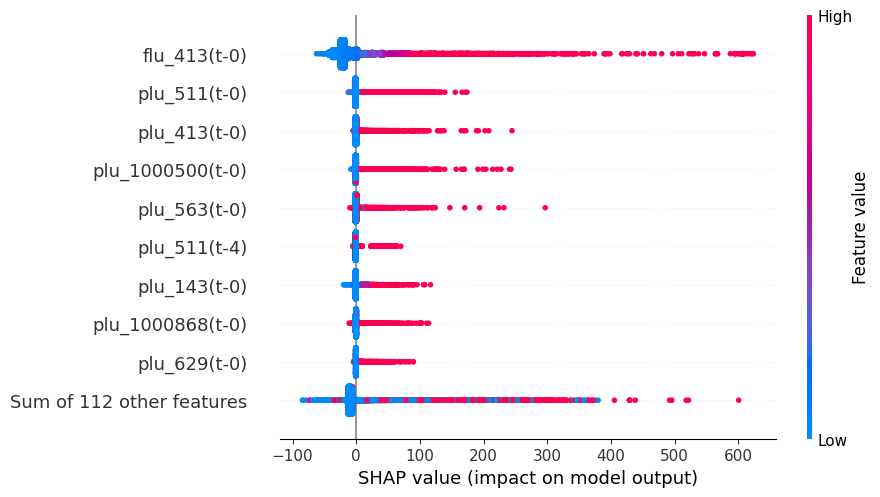

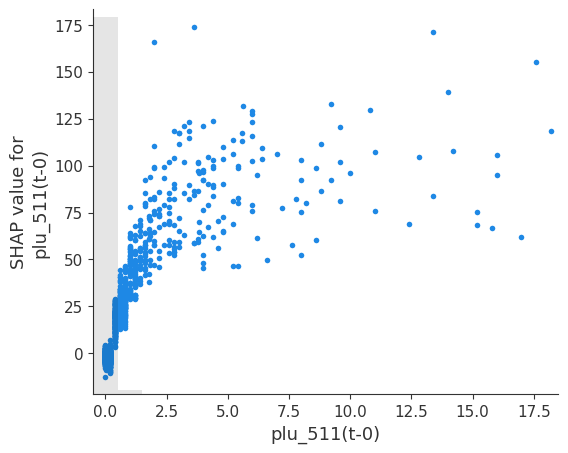

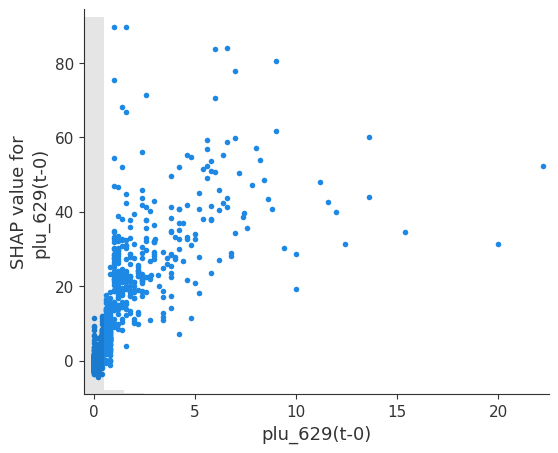

...

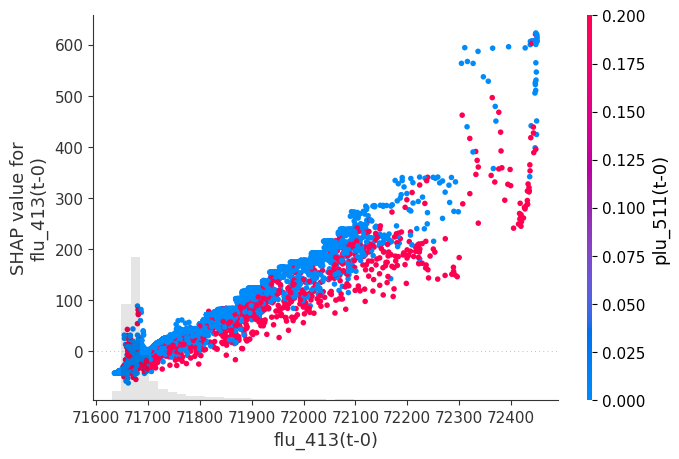

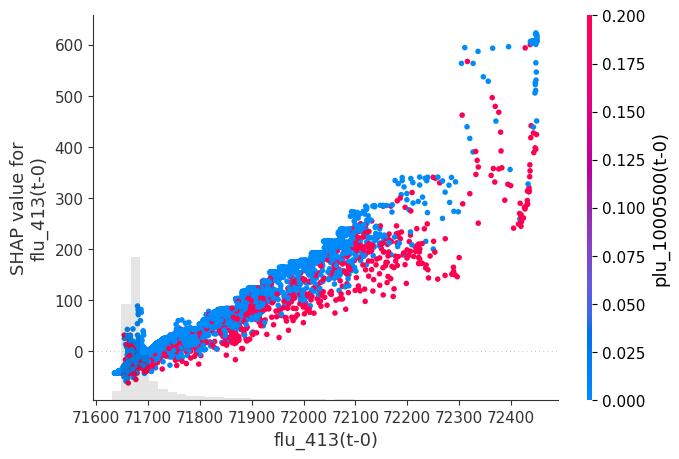

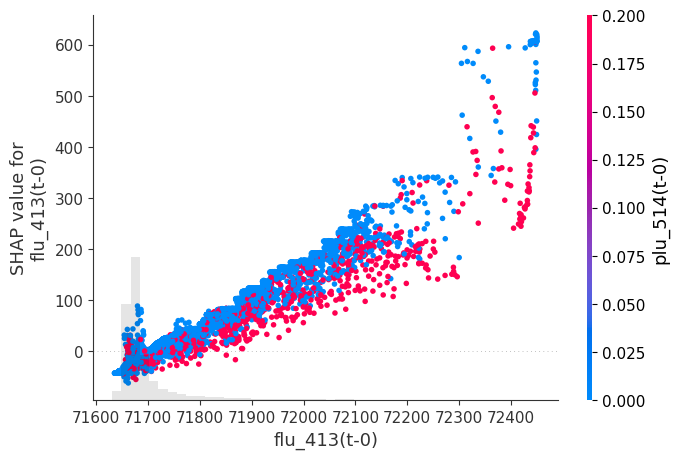

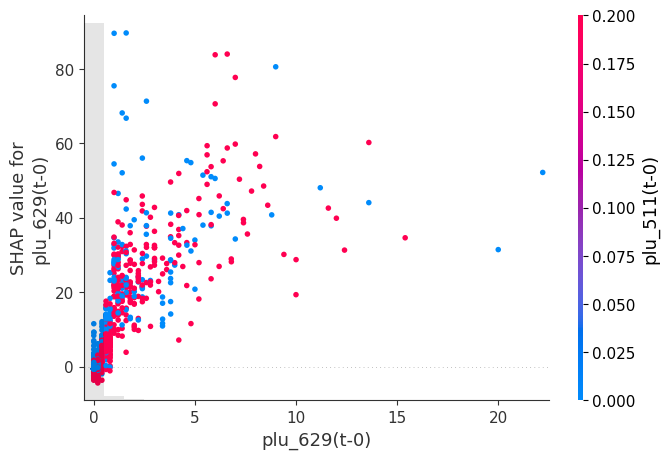

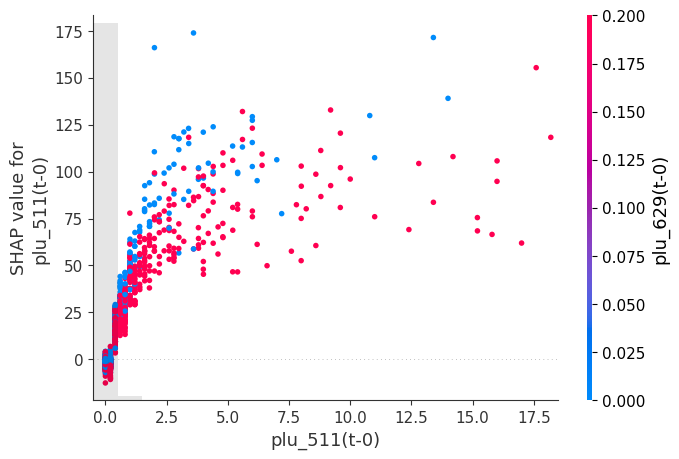

In [85]:
# 2 horas
nse_list = []
rmse_list = []
for horizon in [12]:

  train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023], horizon = horizon)
  X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = horizon)

  entradas = []
  X_train_general.columns
  for nome in X_train_general.columns:
    if ('plu' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome and 't-0' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
      entradas.append(nome)

  X_train_general = X_train_general[entradas]
  X_val_general = X_val_general[entradas]
  X_test_general = X_test_general[entradas]

  # Renaming columns
  for X in [X_train_general,X_val_general,X_test_general]:
     for column in X.columns:
        X.rename(columns={column: column.replace('valor_leitura_','')},inplace=True)

  X_train = np.array(X_train_general)
  X_val = np.array(X_val_general)
  X_test = np.array(X_test_general)
  y_train = np.array(y_train_general.values).ravel()
  y_val = np.array(y_val_general.values).ravel()
  y_test = np.array(y_test_general.values).ravel()

  feature_names = X_train_general.columns

  # CatBoost
  rmse_mean = 0
  nse_mean = 0
  total_iter = 1
  for i in range(total_iter):
      model, importances = training_cb(X_train,y_train)
      prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
      #plot_results(prediction,y_val,nse)
      rmse_mean += rmse
      nse_mean += nse
  rmse_mean = rmse_mean/total_iter
  nse_mean = nse_mean/total_iter
  print('Average of RMSE:', rmse_mean)
  print('Average of NSE:',nse_mean)
  plot_importances(importances,feature_names,n_features_show = 10)

  explainer = shap.Explainer(model)
  shap_values = explainer(X_train_general)
  #shap_values = explainer(X_train_general.sort_values(by='valor_leitura_flu_413(t-0)', ascending = False)[0:200])

  shap.plots.bar(shap_values)
  shap.plots.beeswarm(shap_values, max_display = 10)
  #shap.plots.beeswarm(shap_values, max_display = 20, order=shap_values.abs.max(0))
  shap.plots.scatter(shap_values[:,"plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"plu_629(t-0)"])
  shap.plots.scatter(shap_values[:,"flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"plu_511(t-0)"],color=shap_values[:,"flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"plu_629(t-0)"],color=shap_values[:,"flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"flu_413(t-0)"],color=shap_values[:,"plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"flu_413(t-0)"],color=shap_values[:,"plu_1000500(t-0)"])
  shap.plots.scatter(shap_values[:,"flu_413(t-0)"],color=shap_values[:,"plu_514(t-0)"])
  shap.plots.scatter(shap_values[:,"plu_629(t-0)"],color=shap_values[:,"plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"plu_511(t-0)"],color=shap_values[:,"plu_629(t-0)"])

### Catboost em condições específicas

Average of RMSE: 39.25615918145082
Average of NSE: 0.8525785286491758


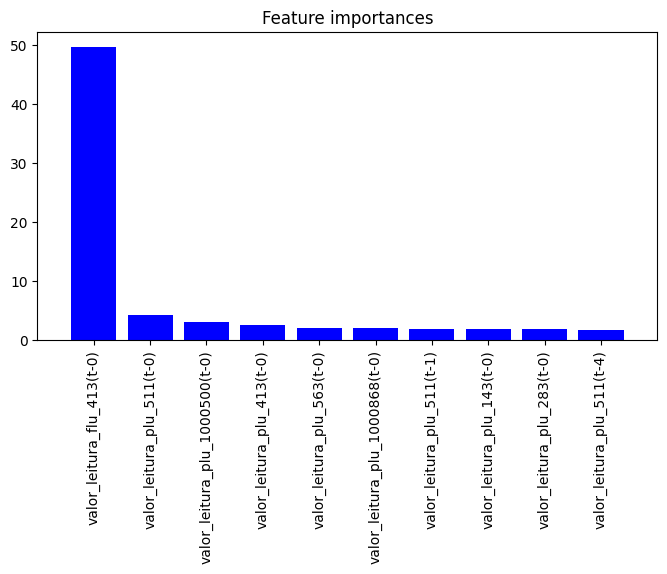

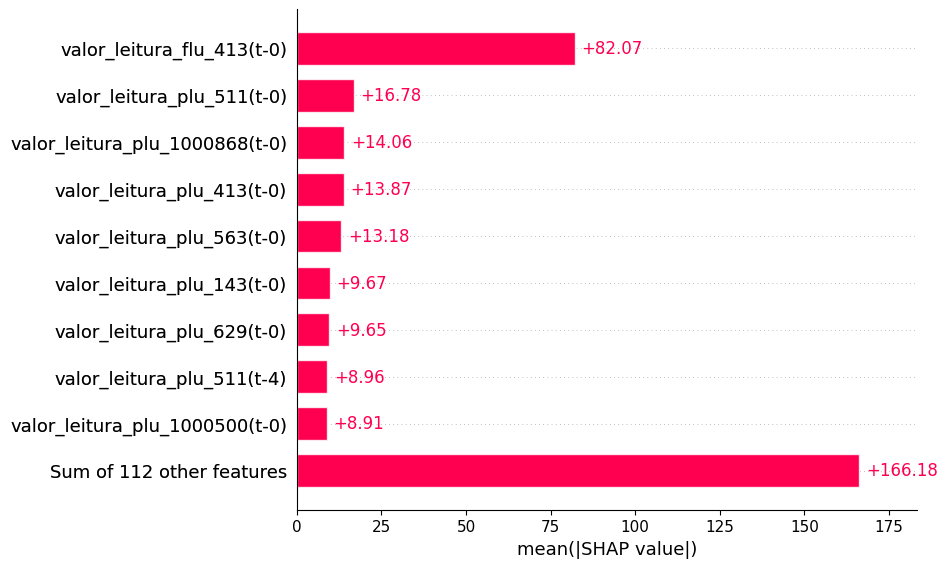

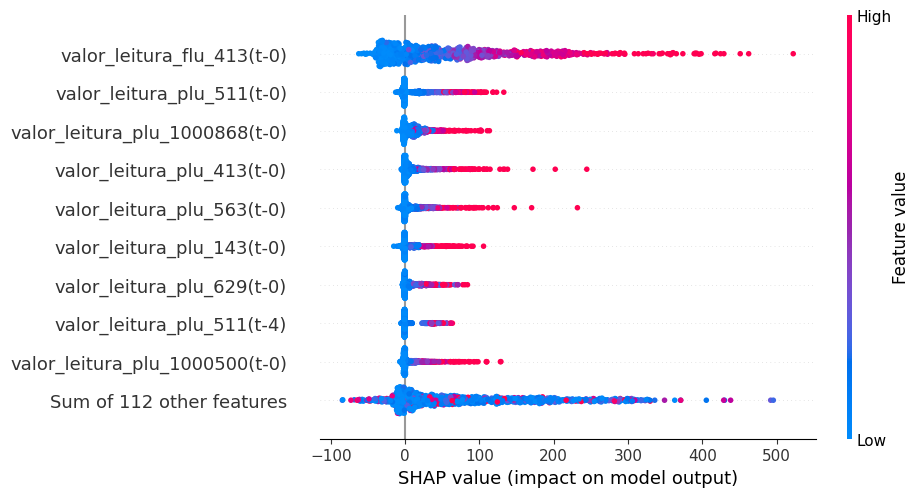

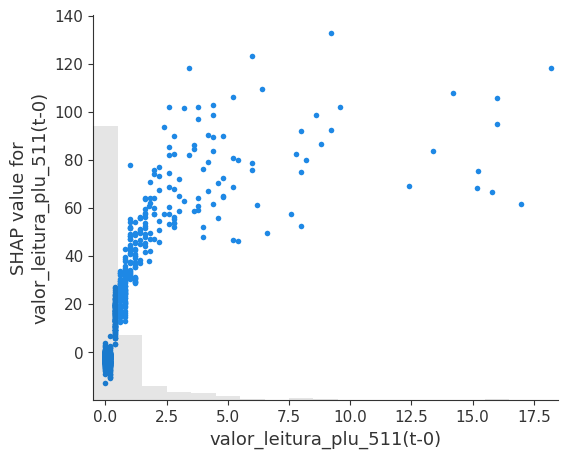

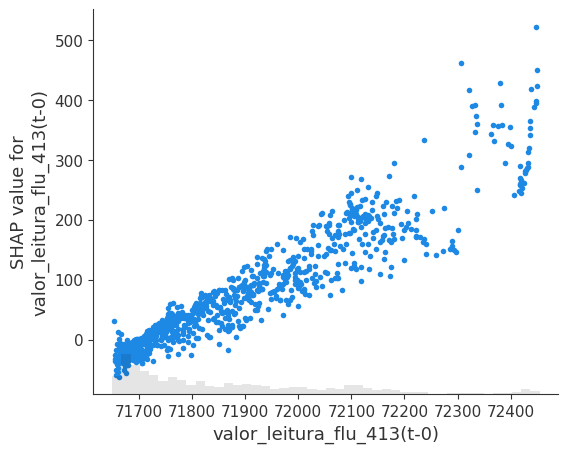

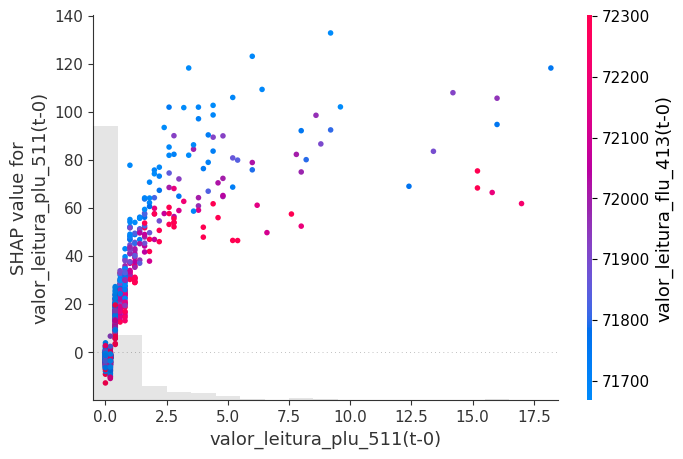

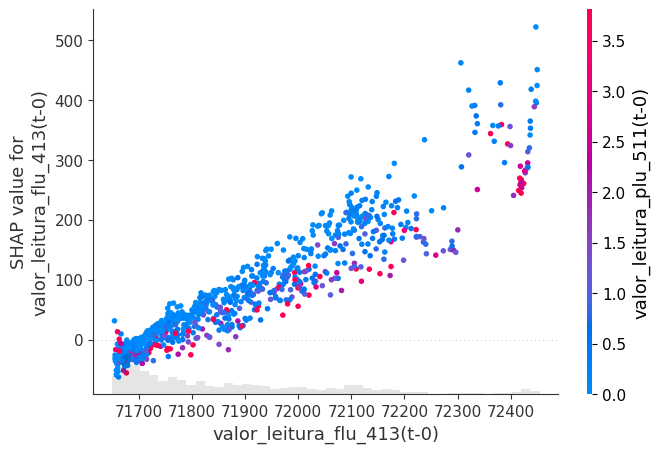

In [27]:
# 2 horas
nse_list = []
rmse_list = []
for horizon in [12]:

  train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023], horizon = horizon)
  X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = horizon)

  entradas = []
  X_train_general.columns
  for nome in X_train_general.columns:
    if ('plu' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome and 't-0' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
      entradas.append(nome)

  X_train_general = X_train_general[entradas]
  X_val_general = X_val_general[entradas]
  X_test_general = X_test_general[entradas]

  X_train = np.array(X_train_general)
  X_val = np.array(X_val_general)
  X_test = np.array(X_test_general)
  y_train = np.array(y_train_general.values).ravel()
  y_val = np.array(y_val_general.values).ravel()
  y_test = np.array(y_test_general.values).ravel()

  feature_names = X_train_general.columns

  # CatBoost
  rmse_mean = 0
  nse_mean = 0
  total_iter = 1
  for i in range(total_iter):
      model, importances = training_cb(X_train,y_train)
      prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
      #plot_results(prediction,y_val,nse)
      rmse_mean += rmse
      nse_mean += nse
  rmse_mean = rmse_mean/total_iter
  nse_mean = nse_mean/total_iter
  print('Average of RMSE:', rmse_mean)
  print('Average of NSE:',nse_mean)
  plot_importances(importances,feature_names,n_features_show = 10)

  explainer = shap.Explainer(model)
  #shap_values = explainer(X_train_general)
  shap_values = explainer(X_train_general.sort_values(by='valor_leitura_plu_1000868(t-0)', ascending = False)[0:1000])

  shap.plots.bar(shap_values)
  shap.plots.beeswarm(shap_values, max_display = 10)
  #shap.plots.beeswarm(shap_values, max_display = 20, order=shap_values.abs.max(0))
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])

## 3 horas

### XGBoost

Average of RMSE: 54.63403359533414
Average of NSE: 0.7145514228201352


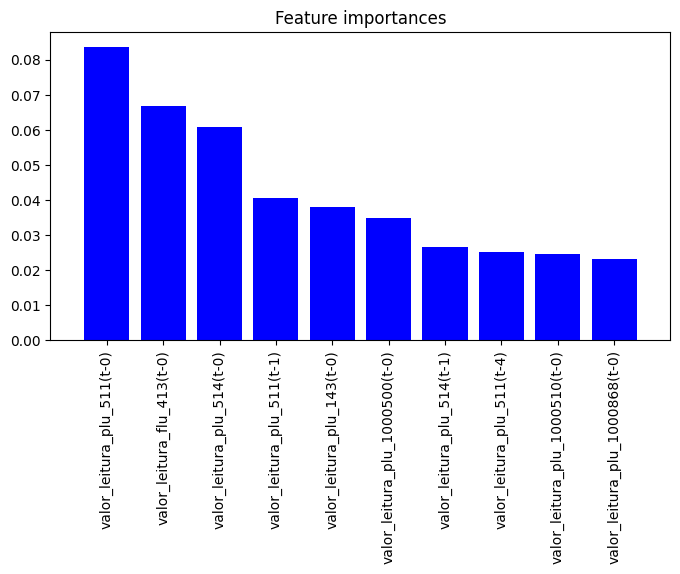

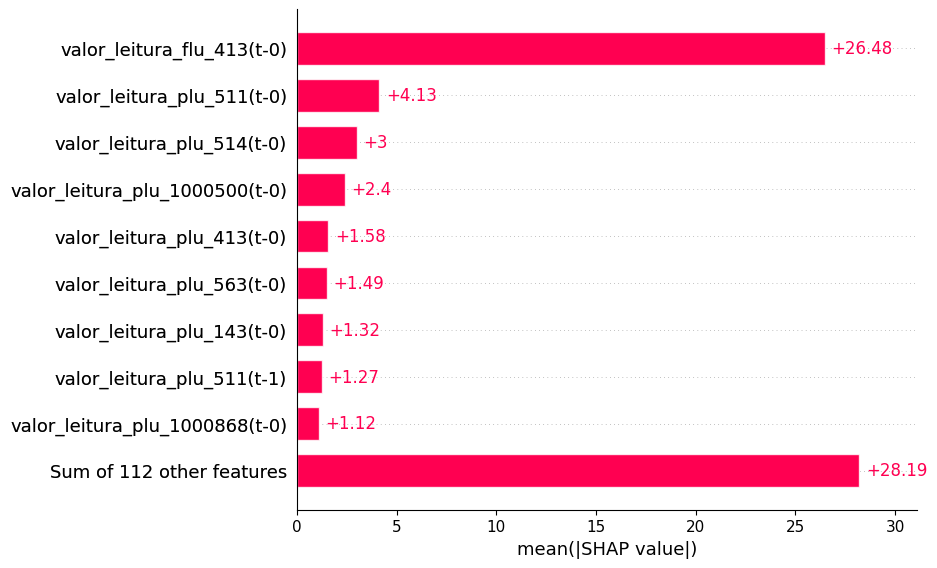

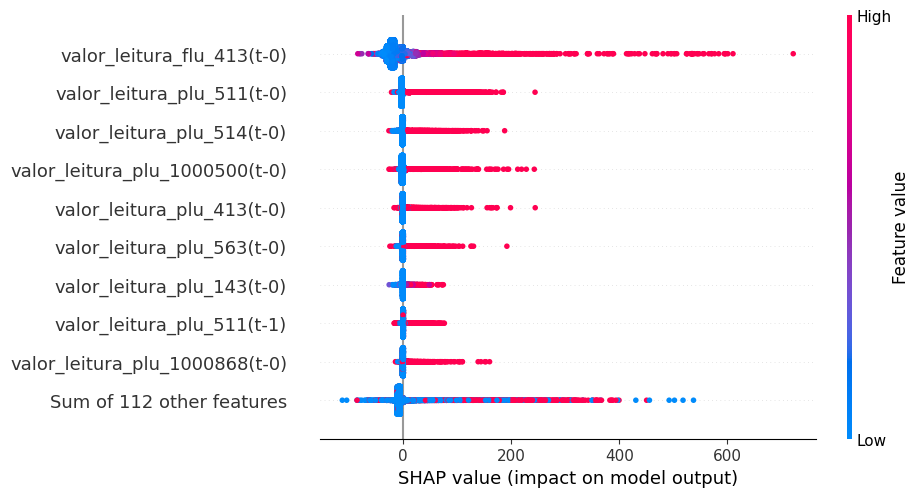

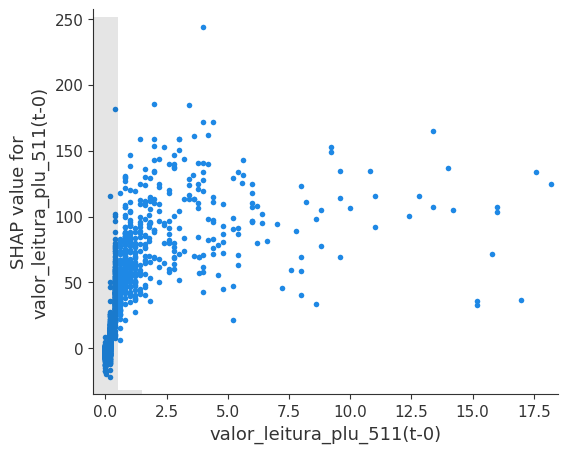

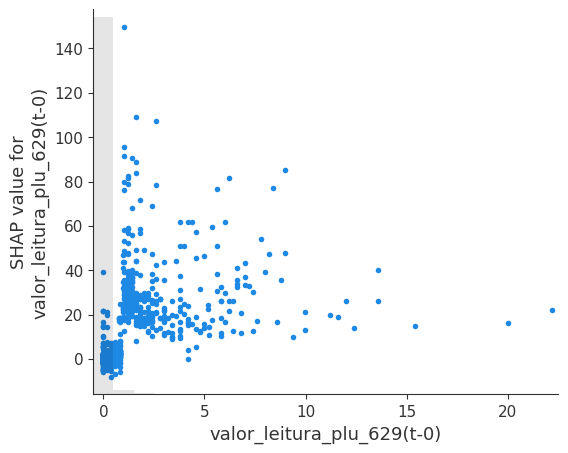

...

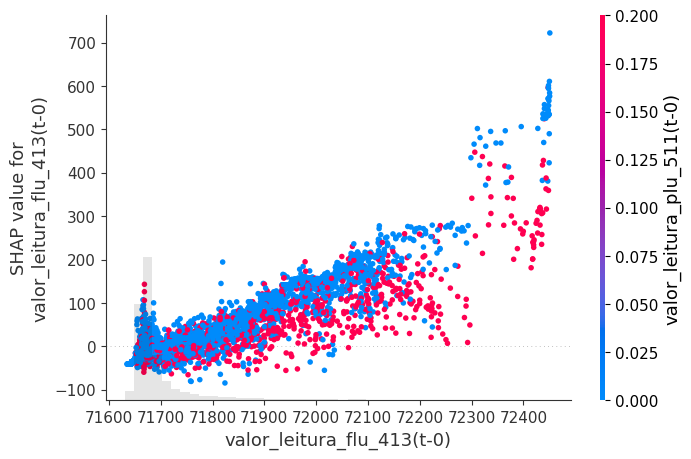

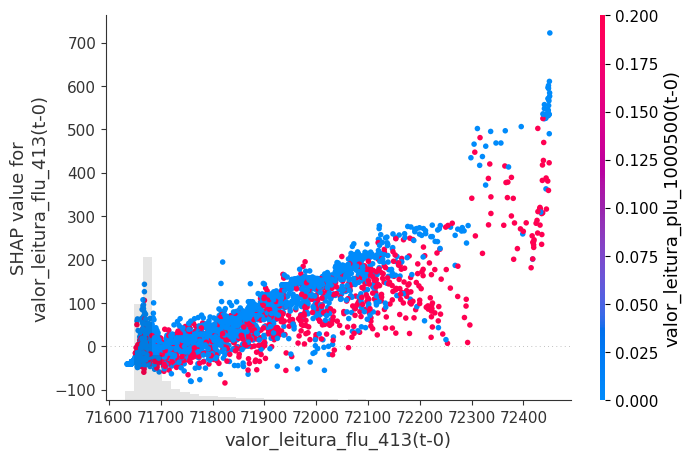

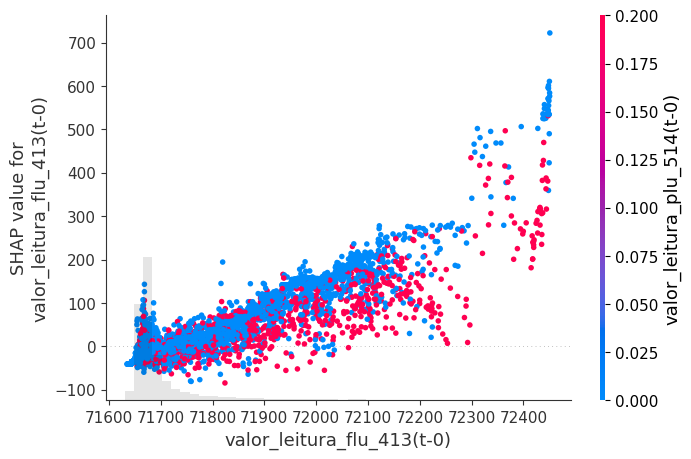

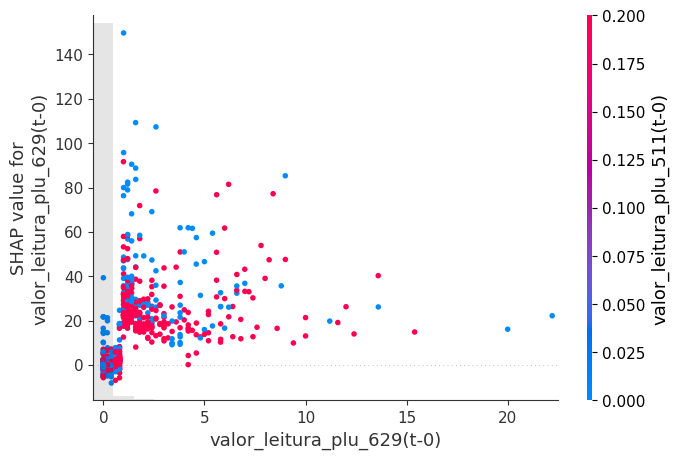

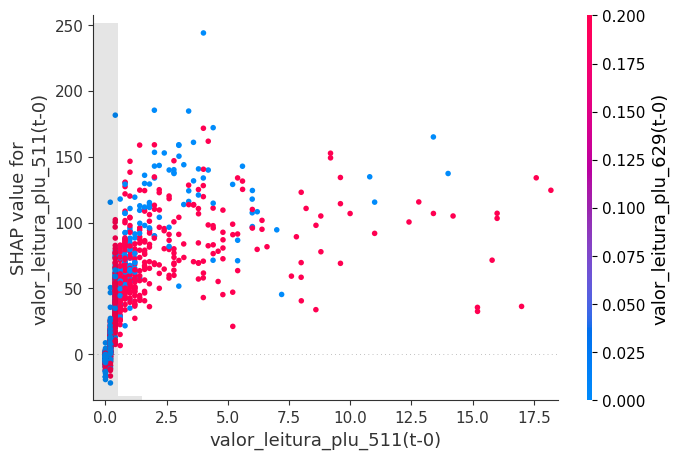

In [76]:
# 3 horas
nse_list = []
rmse_list = []
for horizon in [18]:

  train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023], horizon = horizon)
  X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = horizon)

  entradas = []
  X_train_general.columns
  for nome in X_train_general.columns:
    if ('plu' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome and 't-0' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
      entradas.append(nome)

  X_train_general = X_train_general[entradas]
  X_val_general = X_val_general[entradas]
  X_test_general = X_test_general[entradas]

  X_train = np.array(X_train_general)
  X_val = np.array(X_val_general)
  X_test = np.array(X_test_general)
  y_train = np.array(y_train_general.values).ravel()
  y_val = np.array(y_val_general.values).ravel()
  y_test = np.array(y_test_general.values).ravel()

  feature_names = X_train_general.columns

  # CatBoost
  rmse_mean = 0
  nse_mean = 0
  total_iter = 1
  for i in range(total_iter):
      model, importances = training_xgb(X_train,y_train)
      prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
      #plot_results(prediction,y_val,nse)
      rmse_mean += rmse
      nse_mean += nse
  rmse_mean = rmse_mean/total_iter
  nse_mean = nse_mean/total_iter
  print('Average of RMSE:', rmse_mean)
  print('Average of NSE:',nse_mean)
  plot_importances(importances,feature_names,n_features_show = 10)

  explainer = shap.Explainer(model)
  shap_values = explainer(X_train_general)
  #shap_values = explainer(X_train_general.sort_values(by='valor_leitura_flu_413(t-0)', ascending = False)[0:200])

  shap.plots.bar(shap_values)
  shap.plots.beeswarm(shap_values, max_display = 10)
  #shap.plots.beeswarm(shap_values, max_display = 20, order=shap_values.abs.max(0))
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_1000500(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_514(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_plu_629(t-0)"])

### CatBoost

Average of RMSE: 53.41131973305596
Average of NSE: 0.7271851729120435


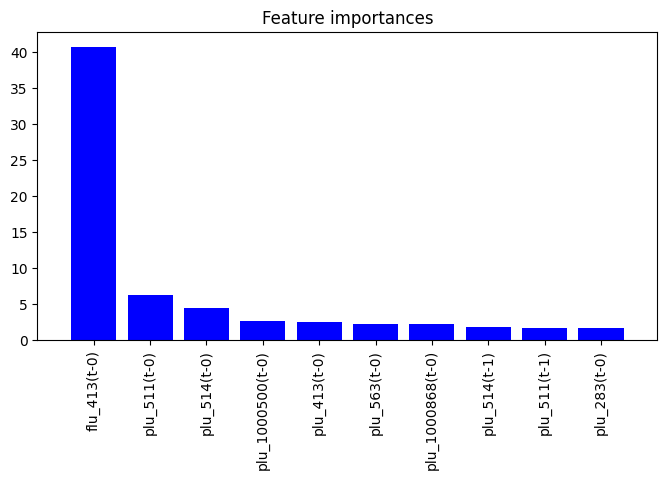

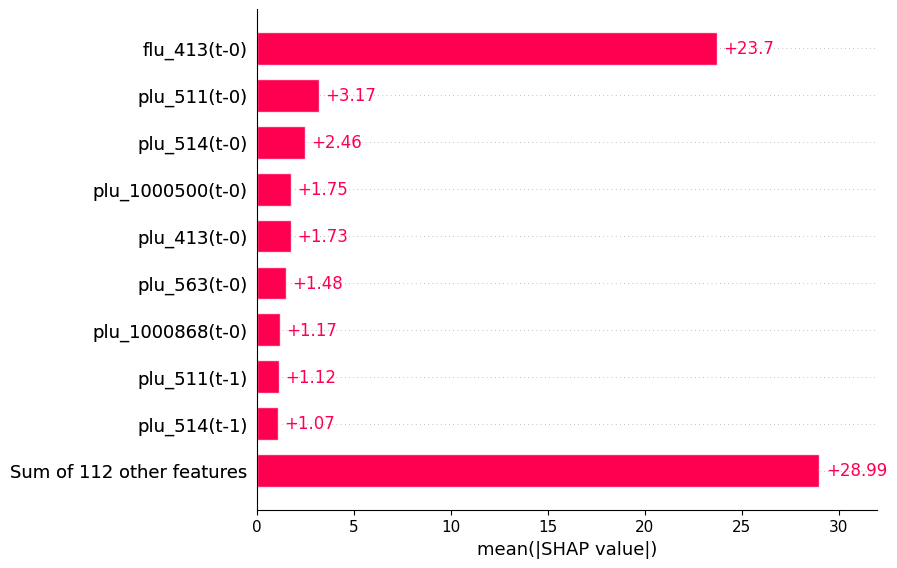

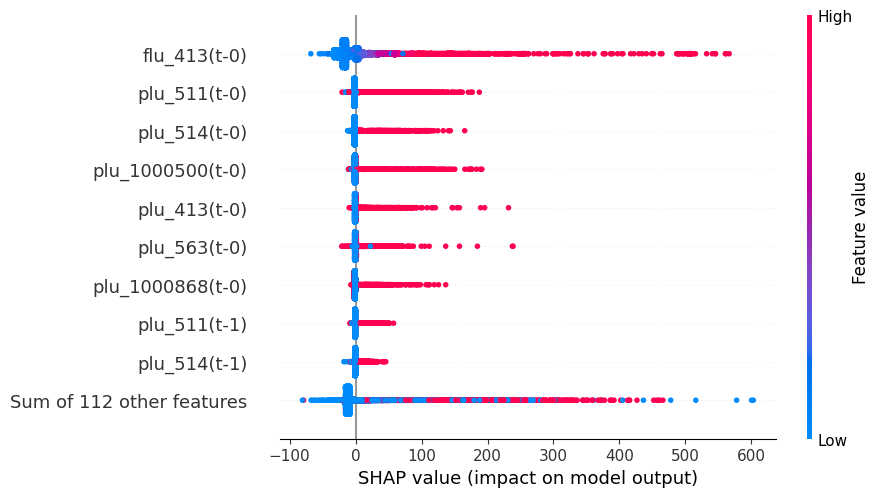

In [86]:
# 3 horas
nse_list = []
rmse_list = []
for horizon in [18]:

  train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023], horizon = horizon)
  X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = horizon)

  entradas = []
  X_train_general.columns
  for nome in X_train_general.columns:
    if ('plu' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome and 't-0' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
      entradas.append(nome)

  X_train_general = X_train_general[entradas]
  X_val_general = X_val_general[entradas]
  X_test_general = X_test_general[entradas]

  # Renaming columns
  for X in [X_train_general,X_val_general,X_test_general]:
     for column in X.columns:
        X.rename(columns={column: column.replace('valor_leitura_','')},inplace=True)

  X_train = np.array(X_train_general)
  X_val = np.array(X_val_general)
  X_test = np.array(X_test_general)
  y_train = np.array(y_train_general.values).ravel()
  y_val = np.array(y_val_general.values).ravel()
  y_test = np.array(y_test_general.values).ravel()

  feature_names = X_train_general.columns

  # CatBoost
  rmse_mean = 0
  nse_mean = 0
  total_iter = 1
  for i in range(total_iter):
      model, importances = training_cb(X_train,y_train)
      prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
      #plot_results(prediction,y_val,nse)
      rmse_mean += rmse
      nse_mean += nse
  rmse_mean = rmse_mean/total_iter
  nse_mean = nse_mean/total_iter
  print('Average of RMSE:', rmse_mean)
  print('Average of NSE:',nse_mean)
  plot_importances(importances,feature_names,n_features_show = 10)

  explainer = shap.Explainer(model)
  shap_values = explainer(X_train_general)
  #shap_values = explainer(X_train_general.sort_values(by='valor_leitura_flu_413(t-0)', ascending = False)[0:200])

  shap.plots.bar(shap_values)
  shap.plots.beeswarm(shap_values, max_display = 10)
  #shap.plots.beeswarm(shap_values, max_display = 20, order=shap_values.abs.max(0))
  # shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"])
  # shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"])
  # shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"])
  # shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])
  # shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])
  # shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])
  # shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_1000500(t-0)"])
  # shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_514(t-0)"])
  # shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])
  # shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_plu_629(t-0)"])

## 4 horas

### XGBoost

Average of RMSE: 67.4571987710065
Average of NSE: 0.5649684990166821


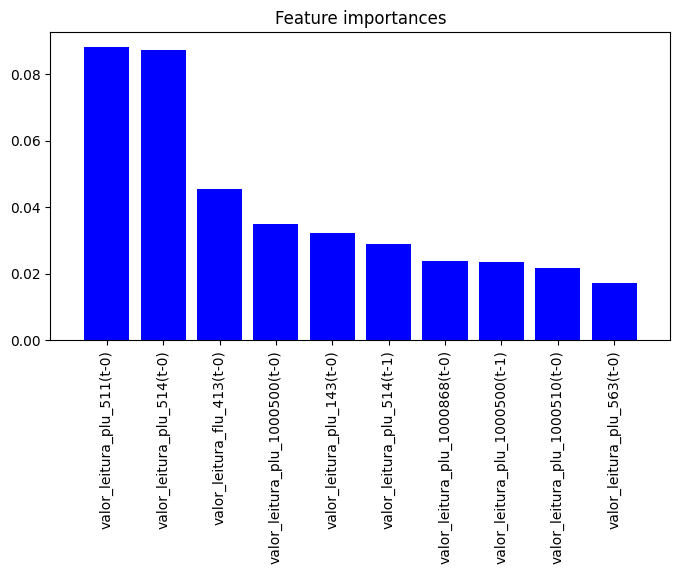

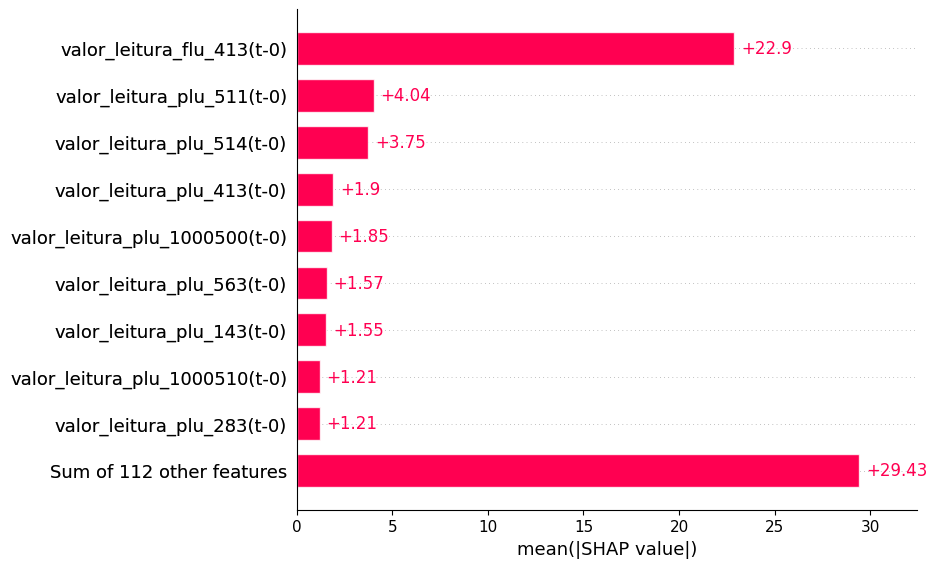

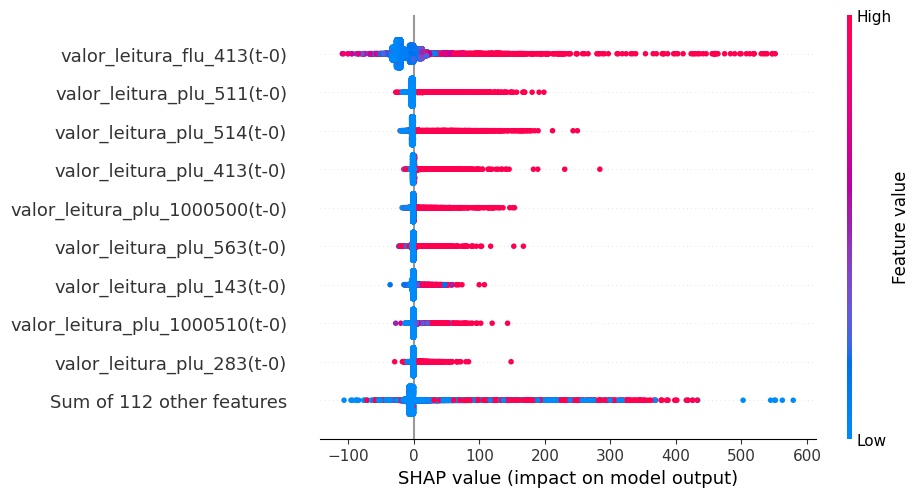

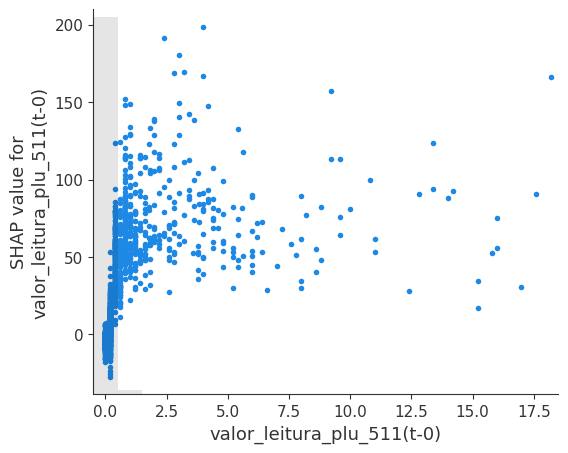

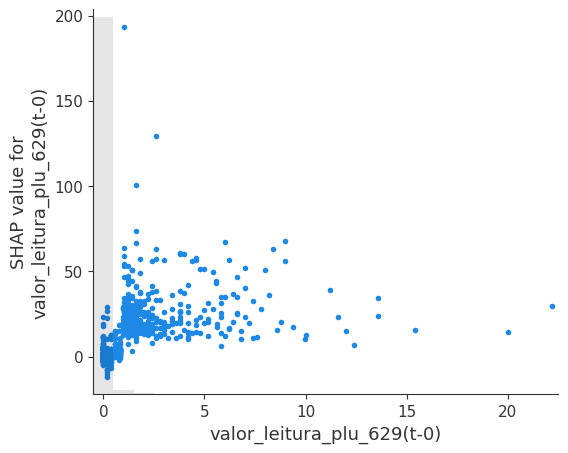

...

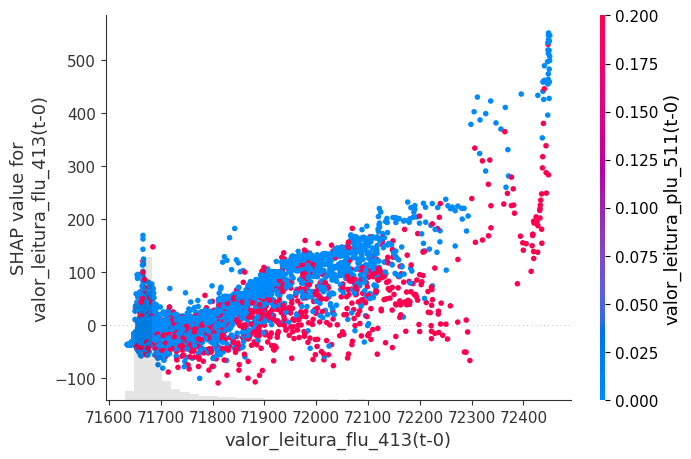

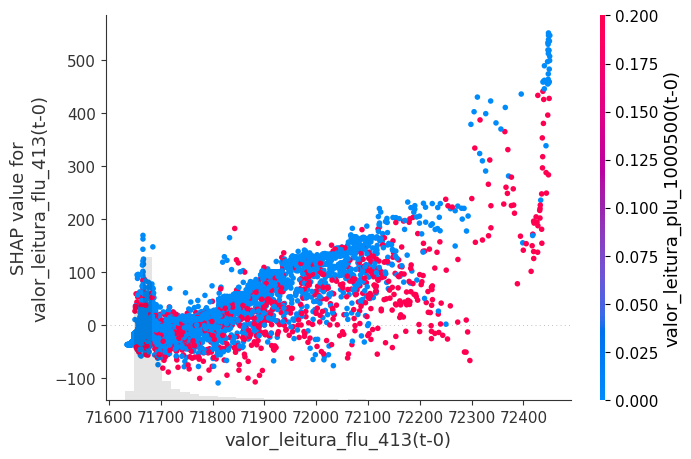

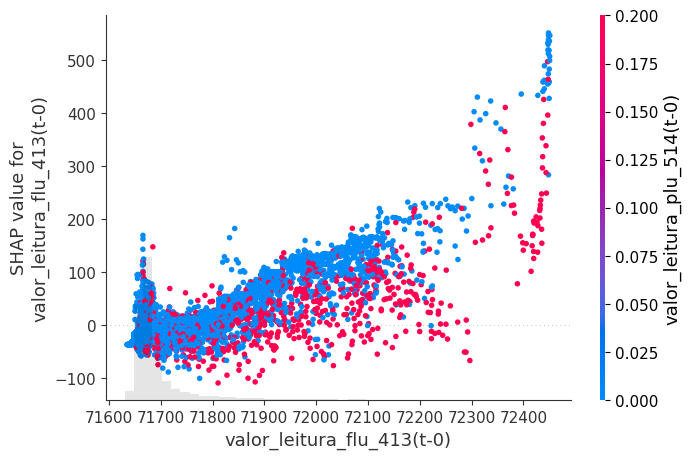

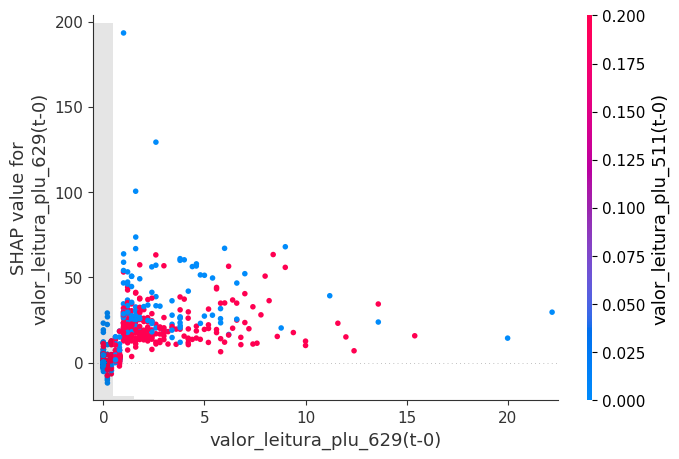

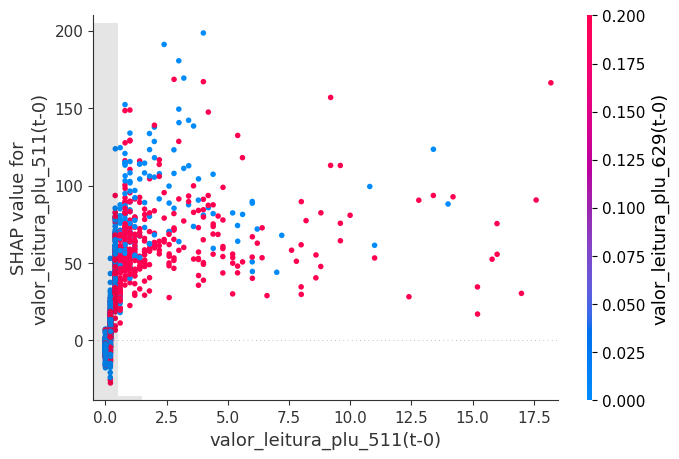

In [18]:
# 4 horas
nse_list = []
rmse_list = []
for horizon in [24]:

  train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023], horizon = horizon)
  X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = horizon)

  entradas = []
  X_train_general.columns
  for nome in X_train_general.columns:
    if ('plu' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome and 't-0' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
      entradas.append(nome)

  X_train_general = X_train_general[entradas]
  X_val_general = X_val_general[entradas]
  X_test_general = X_test_general[entradas]

  X_train = np.array(X_train_general)
  X_val = np.array(X_val_general)
  X_test = np.array(X_test_general)
  y_train = np.array(y_train_general.values).ravel()
  y_val = np.array(y_val_general.values).ravel()
  y_test = np.array(y_test_general.values).ravel()

  feature_names = X_train_general.columns

  # CatBoost
  rmse_mean = 0
  nse_mean = 0
  total_iter = 1
  for i in range(total_iter):
      model, importances = training_xgb(X_train,y_train)
      prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
      #plot_results(prediction,y_val,nse)
      rmse_mean += rmse
      nse_mean += nse
  rmse_mean = rmse_mean/total_iter
  nse_mean = nse_mean/total_iter
  print('Average of RMSE:', rmse_mean)
  print('Average of NSE:',nse_mean)
  plot_importances(importances,feature_names,n_features_show = 10)

  explainer = shap.Explainer(model)
  shap_values = explainer(X_train_general)
  #shap_values = explainer(X_train_general.sort_values(by='valor_leitura_flu_413(t-0)', ascending = False)[0:200])

  shap.plots.bar(shap_values)
  shap.plots.beeswarm(shap_values, max_display = 10)
  #shap.plots.beeswarm(shap_values, max_display = 20, order=shap_values.abs.max(0))
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_1000500(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_514(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_plu_629(t-0)"])

### CatBoost

Average of RMSE: 65.8209693515459
Average of NSE: 0.5858166388910795


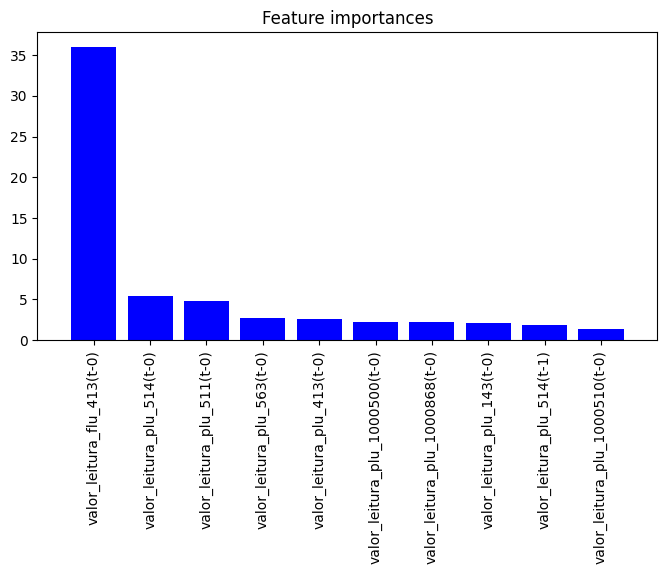

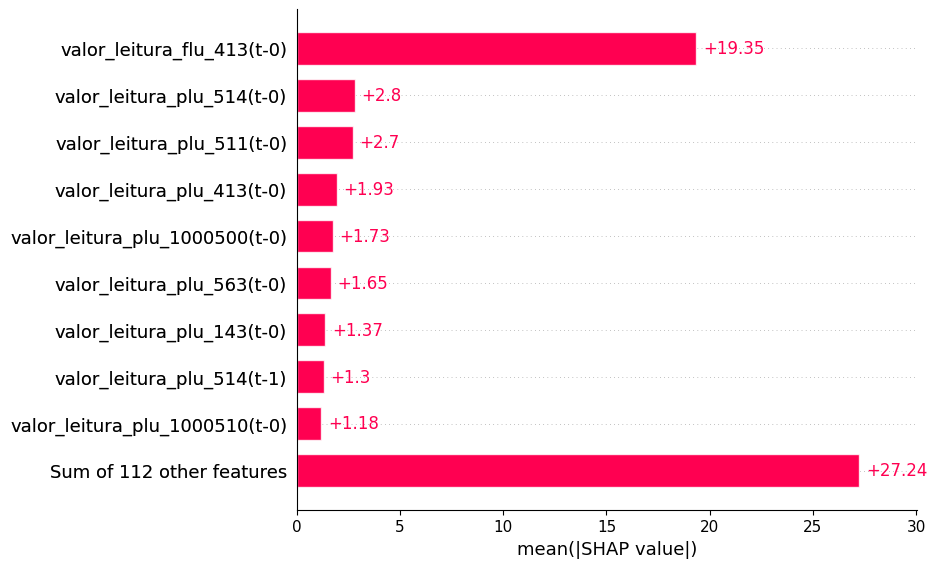

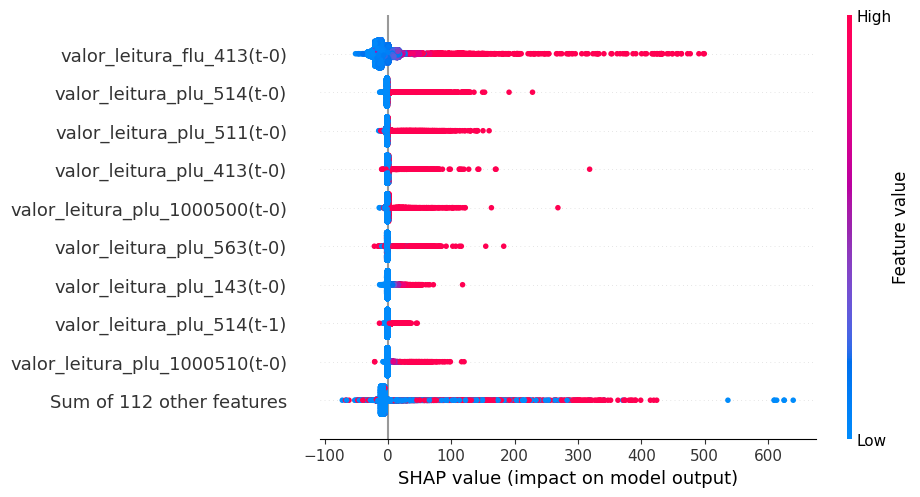

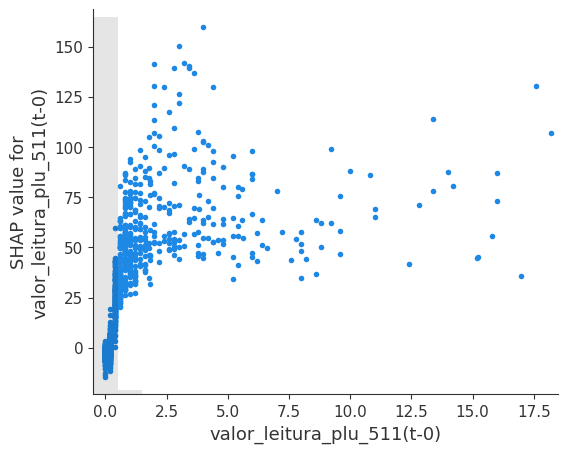

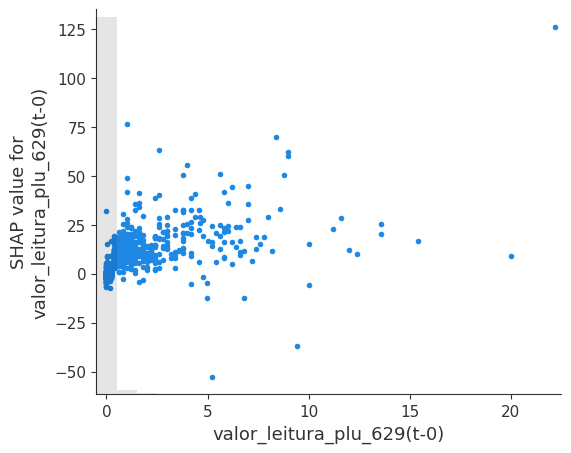

...

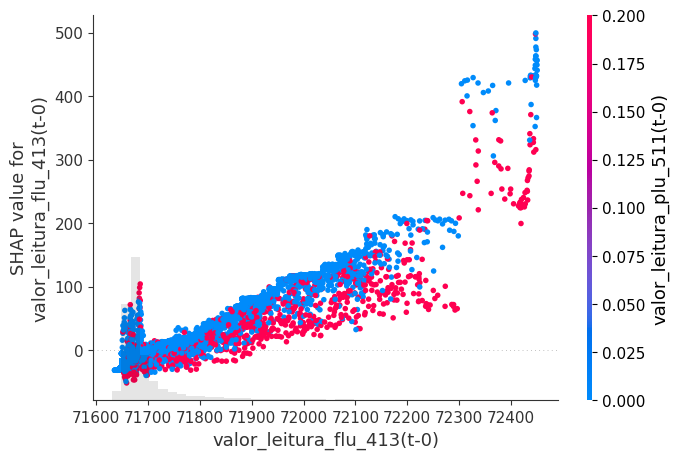

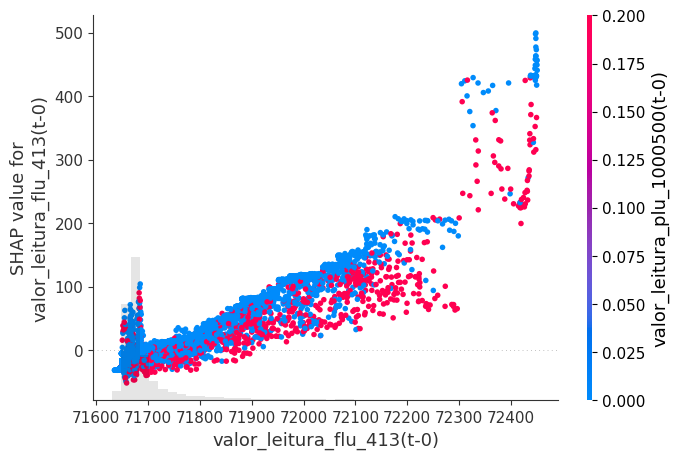

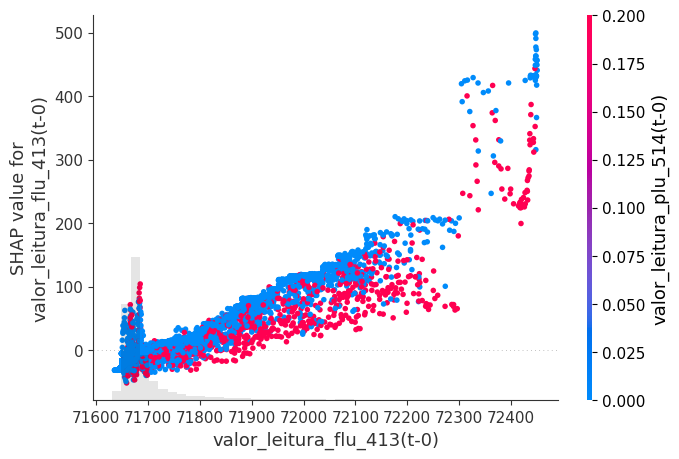

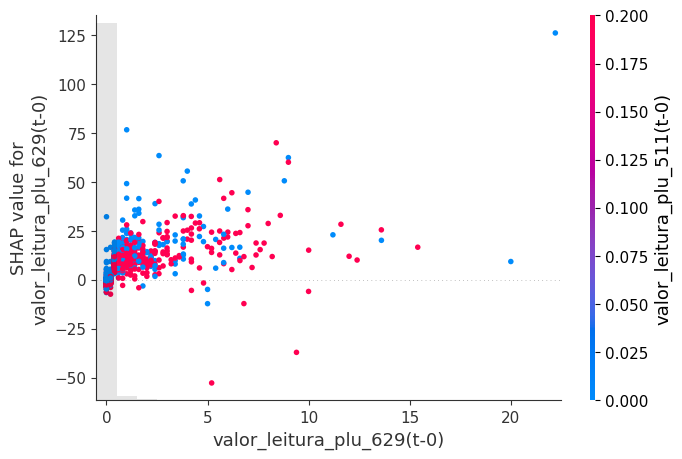

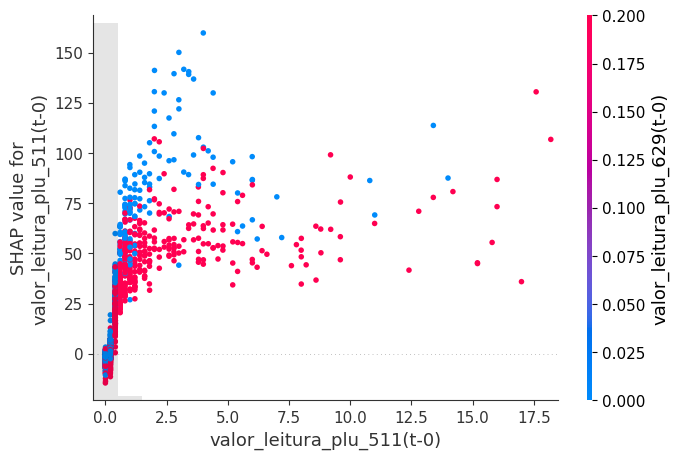

In [17]:
# 4 horas
nse_list = []
rmse_list = []
for horizon in [24]:

  train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023], horizon = horizon)
  X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = horizon)

  entradas = []
  X_train_general.columns
  for nome in X_train_general.columns:
    if ('plu' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome and 't-0' in nome) or ('valor_leitura_flu_413' in nome and 't-0' in nome):
    #if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
      entradas.append(nome)

  X_train_general = X_train_general[entradas]
  X_val_general = X_val_general[entradas]
  X_test_general = X_test_general[entradas]

  X_train = np.array(X_train_general)
  X_val = np.array(X_val_general)
  X_test = np.array(X_test_general)
  y_train = np.array(y_train_general.values).ravel()
  y_val = np.array(y_val_general.values).ravel()
  y_test = np.array(y_test_general.values).ravel()

  feature_names = X_train_general.columns

  # CatBoost
  rmse_mean = 0
  nse_mean = 0
  total_iter = 1
  for i in range(total_iter):
      model, importances = training_cb(X_train,y_train)
      prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
      #plot_results(prediction,y_val,nse)
      rmse_mean += rmse
      nse_mean += nse
  rmse_mean = rmse_mean/total_iter
  nse_mean = nse_mean/total_iter
  print('Average of RMSE:', rmse_mean)
  print('Average of NSE:',nse_mean)
  plot_importances(importances,feature_names,n_features_show = 10)

  explainer = shap.Explainer(model)
  shap_values = explainer(X_train_general)
  #shap_values = explainer(X_train_general.sort_values(by='valor_leitura_flu_413(t-0)', ascending = False)[0:200])

  shap.plots.bar(shap_values)
  shap.plots.beeswarm(shap_values, max_display = 10)
  #shap.plots.beeswarm(shap_values, max_display = 20, order=shap_values.abs.max(0))
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"],color=shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_1000500(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_514(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"],color=shap_values[:,"valor_leitura_plu_629(t-0)"])

## Vários testes

In [ ]:
nse_list = []
rmse_list = []
for horizon in [6,12,18,24,30,36,42,48]:

  train_df, val_df, test_df = preparar_dataframes(dataframes_treinamento = [df_2018, df_2019], dataframes_validacao = [df_2020], dataframes_teste = [df_2023], horizon = horizon)
  X_train_general,y_train_general,X_val_general,y_val_general,X_test_general,y_test_general = gerar_conjuntos(train_df,val_df,test_df, horizon = horizon)

  entradas = []
  X_train_general.columns
  for nome in X_train_general.columns:
    if ('plu' in nome) or ('valor_leitura_flu_413' in nome):
      entradas.append(nome)

  X_train_general = X_train_general[entradas]
  X_val_general = X_val_general[entradas]
  X_test_general = X_test_general[entradas]

  X_train = np.array(X_train_general)
  X_val = np.array(X_val_general)
  X_test = np.array(X_test_general)
  y_train = np.array(y_train_general.values).ravel()
  y_val = np.array(y_val_general.values).ravel()
  y_test = np.array(y_test_general.values).ravel()

  feature_names = X_train_general.columns

  # CatBoost
  rmse_mean = 0
  nse_mean = 0
  total_iter = 1
  for i in range(total_iter):
      model, importances = training_cb(X_train,y_train)
      prediction, rmse, nse = calc_predictions(X_train,y_train,X_val,y_val,model)
      #plot_results(prediction,y_val,nse)
      rmse_mean += rmse
      nse_mean += nse
  rmse_mean = rmse_mean/total_iter
  nse_mean = nse_mean/total_iter
  print('Average of RMSE:', rmse_mean)
  print('Average of NSE:',nse_mean)
  plot_importances(importances,feature_names,n_features_show = 20)

  explainer = shap.Explainer(model)
  shap_values = explainer(X_train_general)

  shap.plots.bar(shap_values)
  shap.plots.beeswarm(shap_values)
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_plu_629(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_511(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_629(t-0)"])
  shap.plots.scatter(shap_values[:,"valor_leitura_flu_413(t-0)"],color=shap_values[:,"valor_leitura_plu_514(t-0)"])